In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import time, datetime, argparse
import os, sys
import numpy as np
np.set_printoptions(precision=2)
import matplotlib.pyplot as plt
import copy as cp
import pickle

# PROJECT_PATH = '/home/nbuckman/Dropbox (MIT)/DRL/2020_01_cooperative_mpc/mpc-multiple-vehicles/'
PROJECT_PATH = '/Users/noambuckman/mpc-multiple-vehicles/'
sys.path.append(PROJECT_PATH)

import casadi as cas
import src.MPC_Casadi as mpc
import src.TrafficWorld as tw
import src.IterativeBestResponseMPCMultiple as mibr
import src.car_plotting_multiple as cmplot


##########################################################
svo_theta = np.pi/4.0
# random_seed = args.random_seed[0]
random_seed = 3
NEW = True
if NEW:
    optional_suffix = "ellipses"
    subdir_name = datetime.datetime.now().strftime("%Y%m%d_%H%M%S") + optional_suffix
    folder = "results/" + subdir_name + "/"
    os.makedirs(folder)
    os.makedirs(folder+"imgs/")
    os.makedirs(folder+"data/")
    os.makedirs(folder+"vids/")
    os.makedirs(folder+"plots/")
else:
    subdir_name = "20200224-103456_real_dim_CA"
    folder = "results/" + subdir_name + "/"
print(folder)
if random_seed > 0:
    np.random.seed(random_seed)

results/20200408_113759ellipses/


results/20200224-103456_real_dim_CA/
number ctrl pts:  25
Initial conditions MPC_i: 0 IBR_i: 0 x: 0.0 y:0.0
(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0.]]), array([9.59, 0.  , 0.  , 0.  , 8.38, 0.  ]))
(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0.]]), array([9.59, 3.7 , 0.  , 0.  , 8.38, 0.  ]))
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.22ms ( 69.98us)   3.26ms ( 70.83us)        46
       nlp_g  |  21.98ms (477.76us)  22.37ms (486.40us)        46
    nlp_grad  |   1.30ms (  1.30ms)   1.30ms (  1.30ms)         1
  nlp_grad_f  |   4.36ms ( 92.85us)   4.41ms ( 93.92us)        4

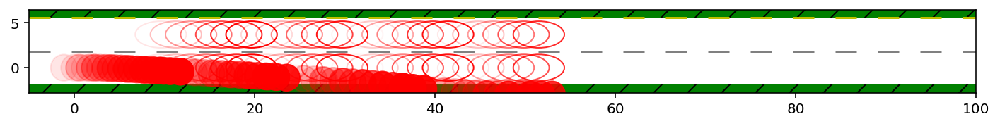

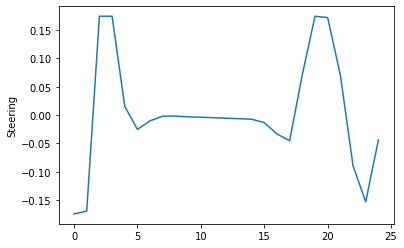

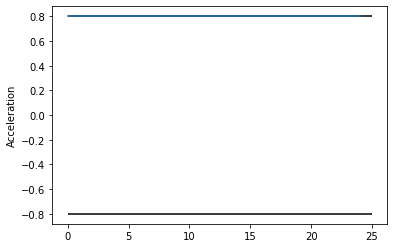

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.92ms ( 95.95us)   1.94ms ( 96.85us)        20
       nlp_g  |  12.81ms (640.65us)  13.32ms (665.78us)        20
    nlp_grad  |   1.63ms (  1.63ms)   1.64ms (  1.64ms)         1
  nlp_grad_f  |   2.38ms (113.14us)   2.69ms (127.90us)        21
  nlp_hess_l  |  78.31ms (  4.12ms)  79.21ms (  4.17ms)        19
   nlp_jac_g  |  46.74ms (  2.23ms)  47.15ms (  2.25ms)        21
       total  | 266.35ms (266.35ms) 269.95ms (269.95ms)         1
 i_mpc 0 n_round 0 i 01 Cost -216.55 Slack 0.00 
 J_i -216.552,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


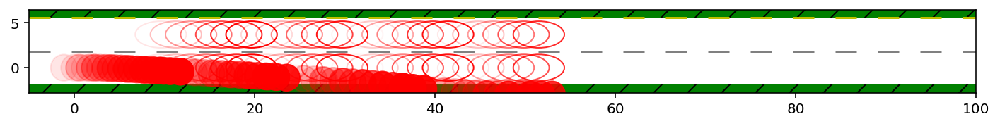

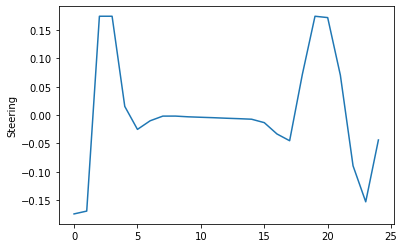

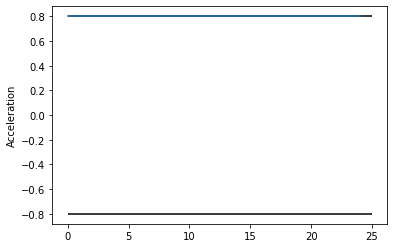

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.46ms ( 98.36us)   2.47ms ( 98.78us)        25
       nlp_g  |  13.31ms (532.40us)  13.39ms (535.45us)        25
    nlp_grad  |   1.41ms (  1.41ms)   1.41ms (  1.41ms)         1
  nlp_grad_f  |   2.62ms (100.88us)   2.67ms (102.73us)        26
  nlp_hess_l  |  89.83ms (  3.74ms)  90.88ms (  3.79ms)        24
   nlp_jac_g  |  52.01ms (  2.00ms)  52.52ms (  2.02ms)        26
       total  | 328.24ms (328.24ms) 331.40ms (331.40ms)         1
 i_mpc 0 n_round 0 i 01 Cost -216.55 Slack 0.00 
 J_i -216.552,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


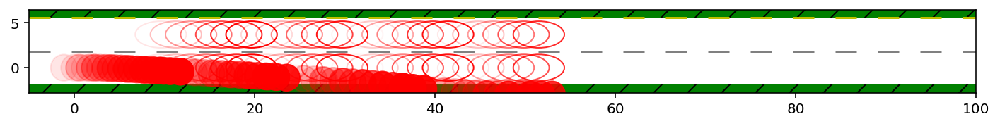

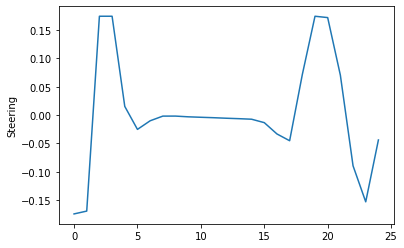

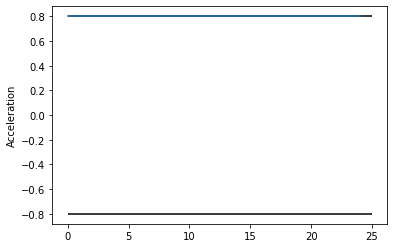

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.00ms (100.17us)   3.02ms (100.66us)        30
       nlp_g  |  17.38ms (579.40us)  17.46ms (582.10us)        30
    nlp_grad  |   1.67ms (  1.67ms)   1.71ms (  1.71ms)         1
  nlp_grad_f  |   3.41ms (110.16us)   3.44ms (110.85us)        31
  nlp_hess_l  | 111.18ms (  3.83ms) 112.92ms (  3.89ms)        29
   nlp_jac_g  |  63.60ms (  2.05ms)  64.19ms (  2.07ms)        31
       total  | 413.90ms (413.90ms) 419.27ms (419.27ms)         1
 i_mpc 0 n_round 0 i 01 Cost -216.55 Slack 0.00 
 J_i -216.552,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


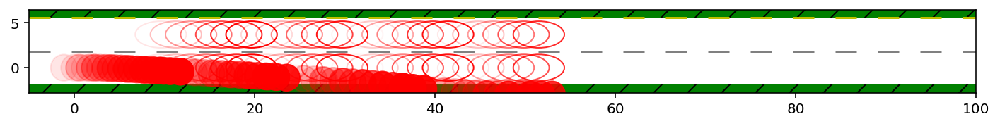

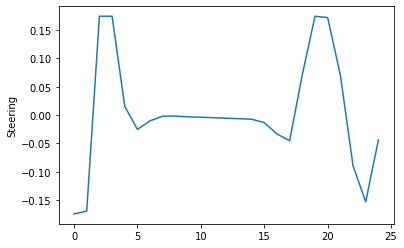

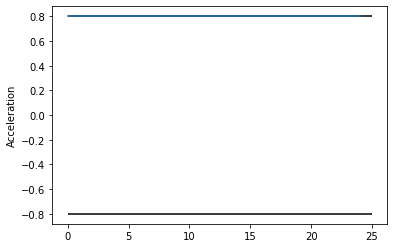

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.01ms ( 91.07us)   4.02ms ( 91.41us)        44
       nlp_g  |  25.86ms (587.80us)  25.88ms (588.24us)        44
    nlp_grad  |   1.44ms (  1.44ms)   1.44ms (  1.44ms)         1
  nlp_grad_f  |   4.19ms ( 93.04us)   4.43ms ( 98.45us)        45
  nlp_hess_l  | 161.71ms (  3.76ms) 163.25ms (  3.80ms)        43
   nlp_jac_g  |  89.60ms (  1.99ms)  90.10ms (  2.00ms)        45
       total  | 615.92ms (615.92ms) 621.37ms (621.37ms)         1
 i_mpc 0 n_round 0 i 01 Cost -216.55 Slack 0.00 
 J_i -216.552,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


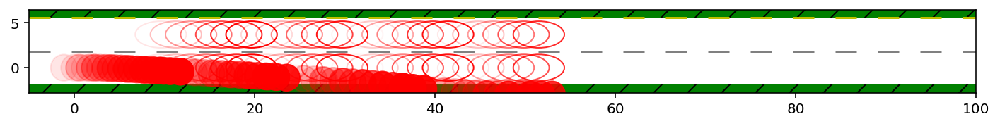

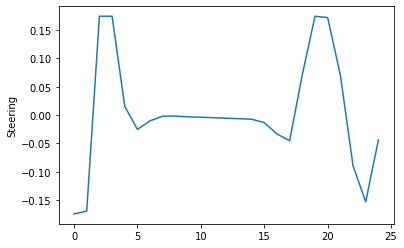

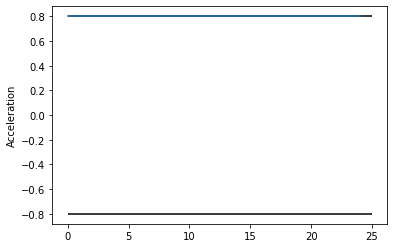

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   7.27ms (103.81us)   7.37ms (105.31us)        70
       nlp_g  |  45.84ms (654.87us)  46.66ms (666.61us)        70
    nlp_grad  |   1.84ms (  1.84ms)   1.85ms (  1.85ms)         1
  nlp_grad_f  |   4.21ms (120.34us)   4.45ms (127.06us)        35
  nlp_hess_l  | 213.16ms (  4.26ms) 217.46ms (  4.35ms)        50
   nlp_jac_g  | 128.63ms (  2.38ms) 134.33ms (  2.49ms)        54
       total  | 815.99ms (815.99ms) 842.64ms (842.64ms)         1
 i_mpc 0 n_round 0 i 01 Cost -197.07 Slack 0.00 
 J_i -197.068,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


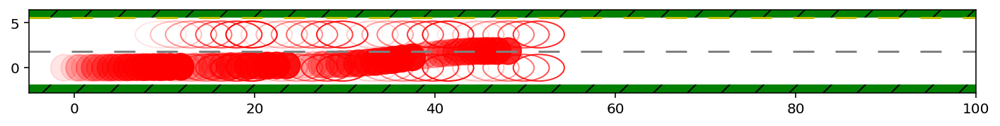

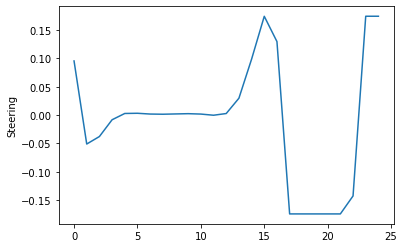

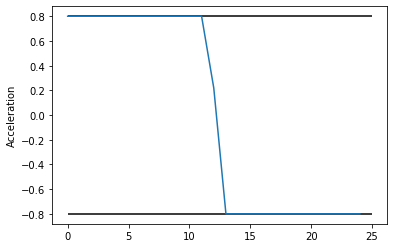

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.58ms (123.89us)   4.77ms (128.91us)        37
       nlp_g  |  29.48ms (796.65us)  38.43ms (  1.04ms)        37
    nlp_grad  |   1.73ms (  1.73ms)   1.73ms (  1.73ms)         1
  nlp_grad_f  |   4.65ms (122.29us)   4.86ms (127.78us)        38
  nlp_hess_l  | 169.54ms (  4.71ms) 191.95ms (  5.33ms)        36
   nlp_jac_g  |  99.88ms (  2.63ms) 116.45ms (  3.06ms)        38
       total  | 652.76ms (652.76ms) 746.28ms (746.28ms)         1
 i_mpc 0 n_round 0 i 01 Cost -197.07 Slack 0.00 
 J_i -197.068,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


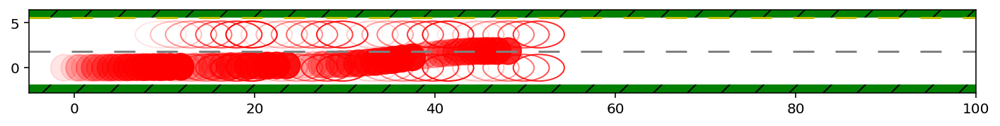

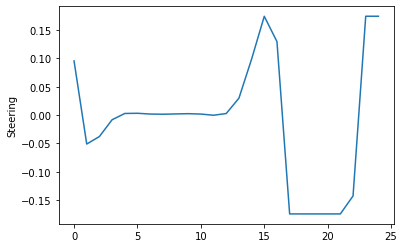

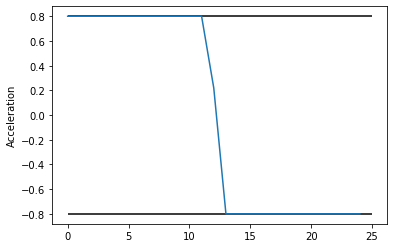

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.32ms (107.13us)   3.41ms (110.05us)        31
       nlp_g  |  21.37ms (689.35us)  21.83ms (704.05us)        31
    nlp_grad  |   1.78ms (  1.78ms)   1.78ms (  1.78ms)         1
  nlp_grad_f  |   3.62ms (113.00us)   3.65ms (114.02us)        32
  nlp_hess_l  | 134.05ms (  4.47ms) 138.77ms (  4.63ms)        30
   nlp_jac_g  |  74.78ms (  2.34ms)  75.82ms (  2.37ms)        32
       total  | 486.48ms (486.48ms) 498.04ms (498.04ms)         1
 i_mpc 0 n_round 0 i 01 Cost -216.55 Slack 0.00 
 J_i -216.552,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


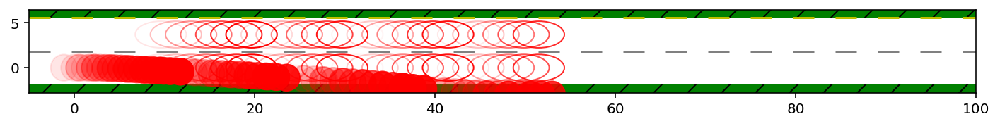

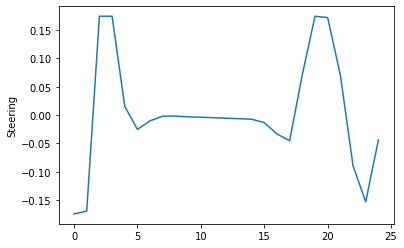

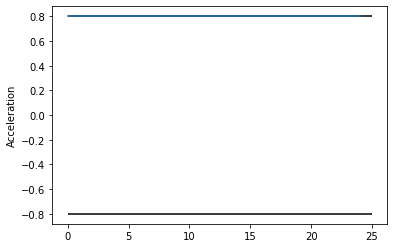

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.72ms (100.59us)   3.84ms (103.84us)        37
       nlp_g  |  24.32ms (657.22us)  24.69ms (667.31us)        37
    nlp_grad  |   1.72ms (  1.72ms)   1.72ms (  1.72ms)         1
  nlp_grad_f  |   3.85ms (101.37us)   3.85ms (101.39us)        38
  nlp_hess_l  | 151.38ms (  4.20ms) 162.05ms (  4.50ms)        36
   nlp_jac_g  |  87.00ms (  2.29ms)  94.79ms (  2.49ms)        38
       total  | 566.99ms (566.99ms) 596.36ms (596.36ms)         1
 i_mpc 0 n_round 0 i 01 Cost -216.55 Slack 0.00 
 J_i -216.552,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


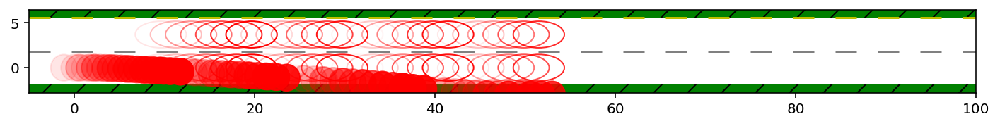

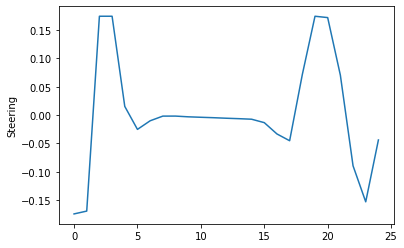

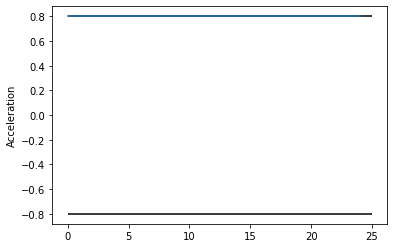

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.23ms ( 76.98us)   3.29ms ( 78.31us)        42
       nlp_g  |  24.59ms (585.57us)  24.85ms (591.61us)        42
    nlp_grad  |   1.50ms (  1.50ms)   1.50ms (  1.50ms)         1
  nlp_grad_f  |   4.09ms (110.57us)   4.15ms (112.09us)        37
  nlp_hess_l  | 135.07ms (  3.86ms) 136.97ms (  3.91ms)        35
   nlp_jac_g  |  78.98ms (  2.13ms)  79.89ms (  2.16ms)        37
       total  | 476.95ms (476.95ms) 487.20ms (487.20ms)         1
 i_mpc 0 n_round 0 i 01 Cost -216.55 Slack 0.00 
 J_i -216.552,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


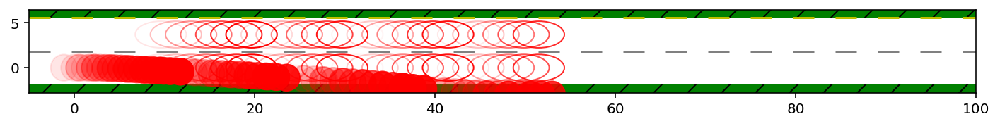

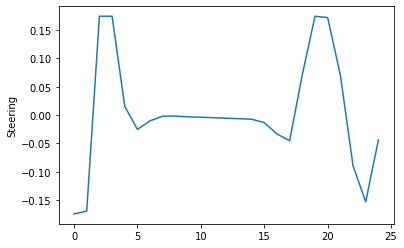

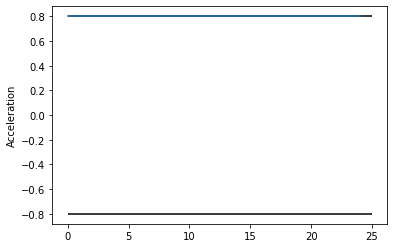

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.48ms ( 99.08us)   2.49ms ( 99.73us)        25
       nlp_g  |  16.39ms (655.48us)  16.76ms (670.33us)        25
    nlp_grad  |   1.72ms (  1.72ms)   1.72ms (  1.72ms)         1
  nlp_grad_f  |   2.93ms (112.85us)   2.97ms (114.41us)        26
  nlp_hess_l  |  98.75ms (  4.11ms) 100.92ms (  4.20ms)        24
   nlp_jac_g  |  58.32ms (  2.24ms)  59.38ms (  2.28ms)        26
       total  | 358.20ms (358.20ms) 366.29ms (366.29ms)         1
 i_mpc 0 n_round 0 i 01 Cost -216.55 Slack 0.00 
 J_i -216.552,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


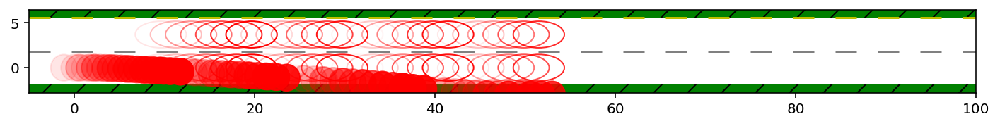

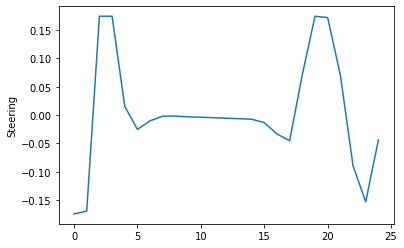

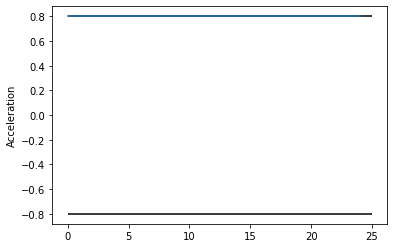

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.33ms (104.09us)   3.36ms (105.15us)        32
       nlp_g  |  21.20ms (662.50us)  21.56ms (673.85us)        32
    nlp_grad  |   1.69ms (  1.69ms)   1.69ms (  1.69ms)         1
  nlp_grad_f  |   3.51ms (106.21us)   3.52ms (106.63us)        33
  nlp_hess_l  | 121.87ms (  3.93ms) 123.86ms (  4.00ms)        31
   nlp_jac_g  |  70.73ms (  2.14ms)  71.24ms (  2.16ms)        33
       total  | 455.84ms (455.84ms) 466.84ms (466.84ms)         1
 i_mpc 0 n_round 0 i 01 Cost -216.55 Slack 0.00 
 J_i -216.552,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


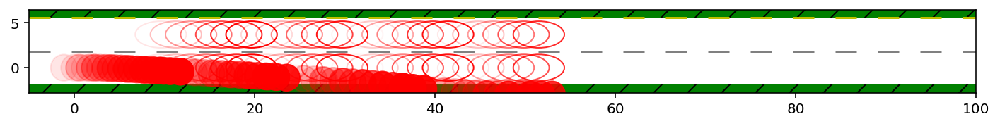

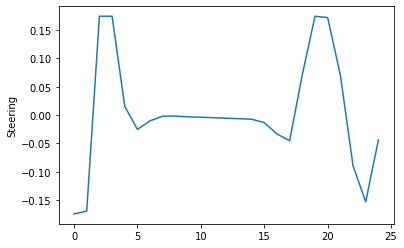

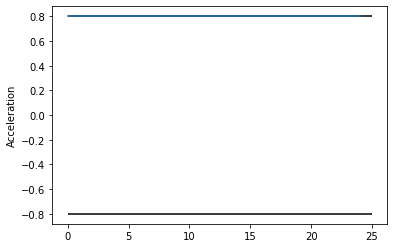

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   7.15ms (111.69us)   7.21ms (112.70us)        64
       nlp_g  |  42.07ms (657.28us)  42.78ms (668.47us)        64
    nlp_grad  |   1.80ms (  1.80ms)   1.81ms (  1.81ms)         1
  nlp_grad_f  |   7.39ms (121.07us)   7.44ms (121.92us)        61
  nlp_hess_l  | 269.61ms (  4.57ms) 282.47ms (  4.79ms)        59
   nlp_jac_g  | 142.49ms (  2.34ms) 146.39ms (  2.40ms)        61
       total  | 860.19ms (860.19ms) 888.41ms (888.41ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.99ms (110.50us)   2.00ms (111.14us)        18
       nlp_g  |  12.32ms (684.28us)  12.55ms (697.02us)        18
    nlp_grad  |   2.11ms (  2.11ms)   2.40ms (  2.40ms)         1
  nlp_grad_f  |   2.51ms (132.00us)   2.54ms (133.85us)        19
  nlp_hess_l  |  78.89ms (  4.64ms)  80.13ms (  4.71ms)        17
   nlp_jac_g  |  44.05ms (  2.32ms)  44.73ms (  2.35ms)     

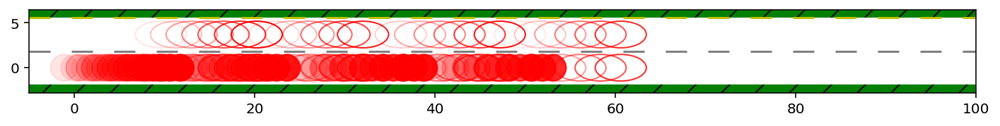

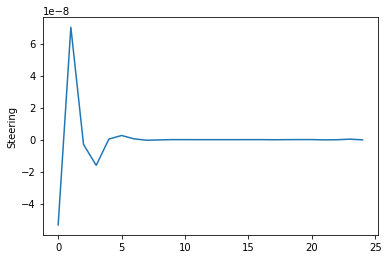

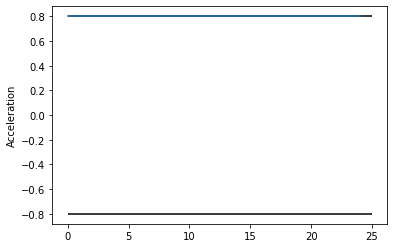

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  | 935.00us ( 93.50us) 940.94us ( 94.09us)        10
       nlp_g  |   5.24ms (523.90us)   5.28ms (528.10us)        10
    nlp_grad  |   1.40ms (  1.40ms)   1.40ms (  1.40ms)         1
  nlp_grad_f  |   1.09ms ( 99.45us)   1.10ms ( 99.96us)        11
  nlp_hess_l  |  33.31ms (  3.70ms)  33.78ms (  3.75ms)         9
   nlp_jac_g  |  20.65ms (  1.88ms)  20.75ms (  1.89ms)        11
       total  | 126.59ms (126.59ms) 127.45ms (127.45ms)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


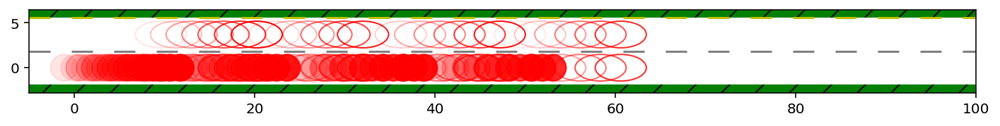

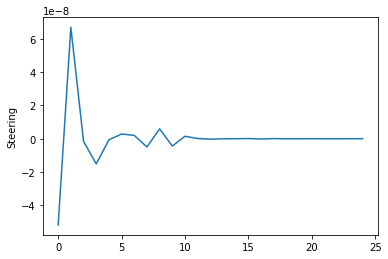

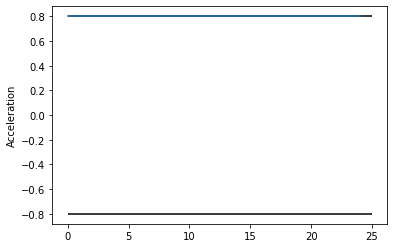

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.75ms (105.88us)   2.77ms (106.44us)        26
       nlp_g  |  14.18ms (545.54us)  14.27ms (549.03us)        26
    nlp_grad  |   1.60ms (  1.60ms)   1.62ms (  1.62ms)         1
  nlp_grad_f  |   2.60ms (100.08us)   2.62ms (100.65us)        26
  nlp_hess_l  |  91.55ms (  3.81ms)  92.30ms (  3.85ms)        24
   nlp_jac_g  |  52.64ms (  2.02ms)  53.13ms (  2.04ms)        26
       total  | 361.35ms (361.35ms) 363.85ms (363.85ms)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


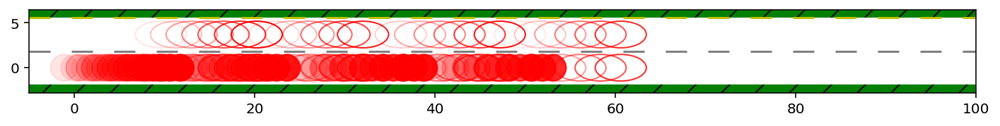

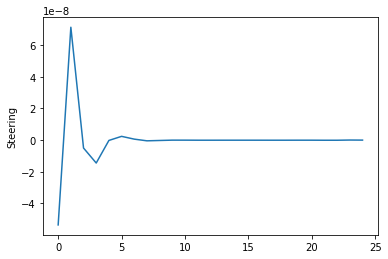

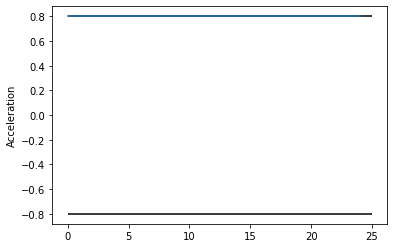

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.50ms (145.26us)  67.77ms (  2.19ms)        31
       nlp_g  |  23.30ms (751.68us)  42.32ms (  1.37ms)        31
    nlp_grad  |   2.10ms (  2.10ms)   2.16ms (  2.16ms)         1
  nlp_grad_f  |   5.32ms (166.34us)   6.12ms (191.10us)        32
  nlp_hess_l  | 170.04ms (  5.67ms) 254.24ms (  8.47ms)        30
   nlp_jac_g  | 100.21ms (  3.13ms) 300.56ms (  9.39ms)        32
       total  | 671.47ms (671.47ms)   1.39 s (  1.39 s)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


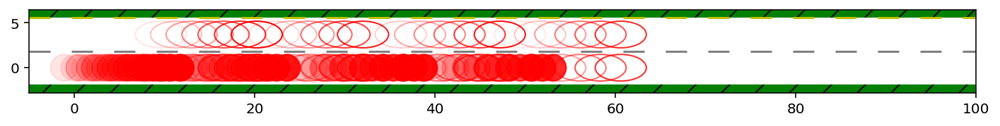

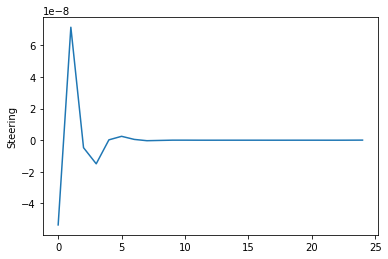

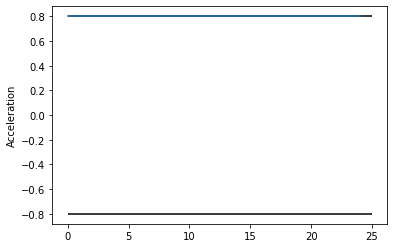

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   6.07ms (102.88us)   6.49ms (109.92us)        59
       nlp_g  |  41.79ms (708.25us)  69.04ms (  1.17ms)        59
    nlp_grad  |   2.34ms (  2.34ms)   2.37ms (  2.37ms)         1
  nlp_grad_f  |   7.25ms (120.87us)   7.32ms (121.96us)        60
  nlp_hess_l  | 262.91ms (  4.53ms) 336.50ms (  5.80ms)        58
   nlp_jac_g  | 152.62ms (  2.54ms) 293.20ms (  4.89ms)        60
       total  |   1.00 s (  1.00 s)   1.58 s (  1.58 s)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


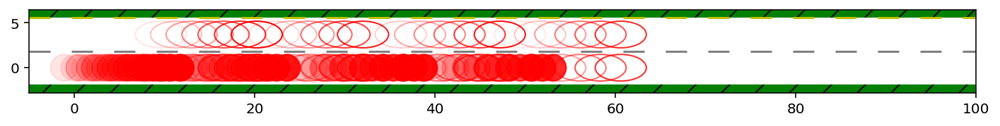

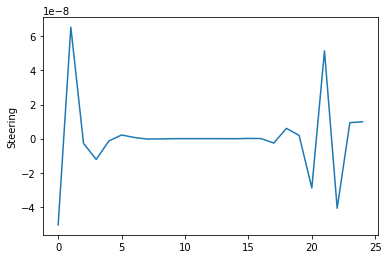

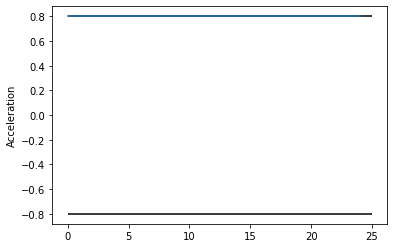

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  | 972.00us ( 88.36us) 977.87us ( 88.90us)        11
       nlp_g  |   7.01ms (637.36us)   7.09ms (644.15us)        11
    nlp_grad  |   1.95ms (  1.95ms)   2.00ms (  2.00ms)         1
  nlp_grad_f  |   1.42ms (118.17us)   1.44ms (120.30us)        12
  nlp_hess_l  |  39.16ms (  3.92ms)  44.25ms (  4.42ms)        10
   nlp_jac_g  |  26.12ms (  2.18ms)  26.93ms (  2.24ms)        12
       total  | 149.17ms (149.17ms) 157.21ms (157.21ms)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


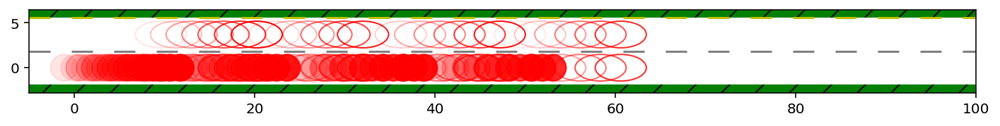

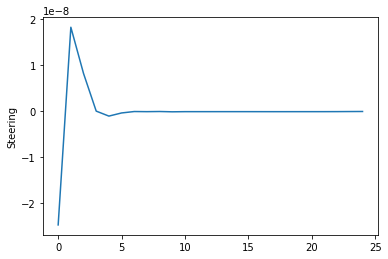

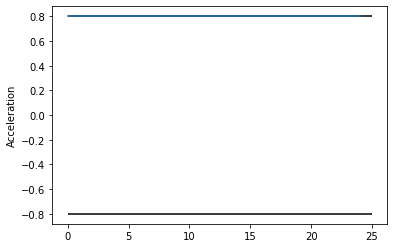

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.14ms (101.45us)   3.21ms (103.46us)        31
       nlp_g  |  21.55ms (695.00us)  21.81ms (703.46us)        31
    nlp_grad  |   1.97ms (  1.97ms)   1.98ms (  1.98ms)         1
  nlp_grad_f  |   3.44ms (118.62us)   3.78ms (130.23us)        29
  nlp_hess_l  | 114.15ms (  4.23ms) 116.01ms (  4.30ms)        27
   nlp_jac_g  |  72.78ms (  2.51ms)  77.45ms (  2.67ms)        29
       total  | 446.44ms (446.44ms) 462.25ms (462.25ms)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


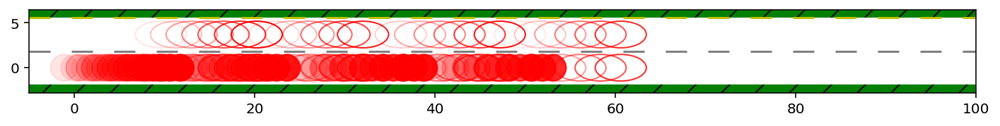

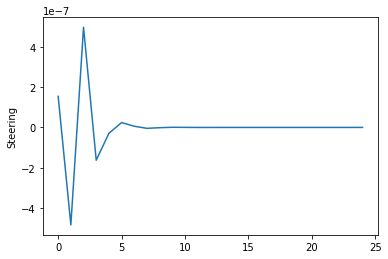

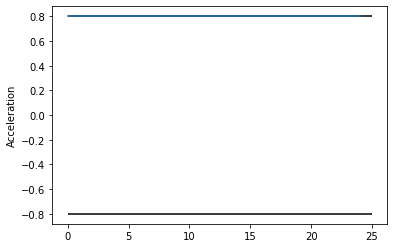

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.27ms ( 94.96us)   4.81ms (106.82us)        45
       nlp_g  |  24.06ms (534.76us)  24.43ms (542.98us)        45
    nlp_grad  |   1.48ms (  1.48ms)   1.48ms (  1.48ms)         1
  nlp_grad_f  |   4.05ms (106.58us)   6.12ms (161.12us)        38
  nlp_hess_l  | 133.23ms (  3.70ms) 136.42ms (  3.79ms)        36
   nlp_jac_g  |  75.21ms (  1.98ms)  86.87ms (  2.29ms)        38
       total  | 531.47ms (531.47ms) 560.40ms (560.40ms)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


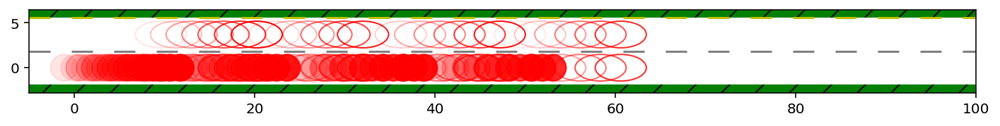

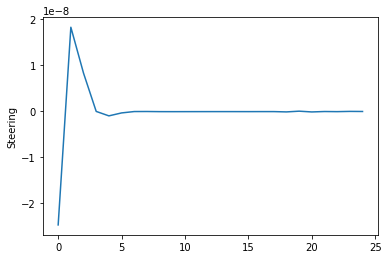

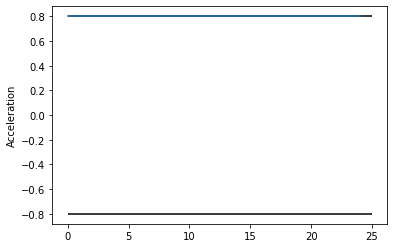

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   8.76ms (134.78us)   9.53ms (146.55us)        65
       nlp_g  |  46.27ms (711.82us)  49.51ms (761.68us)        65
    nlp_grad  |   1.58ms (  1.58ms)   1.58ms (  1.58ms)         1
  nlp_grad_f  |   8.21ms (128.25us)   8.31ms (129.77us)        64
  nlp_hess_l  | 286.42ms (  4.62ms) 310.98ms (  5.02ms)        62
   nlp_jac_g  | 156.83ms (  2.45ms) 169.36ms (  2.65ms)        64
       total  |   1.13 s (  1.13 s)   1.21 s (  1.21 s)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


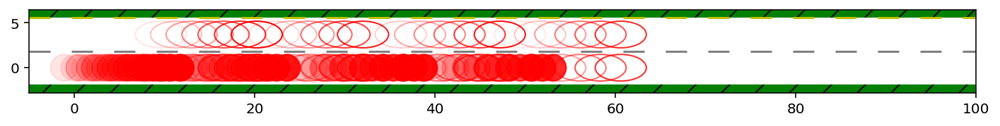

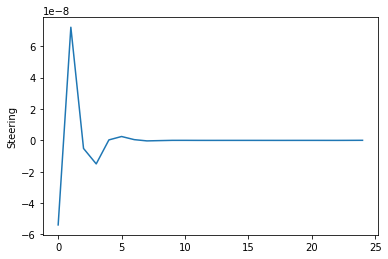

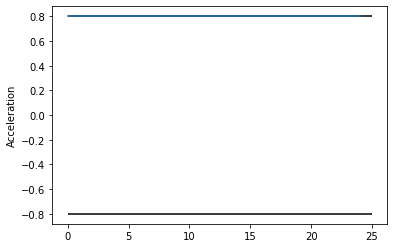

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  | 849.00us (106.12us) 830.95us (103.87us)         8
       nlp_g  |   5.12ms (639.75us)   5.19ms (648.86us)         8
    nlp_grad  |   1.63ms (  1.63ms)   1.65ms (  1.65ms)         1
  nlp_grad_f  |   1.10ms (122.22us)   1.11ms (123.17us)         9
  nlp_hess_l  |  31.58ms (  4.51ms)  31.73ms (  4.53ms)         7
   nlp_jac_g  |  20.53ms (  2.28ms)  21.12ms (  2.35ms)         9
       total  | 123.11ms (123.11ms) 124.79ms (124.79ms)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


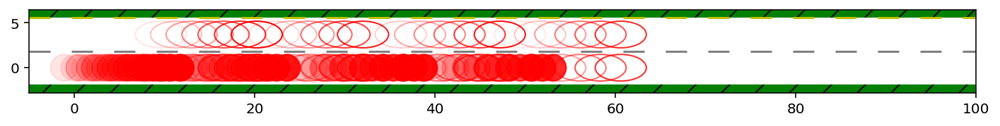

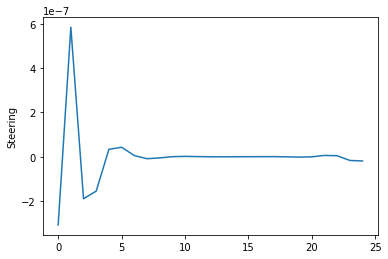

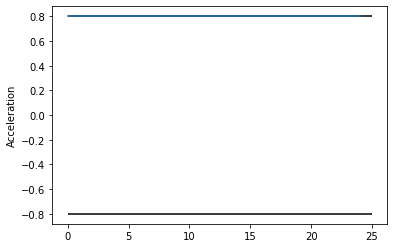

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.32ms (127.58us)   4.56ms (175.57us)        26
       nlp_g  |  21.02ms (808.35us)  23.44ms (901.56us)        26
    nlp_grad  |   2.08ms (  2.08ms)   2.19ms (  2.19ms)         1
  nlp_grad_f  |   3.87ms (143.33us)   4.10ms (151.84us)        27
  nlp_hess_l  | 136.30ms (  5.45ms) 236.37ms (  9.45ms)        25
   nlp_jac_g  |  82.09ms (  3.04ms) 138.65ms (  5.14ms)        27
       total  | 526.90ms (526.90ms) 799.53ms (799.53ms)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


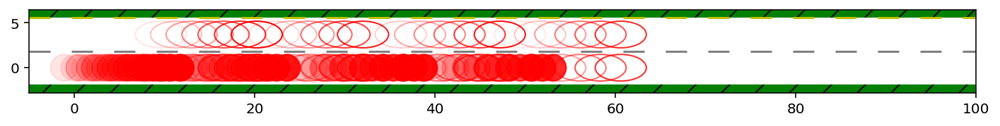

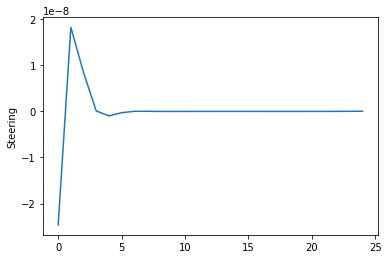

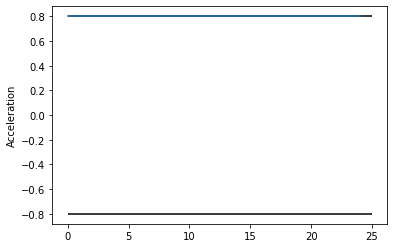

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.85ms (107.08us)   3.89ms (108.03us)        36
       nlp_g  |  25.03ms (695.33us)  25.54ms (709.50us)        36
    nlp_grad  |   1.84ms (  1.84ms)   1.86ms (  1.86ms)         1
  nlp_grad_f  |   4.40ms (118.84us)   5.29ms (142.94us)        37
  nlp_hess_l  | 150.80ms (  4.31ms) 155.07ms (  4.43ms)        35
   nlp_jac_g  |  86.10ms (  2.33ms)  88.12ms (  2.38ms)        37
       total  | 578.26ms (578.26ms) 601.93ms (601.93ms)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


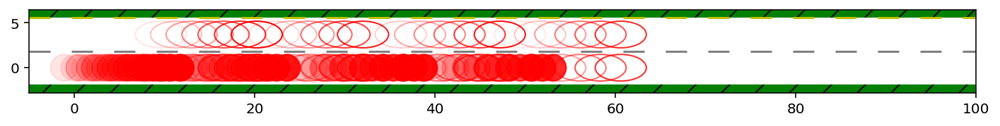

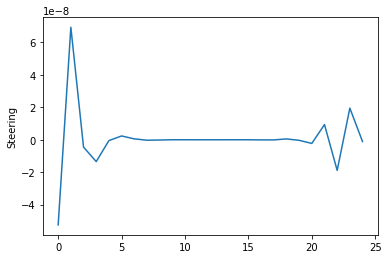

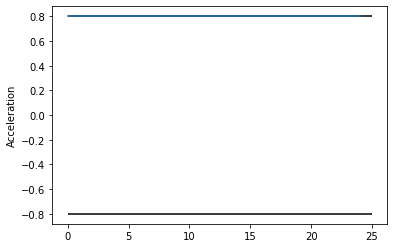

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.55ms (155.50us)   4.04ms (403.72us)        10
       nlp_g  |  10.60ms (  1.06ms)  17.37ms (  1.74ms)        10
    nlp_grad  |   2.58ms (  2.58ms)   8.75ms (  8.75ms)         1
  nlp_grad_f  |   2.28ms (207.27us)   5.27ms (479.36us)        11
  nlp_hess_l  |  61.18ms (  6.80ms) 141.04ms ( 15.67ms)         9
   nlp_jac_g  |  43.30ms (  3.94ms) 105.21ms (  9.56ms)        11
       total  | 227.18ms (227.18ms) 486.55ms (486.55ms)         1
 i_mpc 0 n_round 1 i 01 Cost -217.41 Slack 0.00 
 J_i -217.413,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


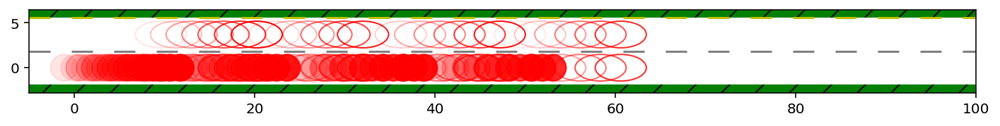

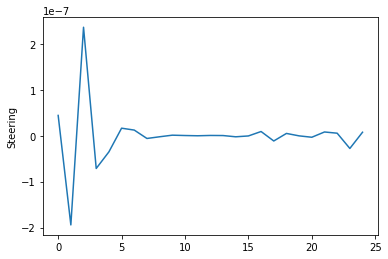

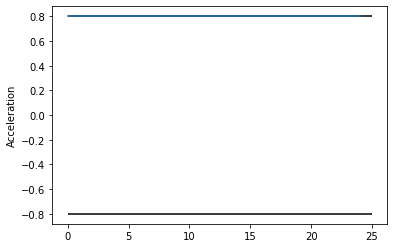

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.79ms (184.12us)   5.11ms (196.50us)        26
       nlp_g  |  26.85ms (  1.03ms) 264.07ms ( 10.16ms)        26
    nlp_grad  |   3.93ms (  3.93ms)  27.17ms ( 27.17ms)         1
  nlp_grad_f  |   6.71ms (248.48us)   8.77ms (324.97us)        27
  nlp_hess_l  | 182.54ms (  7.30ms) 633.80ms ( 25.35ms)        25
   nlp_jac_g  | 106.11ms (  3.93ms) 243.26ms (  9.01ms)        27
       total  | 598.12ms (598.12ms)   1.84 s (  1.84 s)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.45ms (185.21us)   7.57ms (315.41us)        24
       nlp_g  |  25.29ms (  1.05ms)  68.13ms (  2.84ms)        24
    nlp_grad  |   3.53ms (  3.53ms)  12.89ms ( 12.89ms)         1
  nlp_grad_f  |   6.16ms (246.40us)  34.67ms (  1.39ms)        25
  nlp_hess_l  | 192.38ms (  8.36ms) 791.87ms ( 34.43ms)        23
   nlp_jac_g  | 108.93ms (  4.36ms) 640.74ms ( 25.63ms)     

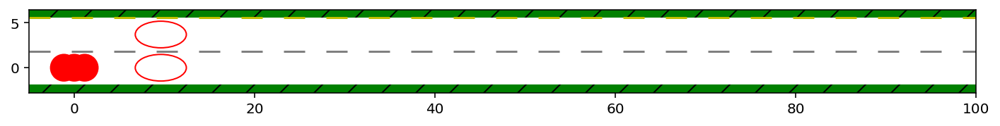

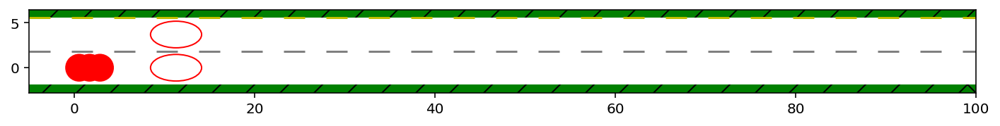

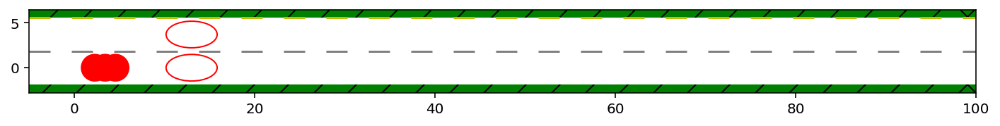

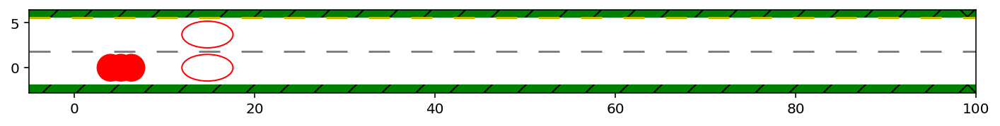

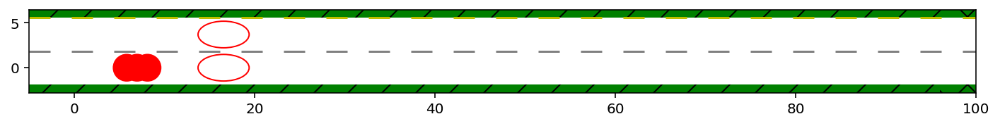

...

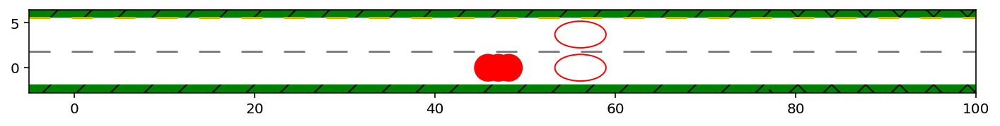

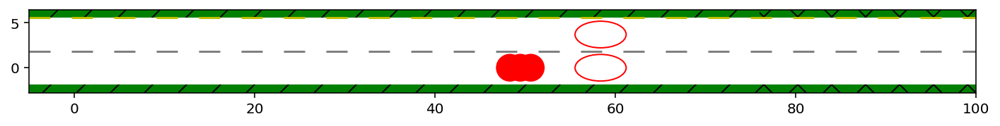

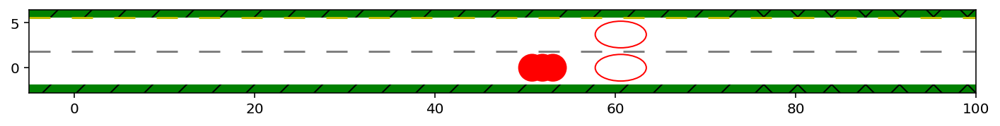

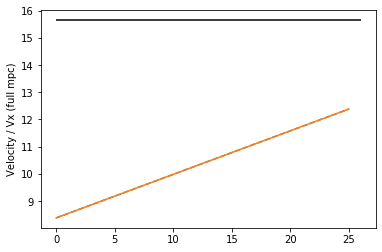

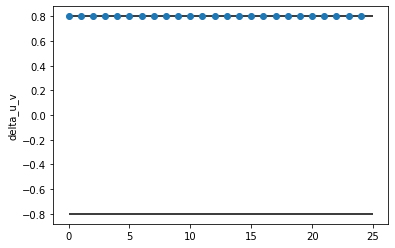

Initial conditions MPC_i: 1 IBR_i: 0 x: 51.9 y:-0.0
(array([[-1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08,
        -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08,
        -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08,
        -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08, -1.69e-08,
        -1.69e-08],
       [-4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16,
        -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16,
        -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16,
        -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16, -4.06e-16,
        -4.06e-16]]), array([ 6.06e+01, -4.49e-06, -3.57e-09,  8.35e-09,  1.12e+01,  5.10e+01]))
(array([[ 1.89e-08,  1.89e-08,  1.89e-08,  1.89e-08,  1.89e-08,  1.89e-08,
         1.89e-08,  1.89e-08,  1.89e-08,  1.89e-08,  1.89e-08,  1.89e-08,
         1.89e-08,  1.89e-08,  1.89e-08,  1.89e-08,  1.89e-08,  1.89e-08,
         1.89e-

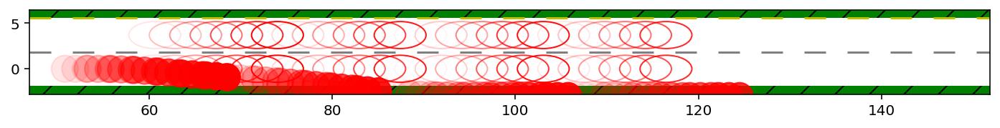

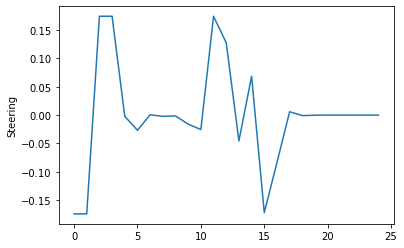

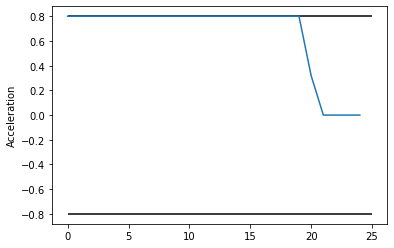

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.03ms ( 92.50us)   2.03ms ( 92.06us)        22
       nlp_g  |  12.76ms (579.82us)  13.71ms (623.17us)        22
    nlp_grad  |   1.69ms (  1.69ms)   1.70ms (  1.70ms)         1
  nlp_grad_f  |   2.62ms (113.96us)   2.63ms (114.52us)        23
  nlp_hess_l  |  89.21ms (  4.25ms) 104.08ms (  4.96ms)        21
   nlp_jac_g  |  52.73ms (  2.29ms)  70.14ms (  3.05ms)        23
       total  | 304.37ms (304.37ms) 359.28ms (359.28ms)         1
 i_mpc 1 n_round 0 i 01 Cost -2049.91 Slack 0.00 
 J_i -2049.911,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


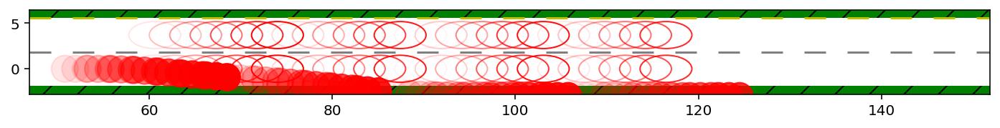

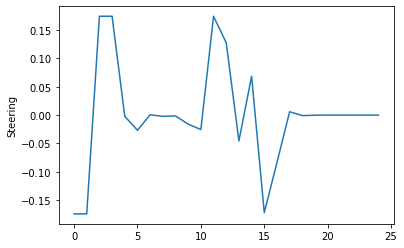

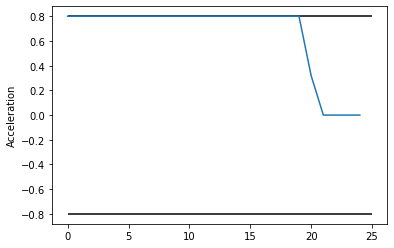

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.73ms ( 94.17us)   2.93ms (101.03us)        29
       nlp_g  |  17.85ms (615.34us)  18.85ms (650.09us)        29
    nlp_grad  |   1.65ms (  1.65ms)   1.66ms (  1.66ms)         1
  nlp_grad_f  |   3.19ms (106.43us)   3.93ms (131.00us)        30
  nlp_hess_l  | 118.66ms (  4.24ms) 134.18ms (  4.79ms)        28
   nlp_jac_g  |  66.15ms (  2.20ms)  80.42ms (  2.68ms)        30
       total  | 391.30ms (391.30ms) 461.43ms (461.43ms)         1
 i_mpc 1 n_round 0 i 01 Cost -2049.91 Slack 0.00 
 J_i -2049.911,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


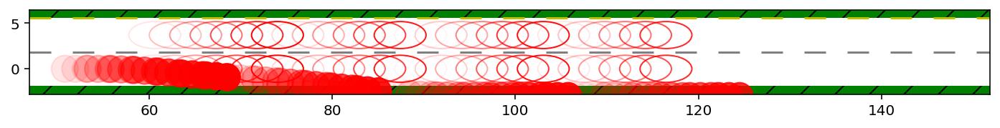

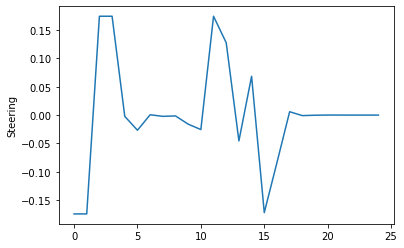

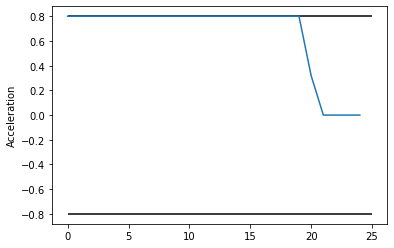

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.00ms ( 99.93us)   4.24ms (141.30us)        30
       nlp_g  |  19.36ms (645.43us)  20.21ms (673.68us)        30
    nlp_grad  |   2.09ms (  2.09ms)   2.72ms (  2.72ms)         1
  nlp_grad_f  |   3.64ms (117.35us)   3.72ms (120.07us)        31
  nlp_hess_l  | 127.12ms (  4.38ms) 180.51ms (  6.22ms)        29
   nlp_jac_g  |  73.29ms (  2.36ms)  86.85ms (  2.80ms)        31
       total  | 435.32ms (435.32ms) 531.47ms (531.47ms)         1
 i_mpc 1 n_round 0 i 01 Cost -2049.91 Slack 0.00 
 J_i -2049.911,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


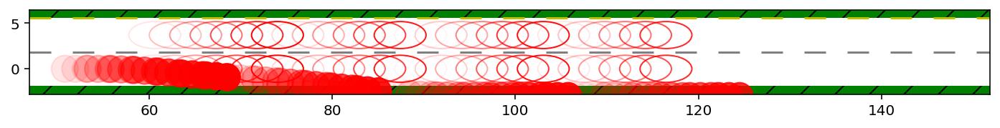

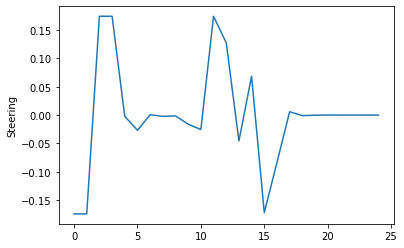

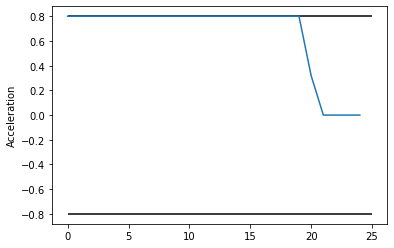

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   5.82ms ( 98.59us)   5.92ms (100.42us)        59
       nlp_g  |  35.29ms (598.14us)  44.05ms (746.54us)        59
    nlp_grad  |   1.61ms (  1.61ms)   1.62ms (  1.62ms)         1
  nlp_grad_f  |   6.71ms (111.78us)   7.21ms (120.20us)        60
  nlp_hess_l  | 243.18ms (  4.19ms) 299.99ms (  5.17ms)        58
   nlp_jac_g  | 130.89ms (  2.18ms) 147.94ms (  2.47ms)        60
       total  | 881.31ms (881.31ms)   1.05 s (  1.05 s)         1
 i_mpc 1 n_round 0 i 01 Cost -2049.91 Slack 0.00 
 J_i -2049.911,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


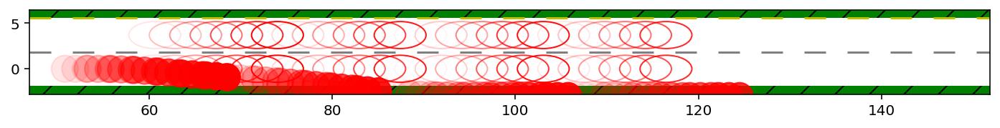

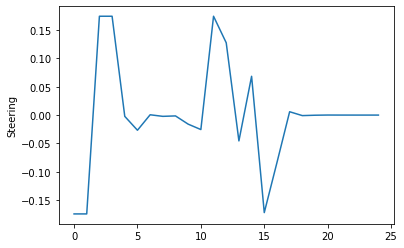

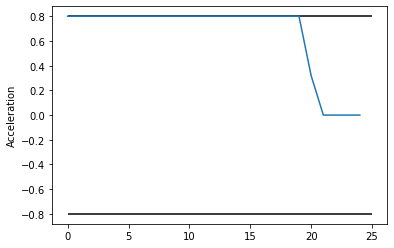

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |  23.81ms (113.36us)  31.16ms (148.36us)       210
       nlp_g  | 146.83ms (699.19us) 197.55ms (940.71us)       210
    nlp_grad  |   1.68ms (  1.68ms)   1.68ms (  1.68ms)         1
  nlp_grad_f  |   1.34ms (133.60us)   1.34ms (134.33us)        10
  nlp_hess_l  | 878.73ms (  5.11ms)   1.57 s (  9.10ms)       172
   nlp_jac_g  | 497.56ms (  2.80ms)   1.06 s (  5.97ms)       178
       total  |   3.80 s (  3.80 s)   7.14 s (  7.14 s)         1
Infeasibility: k_warm lane_change_left accelerating
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   9.88ms (107.42us)  10.96ms (119.08us)        92
       nlp_g  |  64.24ms (698.27us)  89.24ms (970.00us)        92
    nlp_grad  |   2.11ms (  2.11ms)   3.70ms (  3.70ms)         1
  nlp_grad_f  |   5.03ms (136.00us)   6.10ms (164.91us)        37
  nlp_hess_l  | 411.53ms (  4.96ms) 500.78ms (  6.03ms)        83
   nlp_jac_g  | 230.68ms

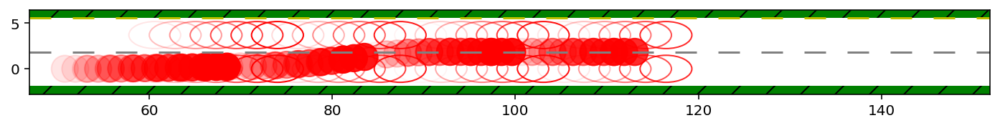

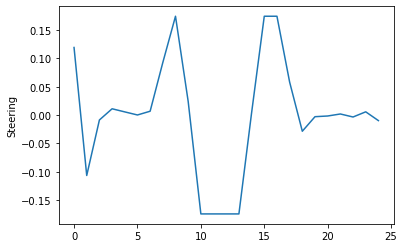

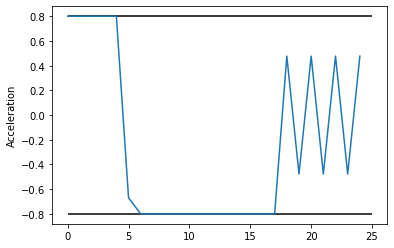

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.06ms (117.85us)   5.30ms (203.77us)        26
       nlp_g  |  16.65ms (640.35us)  38.46ms (  1.48ms)        26
    nlp_grad  |   1.81ms (  1.81ms)   1.85ms (  1.85ms)         1
  nlp_grad_f  |   3.04ms (126.79us)   3.19ms (132.81us)        24
  nlp_hess_l  | 104.78ms (  4.76ms) 144.51ms (  6.57ms)        22
   nlp_jac_g  |  60.24ms (  2.51ms)  88.64ms (  3.69ms)        24
       total  | 370.43ms (370.43ms) 589.58ms (589.58ms)         1
 i_mpc 1 n_round 0 i 01 Cost -1867.95 Slack 0.00 
 J_i -1867.947,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


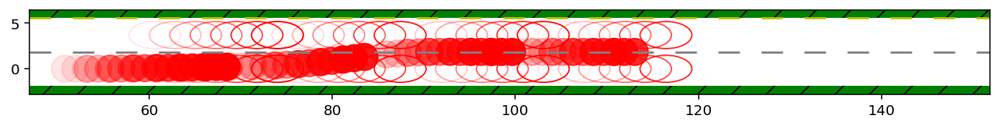

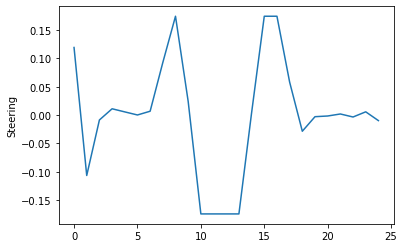

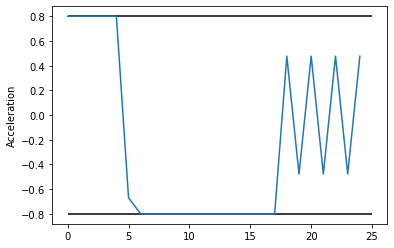

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.45ms (114.15us)   4.87ms (124.86us)        39
       nlp_g  |  26.56ms (680.92us)  33.73ms (864.99us)        39
    nlp_grad  |   2.21ms (  2.21ms)   2.63ms (  2.63ms)         1
  nlp_grad_f  |   5.24ms (131.05us)   5.78ms (144.51us)        40
  nlp_hess_l  | 181.25ms (  4.77ms) 222.20ms (  5.85ms)        38
   nlp_jac_g  | 102.72ms (  2.57ms) 131.17ms (  3.28ms)        40
       total  | 646.20ms (646.20ms) 814.87ms (814.87ms)         1
 i_mpc 1 n_round 0 i 01 Cost -2049.91 Slack 0.00 
 J_i -2049.911,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


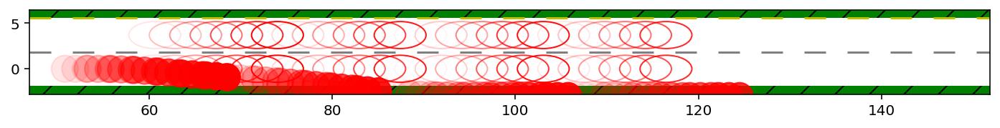

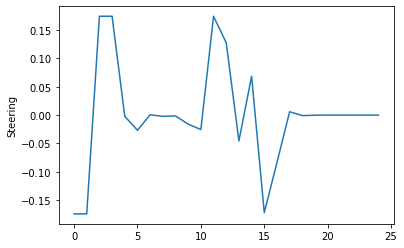

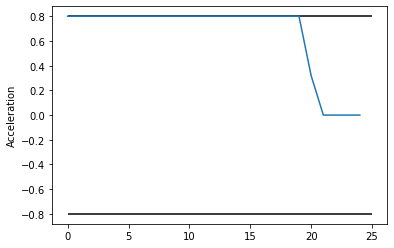

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.28ms (125.94us)   4.88ms (143.49us)        34
       nlp_g  |  23.52ms (691.82us)  29.19ms (858.59us)        34
    nlp_grad  |   1.92ms (  1.92ms)   1.99ms (  1.99ms)         1
  nlp_grad_f  |   4.86ms (147.27us)   5.28ms (160.04us)        33
  nlp_hess_l  | 156.35ms (  5.04ms) 199.73ms (  6.44ms)        31
   nlp_jac_g  |  85.91ms (  2.60ms) 112.20ms (  3.40ms)        33
       total  | 505.44ms (505.44ms) 633.28ms (633.28ms)         1
 i_mpc 1 n_round 0 i 01 Cost -2049.91 Slack 0.00 
 J_i -2049.911,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


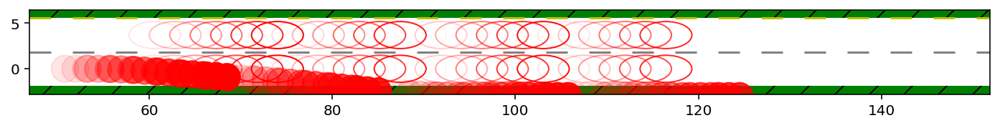

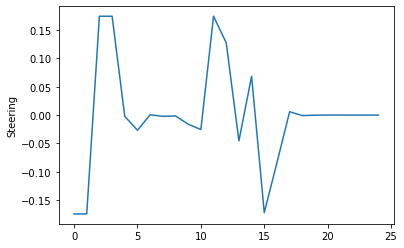

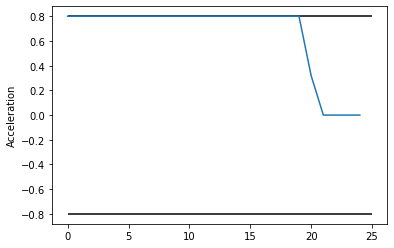

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   6.01ms ( 98.51us)  12.34ms (202.35us)        61
       nlp_g  |  43.03ms (705.34us)  54.10ms (886.86us)        61
    nlp_grad  |   1.89ms (  1.89ms)   1.89ms (  1.89ms)         1
  nlp_grad_f  |   6.92ms (121.37us)   7.76ms (136.12us)        57
  nlp_hess_l  | 263.27ms (  4.79ms) 363.33ms (  6.61ms)        55
   nlp_jac_g  | 152.16ms (  2.67ms) 194.51ms (  3.41ms)        57
       total  | 879.68ms (879.68ms)   1.14 s (  1.14 s)         1
 i_mpc 1 n_round 0 i 01 Cost -2049.91 Slack 0.00 
 J_i -2049.911,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


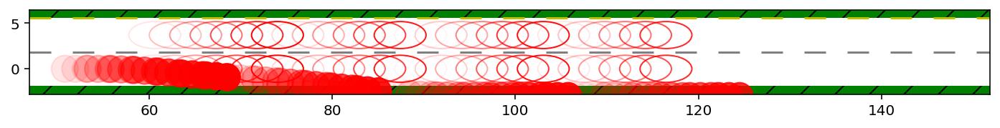

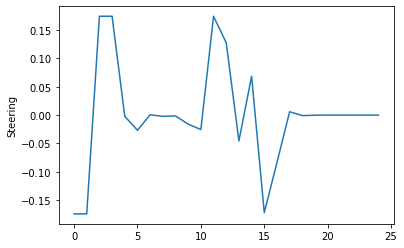

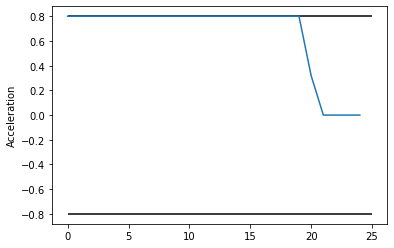

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.85ms (124.23us)   5.46ms (176.16us)        31
       nlp_g  |  22.47ms (725.00us)  26.29ms (848.11us)        31
    nlp_grad  |   1.72ms (  1.72ms)   1.73ms (  1.73ms)         1
  nlp_grad_f  |   4.39ms (137.06us)   4.59ms (143.56us)        32
  nlp_hess_l  | 148.57ms (  4.95ms) 184.70ms (  6.16ms)        30
   nlp_jac_g  |  89.58ms (  2.80ms) 101.31ms (  3.17ms)        32
       total  | 534.43ms (534.43ms) 627.10ms (627.10ms)         1
 i_mpc 1 n_round 0 i 01 Cost -1867.95 Slack 0.00 
 J_i -1867.947,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


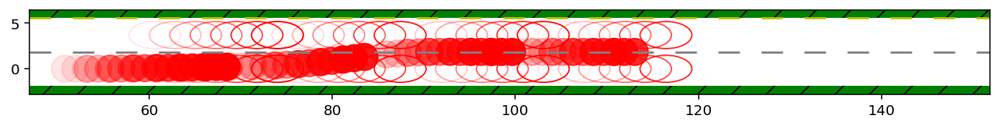

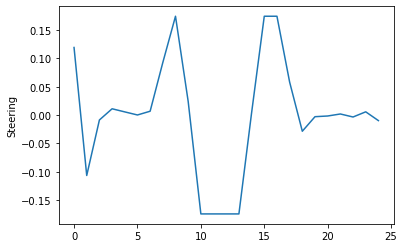

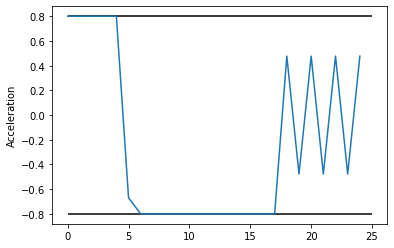

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.89ms (114.50us)   7.42ms (218.26us)        34
       nlp_g  |  24.56ms (722.41us)  30.84ms (907.07us)        34
    nlp_grad  |   2.61ms (  2.61ms)   5.50ms (  5.50ms)         1
  nlp_grad_f  |   4.36ms (132.24us)   4.47ms (135.35us)        33
  nlp_hess_l  | 160.56ms (  5.18ms) 232.96ms (  7.51ms)        31
   nlp_jac_g  |  91.62ms (  2.78ms) 139.18ms (  4.22ms)        33
       total  | 521.67ms (521.67ms) 744.12ms (744.12ms)         1
 i_mpc 1 n_round 0 i 01 Cost -2049.91 Slack 0.00 
 J_i -2049.911,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


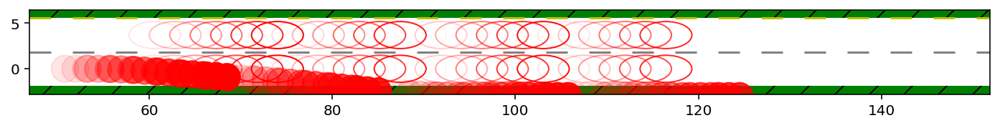

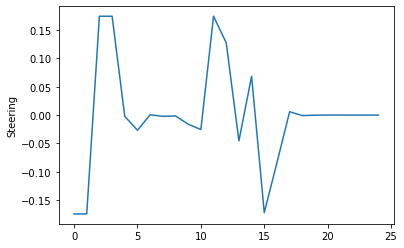

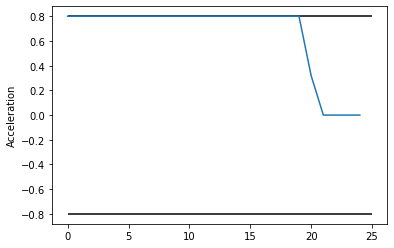

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.34ms (123.52us)   3.36ms (124.33us)        27
       nlp_g  |  16.51ms (611.30us)  16.79ms (621.81us)        27
    nlp_grad  |   2.01ms (  2.01ms)   2.45ms (  2.45ms)         1
  nlp_grad_f  |   3.71ms (142.62us)   3.92ms (150.77us)        26
  nlp_hess_l  | 115.99ms (  4.83ms) 122.09ms (  5.09ms)        24
   nlp_jac_g  |  62.27ms (  2.39ms)  64.95ms (  2.50ms)        26
       total  | 389.02ms (389.02ms) 405.54ms (405.54ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.05ms ( 92.48us)   3.09ms ( 93.70us)        33
       nlp_g  |  16.95ms (513.55us)  17.81ms (539.71us)        33
    nlp_grad  |   1.50ms (  1.50ms)   1.50ms (  1.50ms)         1
  nlp_grad_f  |   3.96ms (116.59us)   4.18ms (122.82us)        34
  nlp_hess_l  | 148.62ms (  4.64ms) 189.32ms (  5.92ms)        32
   nlp_jac_g  |  80.17ms (  2.36ms)  87.33ms (  2.57ms)     

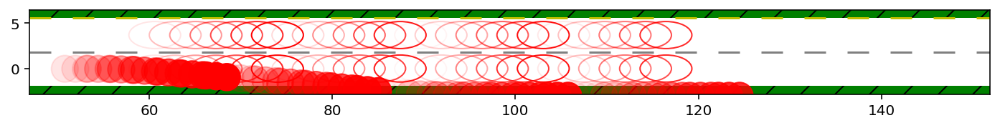

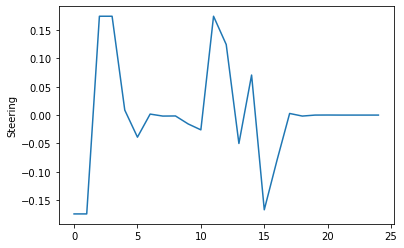

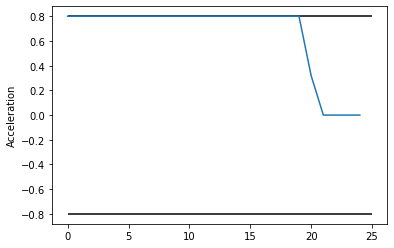

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.16ms (102.81us)   2.18ms (103.92us)        21
       nlp_g  |  13.57ms (646.14us)  13.77ms (655.83us)        21
    nlp_grad  |   1.77ms (  1.77ms)   1.75ms (  1.75ms)         1
  nlp_grad_f  |   2.58ms (117.14us)   2.59ms (117.94us)        22
  nlp_hess_l  |  90.34ms (  4.52ms) 101.72ms (  5.09ms)        20
   nlp_jac_g  |  51.72ms (  2.35ms)  59.47ms (  2.70ms)        22
       total  | 299.48ms (299.48ms) 331.38ms (331.38ms)         1
 i_mpc 1 n_round 1 i 01 Cost -2050.00 Slack 0.00 
 J_i -2050.002,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


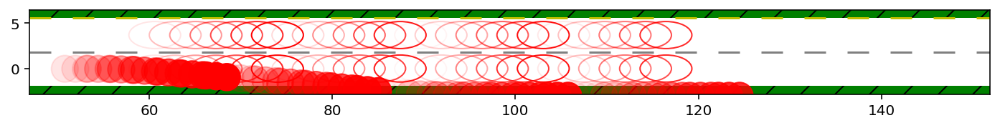

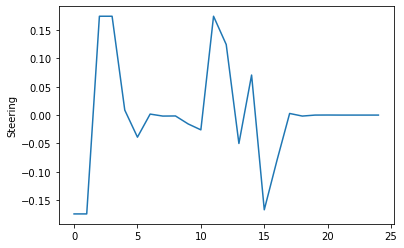

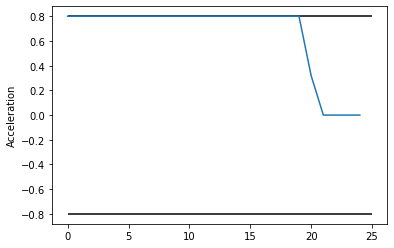

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.16ms (116.93us)   3.22ms (119.10us)        27
       nlp_g  |  19.29ms (714.59us)  24.74ms (916.25us)        27
    nlp_grad  |   1.82ms (  1.82ms)   1.81ms (  1.81ms)         1
  nlp_grad_f  |   3.57ms (127.46us)   3.61ms (128.97us)        28
  nlp_hess_l  | 118.29ms (  4.55ms) 140.01ms (  5.39ms)        26
   nlp_jac_g  |  70.42ms (  2.51ms)  91.78ms (  3.28ms)        28
       total  | 400.21ms (400.21ms) 477.52ms (477.52ms)         1
 i_mpc 1 n_round 1 i 01 Cost -2050.00 Slack 0.00 
 J_i -2050.002,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


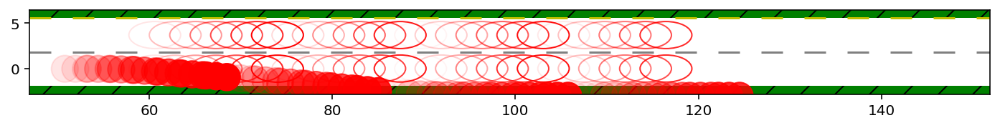

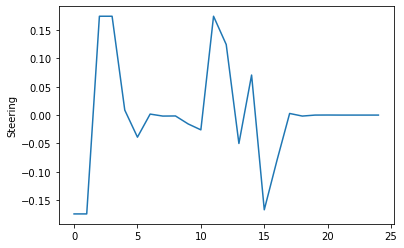

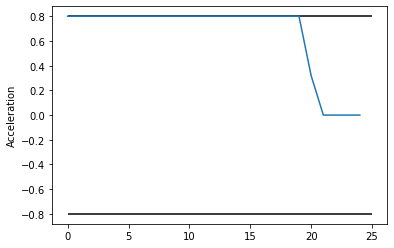

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.44ms (118.45us)   3.60ms (124.08us)        29
       nlp_g  |  19.36ms (667.48us)  21.68ms (747.42us)        29
    nlp_grad  |   1.82ms (  1.82ms)   2.13ms (  2.13ms)         1
  nlp_grad_f  |   3.94ms (131.43us)   4.29ms (143.16us)        30
  nlp_hess_l  | 130.84ms (  4.67ms) 167.05ms (  5.97ms)        28
   nlp_jac_g  |  73.02ms (  2.43ms)  86.09ms (  2.87ms)        30
       total  | 437.15ms (437.15ms) 540.69ms (540.69ms)         1
 i_mpc 1 n_round 1 i 01 Cost -2050.00 Slack 0.00 
 J_i -2050.002,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


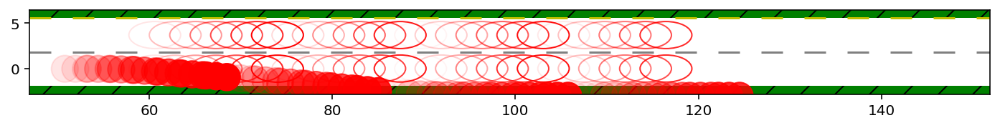

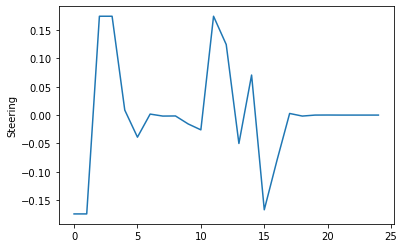

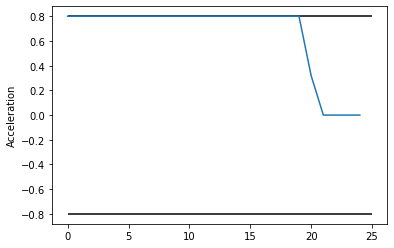

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   6.96ms (122.09us)   7.36ms (129.08us)        57
       nlp_g  |  41.55ms (728.93us)  55.74ms (977.85us)        57
    nlp_grad  |   1.70ms (  1.70ms)   1.70ms (  1.70ms)         1
  nlp_grad_f  |   7.76ms (133.88us)   7.97ms (137.46us)        58
  nlp_hess_l  | 263.84ms (  4.71ms) 340.07ms (  6.07ms)        56
   nlp_jac_g  | 151.34ms (  2.61ms) 244.03ms (  4.21ms)        58
       total  | 952.40ms (952.40ms)   1.28 s (  1.28 s)         1
 i_mpc 1 n_round 1 i 01 Cost -2050.00 Slack 0.00 
 J_i -2050.002,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


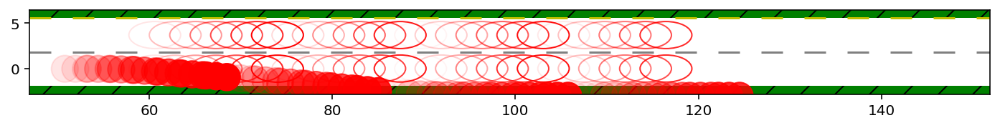

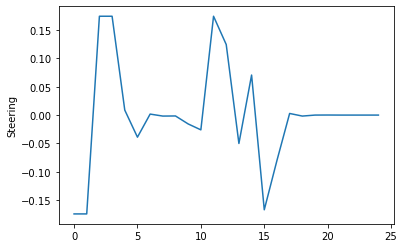

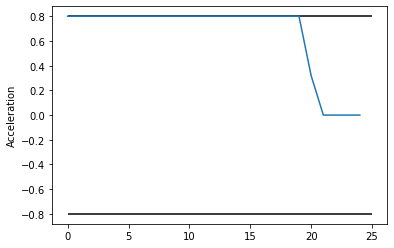

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |  20.74ms (108.04us)  24.11ms (125.58us)       192
       nlp_g  | 139.06ms (724.28us) 176.99ms (921.81us)       192
    nlp_grad  |   1.71ms (  1.71ms)   1.71ms (  1.71ms)         1
  nlp_grad_f  |   1.48ms (148.20us)   2.52ms (251.64us)        10
  nlp_hess_l  | 746.91ms (  4.61ms) 880.83ms (  5.44ms)       162
   nlp_jac_g  | 427.74ms (  2.55ms) 548.12ms (  3.26ms)       168
       total  |   3.19 s (  3.19 s)   3.92 s (  3.92 s)         1
Infeasibility: k_warm lane_change_left accelerating
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |  11.12ms (106.89us)  14.95ms (143.73us)       104
       nlp_g  |  70.23ms (675.32us)  89.21ms (857.75us)       104
    nlp_grad  |   2.10ms (  2.10ms)   2.21ms (  2.21ms)         1
  nlp_grad_f  |   4.57ms (130.66us)   4.76ms (136.04us)        35
  nlp_hess_l  | 325.16ms (  4.45ms) 384.05ms (  5.26ms)        73
   nlp_jac_g  | 198.75ms

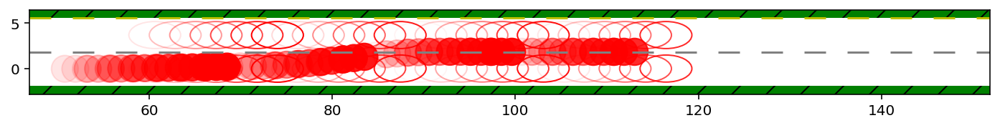

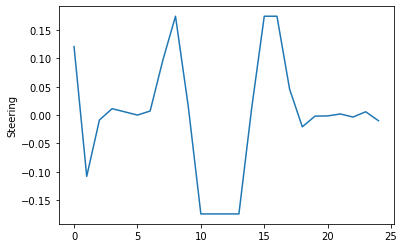

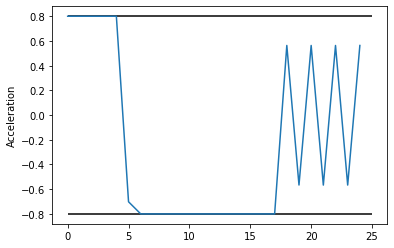

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.73ms (118.70us)   2.76ms (120.06us)        23
       nlp_g  |  16.74ms (727.83us)  19.07ms (829.10us)        23
    nlp_grad  |   1.76ms (  1.76ms)   1.74ms (  1.74ms)         1
  nlp_grad_f  |   2.82ms (134.43us)   3.57ms (169.99us)        21
  nlp_hess_l  |  87.51ms (  4.61ms) 103.59ms (  5.45ms)        19
   nlp_jac_g  |  53.61ms (  2.55ms)  76.01ms (  3.62ms)        21
       total  | 313.43ms (313.43ms) 383.83ms (383.83ms)         1
 i_mpc 1 n_round 1 i 01 Cost -1867.52 Slack 0.00 
 J_i -1867.521,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


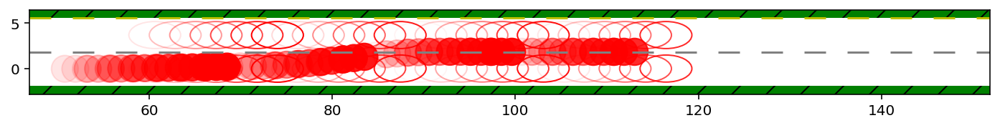

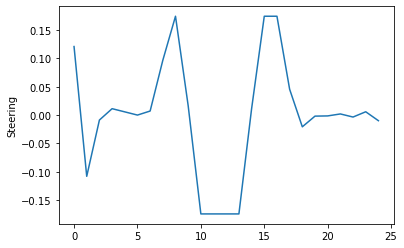

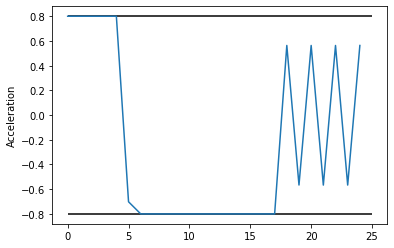

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.41ms (115.97us)   4.59ms (120.79us)        38
       nlp_g  |  27.07ms (712.50us)  28.89ms (760.14us)        38
    nlp_grad  |   2.23ms (  2.23ms)   2.42ms (  2.42ms)         1
  nlp_grad_f  |   6.14ms (157.33us)   6.84ms (175.29us)        39
  nlp_hess_l  | 167.71ms (  4.53ms) 188.89ms (  5.11ms)        37
   nlp_jac_g  | 102.65ms (  2.63ms) 131.51ms (  3.37ms)        39
       total  | 615.26ms (615.26ms) 703.35ms (703.35ms)         1
 i_mpc 1 n_round 1 i 01 Cost -2050.00 Slack 0.00 
 J_i -2050.002,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


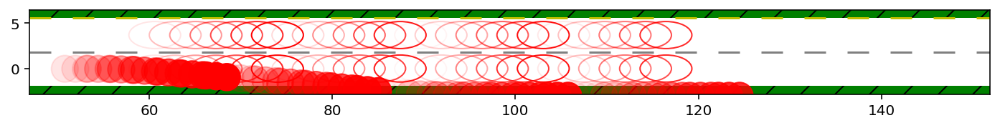

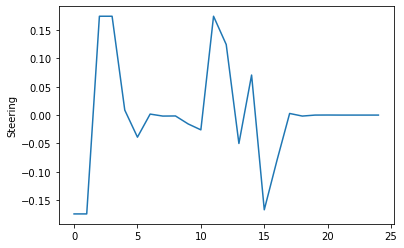

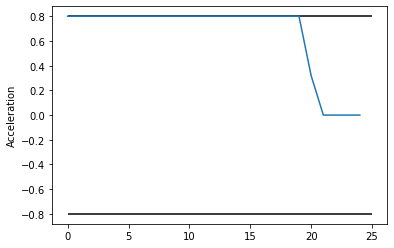

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.49ms (109.12us)   3.52ms (110.12us)        32
       nlp_g  |  21.04ms (657.44us)  21.85ms (682.92us)        32
    nlp_grad  |   1.79ms (  1.79ms)   2.02ms (  2.02ms)         1
  nlp_grad_f  |   3.34ms (115.07us)   3.50ms (120.68us)        29
  nlp_hess_l  | 114.09ms (  4.23ms) 120.65ms (  4.47ms)        27
   nlp_jac_g  |  66.76ms (  2.30ms)  69.77ms (  2.41ms)        29
       total  | 393.03ms (393.03ms) 425.77ms (425.77ms)         1
 i_mpc 1 n_round 1 i 01 Cost -2050.00 Slack 0.00 
 J_i -2050.002,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


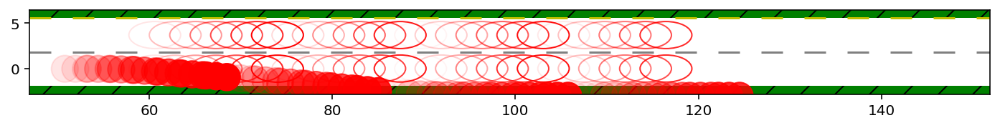

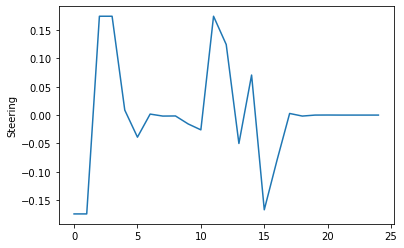

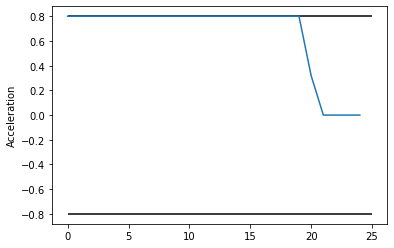

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   4.35ms (101.23us)   4.46ms (103.63us)        43
       nlp_g  |  30.83ms (716.91us)  34.20ms (795.40us)        43
    nlp_grad  |   1.59ms (  1.59ms)   1.59ms (  1.59ms)         1
  nlp_grad_f  |   5.08ms (118.05us)  10.00ms (232.64us)        43
  nlp_hess_l  | 187.90ms (  4.58ms) 215.26ms (  5.25ms)        41
   nlp_jac_g  | 106.41ms (  2.47ms) 118.78ms (  2.76ms)        43
       total  | 620.75ms (620.75ms) 801.10ms (801.10ms)         1
 i_mpc 1 n_round 1 i 01 Cost -2050.00 Slack 0.00 
 J_i -2050.002,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


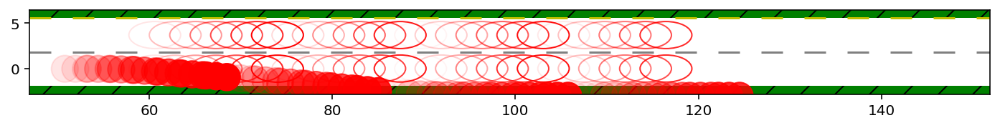

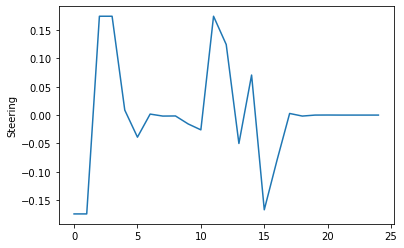

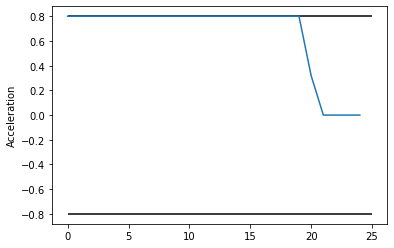

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.14ms (104.73us)   3.15ms (105.03us)        30
       nlp_g  |  19.84ms (661.23us)  20.26ms (675.30us)        30
    nlp_grad  |   1.68ms (  1.68ms)   1.75ms (  1.75ms)         1
  nlp_grad_f  |   3.61ms (116.52us)   3.84ms (123.71us)        31
  nlp_hess_l  | 118.39ms (  4.08ms) 120.93ms (  4.17ms)        29
   nlp_jac_g  |  70.01ms (  2.26ms)  72.17ms (  2.33ms)        31
       total  | 428.87ms (428.87ms) 438.30ms (438.30ms)         1
 i_mpc 1 n_round 1 i 01 Cost -1867.52 Slack 0.00 
 J_i -1867.521,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


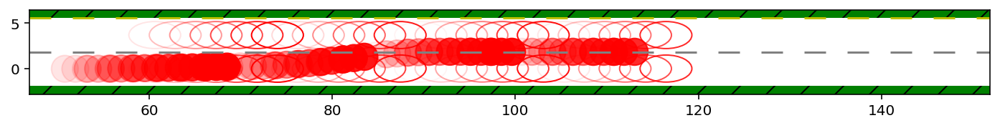

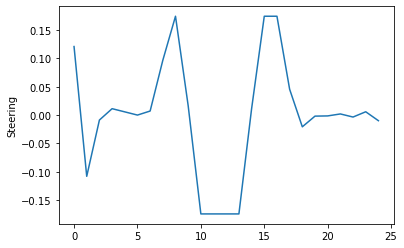

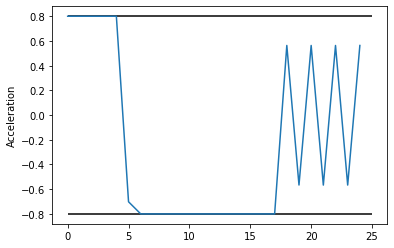

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.00ms (105.16us)   2.01ms (105.81us)        19
       nlp_g  |  13.07ms (687.84us)  13.15ms (692.32us)        19
    nlp_grad  |   1.71ms (  1.71ms)   1.71ms (  1.71ms)         1
  nlp_grad_f  |   2.51ms (125.45us)   2.84ms (142.16us)        20
  nlp_hess_l  |  75.40ms (  4.19ms)  77.14ms (  4.29ms)        18
   nlp_jac_g  |  47.91ms (  2.40ms)  49.95ms (  2.50ms)        20
       total  | 259.59ms (259.59ms) 265.57ms (265.57ms)         1
 i_mpc 1 n_round 1 i 01 Cost -2050.00 Slack 0.00 
 J_i -2050.002,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


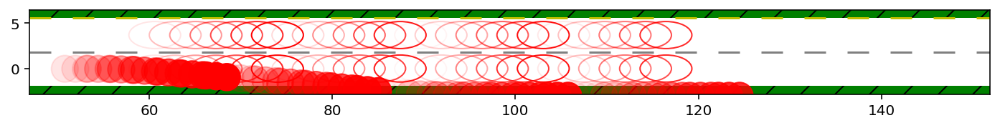

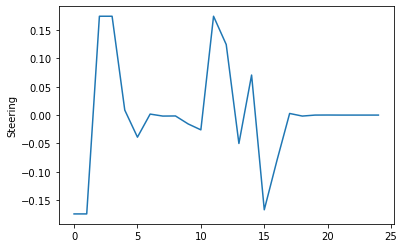

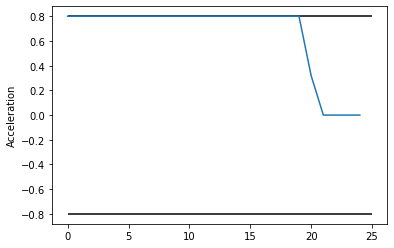

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.77ms (106.69us)   2.78ms (107.10us)        26
       nlp_g  |  16.14ms (620.96us)  16.51ms (634.85us)        26
    nlp_grad  |   1.74ms (  1.74ms)   1.74ms (  1.74ms)         1
  nlp_grad_f  |   3.06ms (117.88us)   3.13ms (120.29us)        26
  nlp_hess_l  | 106.22ms (  4.43ms) 109.23ms (  4.55ms)        24
   nlp_jac_g  |  56.94ms (  2.19ms)  58.56ms (  2.25ms)        26
       total  | 361.24ms (361.24ms) 369.19ms (369.19ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.88ms (121.13us)   3.92ms (122.36us)        32
       nlp_g  |  17.15ms (535.88us)  17.24ms (538.72us)        32
    nlp_grad  |   1.66ms (  1.66ms)   1.68ms (  1.68ms)         1
  nlp_grad_f  |   4.15ms (125.73us)   4.19ms (126.87us)        33
  nlp_hess_l  | 128.20ms (  4.14ms) 130.42ms (  4.21ms)        31
   nlp_jac_g  |  68.12ms (  2.06ms)  69.61ms (  2.11ms)     

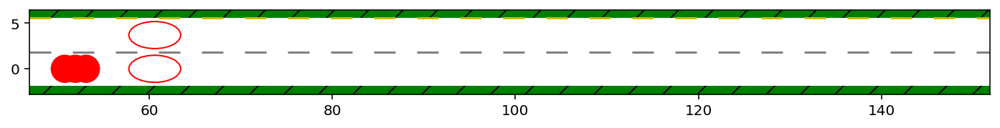

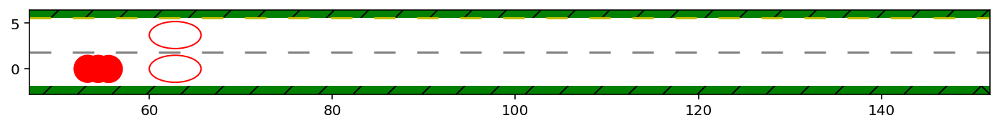

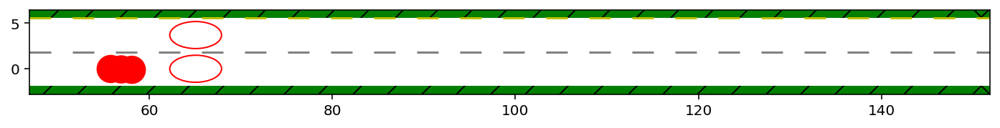

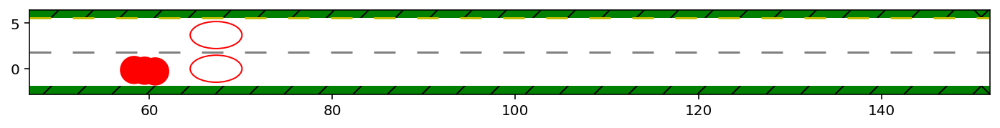

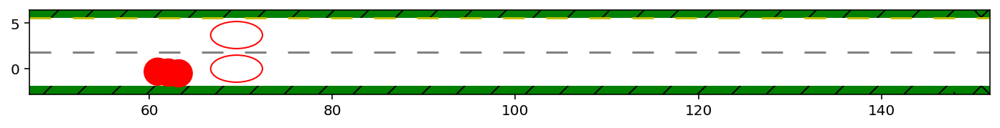

...

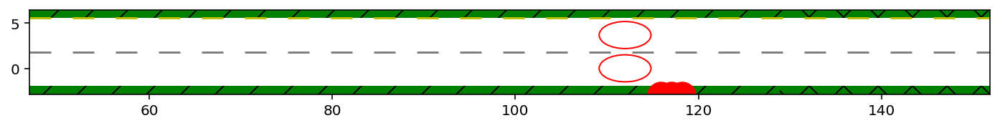

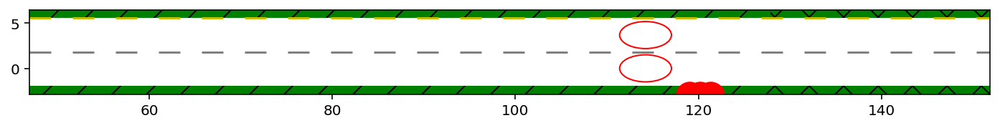

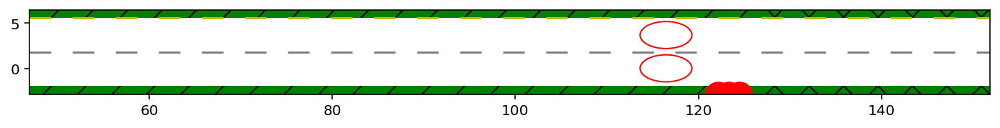

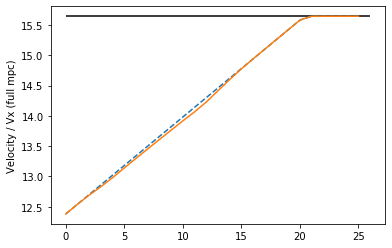

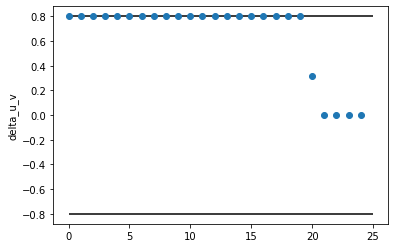

Initial conditions MPC_i: 2 IBR_i: 0 x: 123.3 y:-3.0
(array([[-2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04,
        -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04,
        -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04,
        -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04, -2.63e-04,
        -2.63e-04],
       [-2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13,
        -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13,
        -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13,
        -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13, -2.39e-13,
        -2.39e-13]]), array([ 1.16e+02,  5.16e-02, -5.77e-05,  1.36e-04,  1.12e+01,  1.07e+02]))
(array([[-2.89e-09, -2.89e-09, -2.89e-09, -2.89e-09, -2.89e-09, -2.89e-09,
        -2.89e-09, -2.89e-09, -2.89e-09, -2.89e-09, -2.89e-09, -2.89e-09,
        -2.89e-09, -2.89e-09, -2.89e-09, -2.89e-09, -2.89e-09, -2.89e-09,
        -2.89e

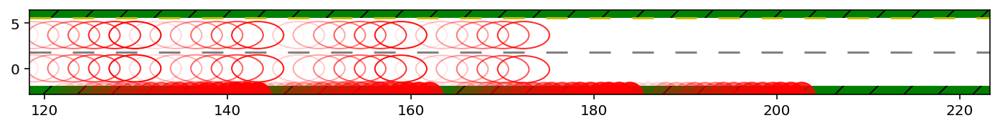

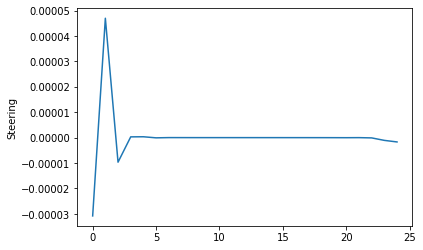

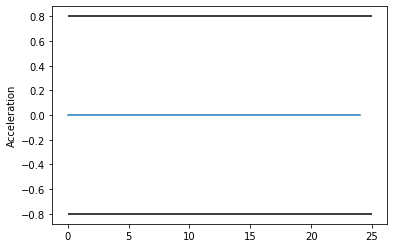

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.03ms ( 84.46us)   2.10ms ( 87.67us)        24
       nlp_g  |  12.84ms (535.04us)  13.10ms (545.99us)        24
    nlp_grad  |   1.49ms (  1.49ms)   1.51ms (  1.51ms)         1
  nlp_grad_f  |   1.90ms ( 95.25us)   2.00ms (100.09us)        20
  nlp_hess_l  |  70.94ms (  3.94ms)  72.67ms (  4.04ms)        18
   nlp_jac_g  |  39.68ms (  1.98ms)  40.28ms (  2.01ms)        20
       total  | 247.15ms (247.15ms) 252.27ms (252.27ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


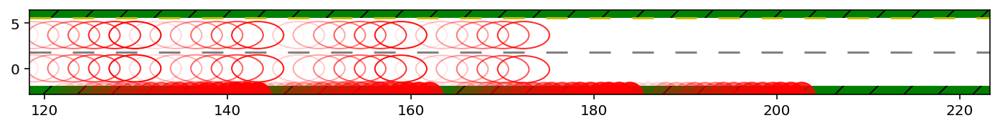

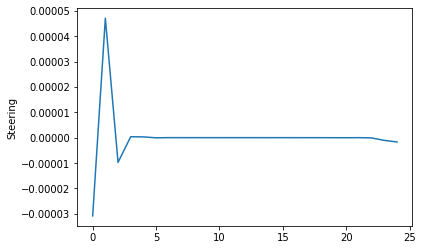

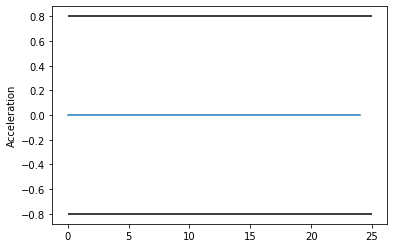

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.42ms ( 88.81us)   1.55ms ( 96.72us)        16
       nlp_g  |   9.44ms (590.25us)   9.99ms (624.68us)        16
    nlp_grad  |   1.52ms (  1.52ms)   1.52ms (  1.52ms)         1
  nlp_grad_f  |   1.59ms ( 99.25us)   1.60ms ( 99.89us)        16
  nlp_hess_l  |  57.99ms (  4.14ms)  60.20ms (  4.30ms)        14
   nlp_jac_g  |  33.40ms (  2.09ms)  34.66ms (  2.17ms)        16
       total  | 198.29ms (198.29ms) 213.71ms (213.71ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


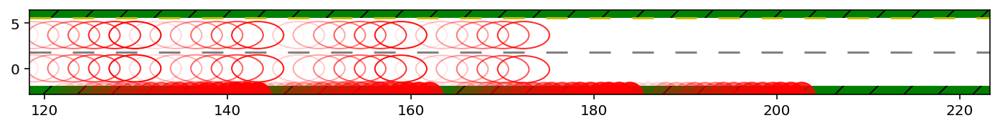

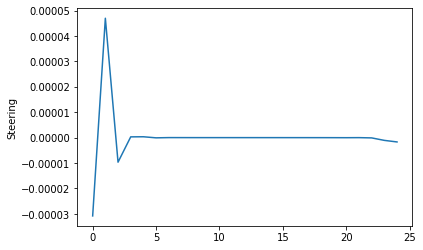

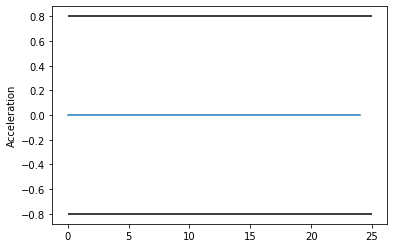

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.77ms ( 93.37us)   1.95ms (102.71us)        19
       nlp_g  |  10.87ms (571.84us)  10.98ms (578.04us)        19
    nlp_grad  |   1.61ms (  1.61ms)   1.66ms (  1.66ms)         1
  nlp_grad_f  |   1.80ms (100.06us)   1.81ms (100.59us)        18
  nlp_hess_l  |  64.94ms (  4.06ms)  66.94ms (  4.18ms)        16
   nlp_jac_g  |  39.57ms (  2.20ms)  40.44ms (  2.25ms)        18
       total  | 223.59ms (223.59ms) 227.43ms (227.43ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


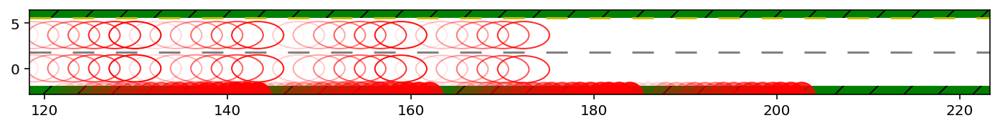

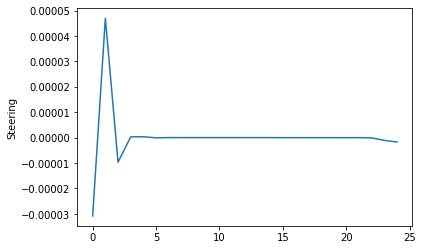

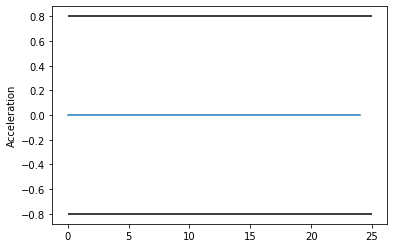

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.71ms ( 89.79us)   1.71ms ( 90.02us)        19
       nlp_g  |  11.46ms (603.37us)  11.71ms (616.49us)        19
    nlp_grad  |   1.50ms (  1.50ms)   1.51ms (  1.51ms)         1
  nlp_grad_f  |   1.92ms ( 95.95us)   1.92ms ( 96.22us)        20
  nlp_hess_l  |  71.72ms (  3.98ms)  75.17ms (  4.18ms)        18
   nlp_jac_g  |  42.47ms (  2.12ms)  45.93ms (  2.30ms)        20
       total  | 245.65ms (245.65ms) 259.11ms (259.11ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


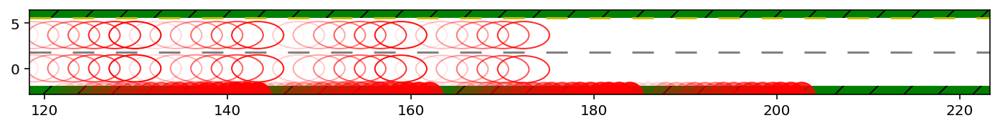

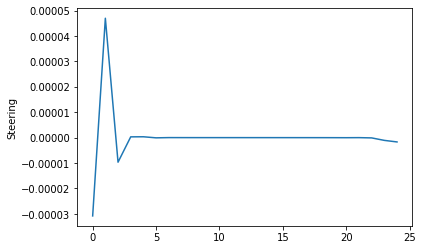

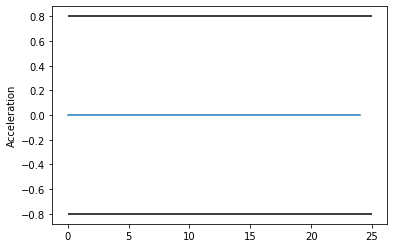

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.47ms (102.83us)   2.53ms (105.57us)        24
       nlp_g  |  13.94ms (580.79us)  14.29ms (595.24us)        24
    nlp_grad  |   1.54ms (  1.54ms)   1.55ms (  1.55ms)         1
  nlp_grad_f  |   2.30ms (114.90us)   2.36ms (117.78us)        20
  nlp_hess_l  |  73.98ms (  4.11ms)  76.25ms (  4.24ms)        18
   nlp_jac_g  |  43.17ms (  2.16ms)  44.53ms (  2.23ms)        20
       total  | 256.84ms (256.84ms) 263.05ms (263.05ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


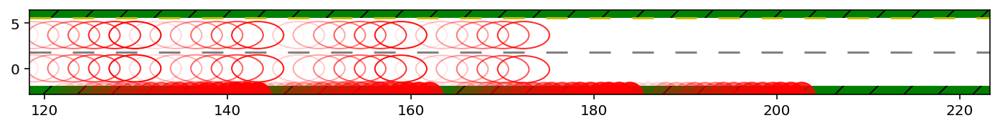

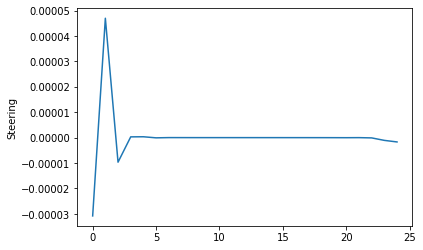

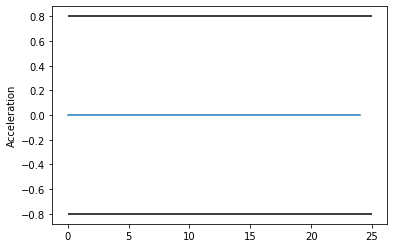

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.97ms (103.84us)   2.00ms (105.36us)        19
       nlp_g  |  11.43ms (601.74us)  11.62ms (611.37us)        19
    nlp_grad  |   1.53ms (  1.53ms)   1.53ms (  1.53ms)         1
  nlp_grad_f  |   1.74ms (102.47us)   1.75ms (102.70us)        17
  nlp_hess_l  |  62.12ms (  4.14ms)  62.58ms (  4.17ms)        15
   nlp_jac_g  |  37.38ms (  2.20ms)  37.87ms (  2.23ms)        17
       total  | 222.04ms (222.04ms) 226.20ms (226.20ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


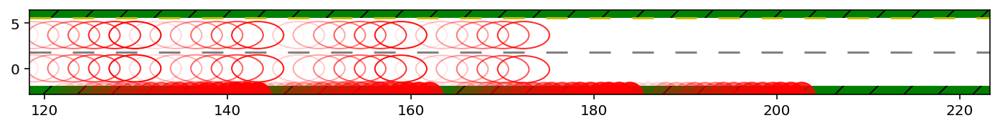

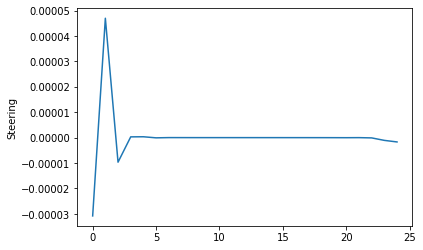

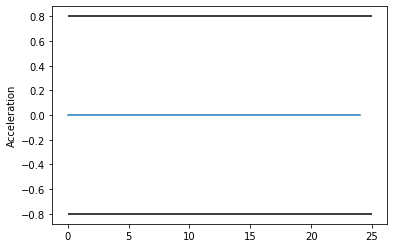

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.81ms (106.71us)   1.91ms (112.17us)        17
       nlp_g  |  11.44ms (672.82us)  11.78ms (693.04us)        17
    nlp_grad  |   1.93ms (  1.93ms)   2.17ms (  2.17ms)         1
  nlp_grad_f  |   1.95ms (129.93us)   2.07ms (138.23us)        15
  nlp_hess_l  |  53.00ms (  4.08ms)  54.80ms (  4.22ms)        13
   nlp_jac_g  |  34.43ms (  2.30ms)  36.06ms (  2.40ms)        15
       total  | 202.76ms (202.76ms) 218.21ms (218.21ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


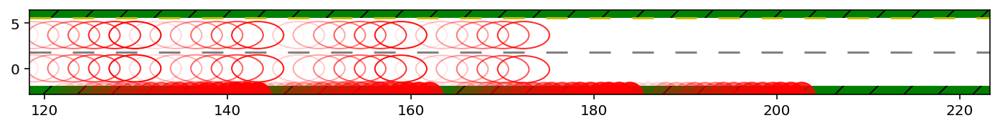

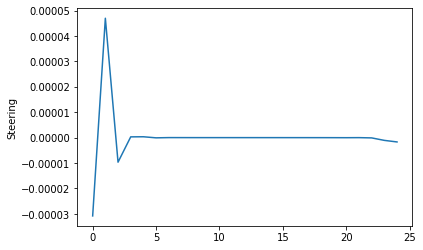

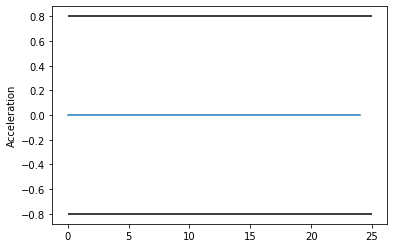

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.80ms ( 94.58us)   1.81ms ( 95.02us)        19
       nlp_g  |  11.04ms (580.79us)  11.29ms (594.42us)        19
    nlp_grad  |   1.82ms (  1.82ms)   1.82ms (  1.82ms)         1
  nlp_grad_f  |   2.24ms (112.20us)   2.25ms (112.64us)        20
  nlp_hess_l  |  77.44ms (  4.30ms)  83.40ms (  4.63ms)        18
   nlp_jac_g  |  44.02ms (  2.20ms)  46.20ms (  2.31ms)        20
       total  | 262.62ms (262.62ms) 273.39ms (273.39ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


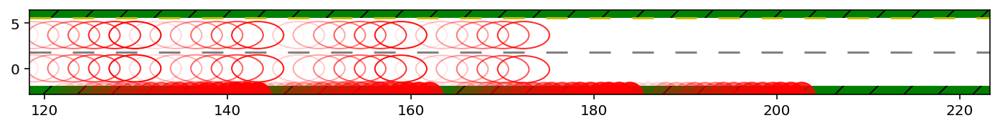

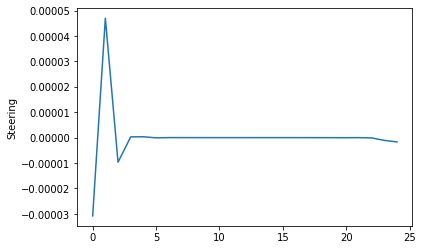

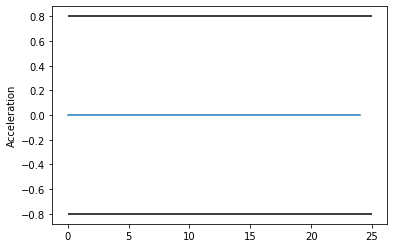

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.75ms (110.16us)   3.46ms (138.50us)        25
       nlp_g  |  15.73ms (629.28us)  16.09ms (643.65us)        25
    nlp_grad  |   1.70ms (  1.70ms)   1.72ms (  1.72ms)         1
  nlp_grad_f  |   2.42ms (115.48us)   2.45ms (116.87us)        21
  nlp_hess_l  |  78.38ms (  4.13ms)  80.93ms (  4.26ms)        19
   nlp_jac_g  |  46.37ms (  2.21ms)  48.33ms (  2.30ms)        21
       total  | 274.55ms (274.55ms) 283.33ms (283.33ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


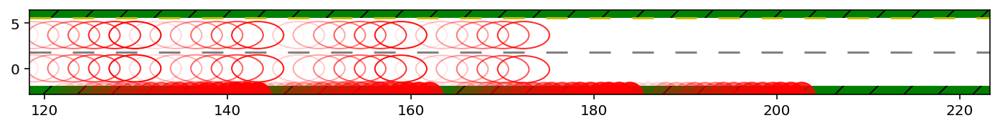

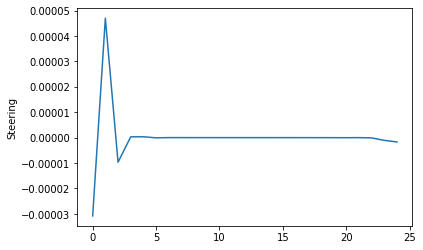

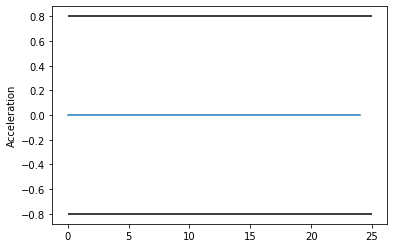

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.49ms (106.71us)   1.50ms (107.14us)        14
       nlp_g  |   9.26ms (661.64us)   9.49ms (678.16us)        14
    nlp_grad  |   1.64ms (  1.64ms)   1.64ms (  1.64ms)         1
  nlp_grad_f  |   2.07ms (137.87us)   2.11ms (140.68us)        15
  nlp_hess_l  |  56.00ms (  4.31ms)  58.46ms (  4.50ms)        13
   nlp_jac_g  |  36.36ms (  2.42ms)  39.31ms (  2.62ms)        15
       total  | 195.89ms (195.89ms) 206.52ms (206.52ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


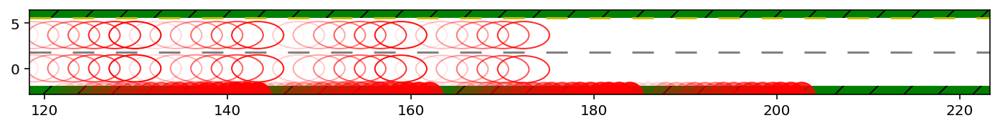

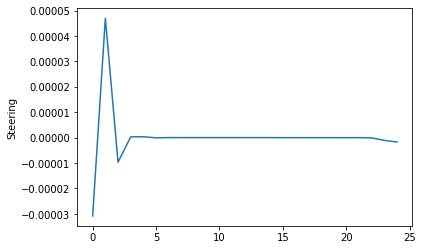

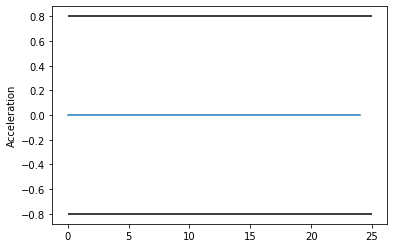

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.52ms (108.43us)   1.60ms (114.20us)        14
       nlp_g  |   8.78ms (626.93us)   9.28ms (663.06us)        14
    nlp_grad  |   1.71ms (  1.71ms)   1.74ms (  1.74ms)         1
  nlp_grad_f  |   1.75ms (116.73us)   1.76ms (117.15us)        15
  nlp_hess_l  |  54.42ms (  4.19ms)  55.51ms (  4.27ms)        13
   nlp_jac_g  |  32.23ms (  2.15ms)  32.66ms (  2.18ms)        15
       total  | 183.60ms (183.60ms) 187.27ms (187.27ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


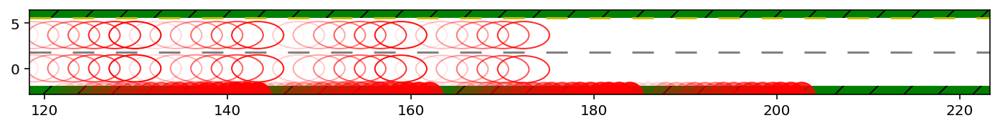

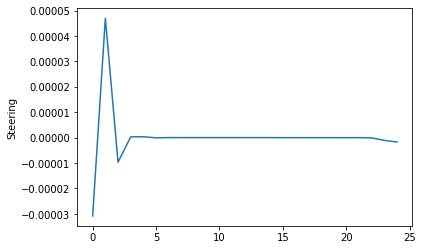

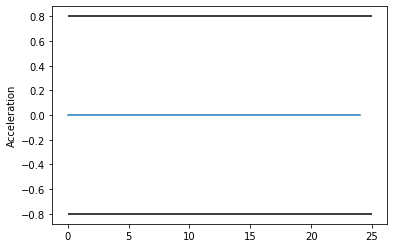

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.30ms ( 99.92us)   1.85ms (142.18us)        13
       nlp_g  |   8.22ms (632.08us)   8.43ms (648.10us)        13
    nlp_grad  |   1.78ms (  1.78ms)   1.78ms (  1.78ms)         1
  nlp_grad_f  |   1.55ms (111.00us)   1.56ms (111.30us)        14
  nlp_hess_l  |  49.16ms (  4.10ms)  49.66ms (  4.14ms)        12
   nlp_jac_g  |  29.91ms (  2.14ms)  30.32ms (  2.17ms)        14
       total  | 170.83ms (170.83ms) 173.23ms (173.23ms)         1
 i_mpc 2 n_round 0 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


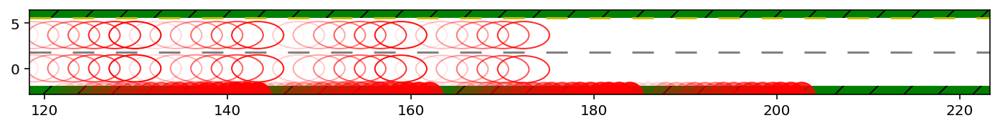

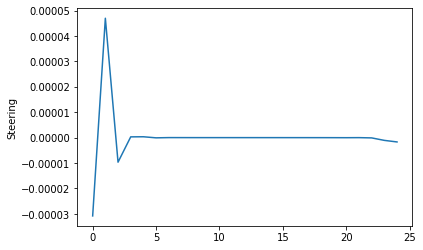

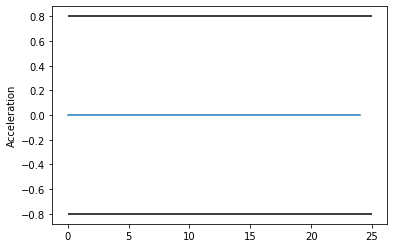

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.51ms (119.33us)   2.55ms (121.66us)        21
       nlp_g  |  12.91ms (614.95us)  13.02ms (620.16us)        21
    nlp_grad  |   1.84ms (  1.84ms)   1.86ms (  1.86ms)         1
  nlp_grad_f  |   2.83ms (128.77us)   2.85ms (129.52us)        22
  nlp_hess_l  |  85.91ms (  4.30ms)  86.92ms (  4.35ms)        20
   nlp_jac_g  |  47.14ms (  2.14ms)  47.77ms (  2.17ms)        22
       total  | 288.45ms (288.45ms) 293.82ms (293.82ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.75ms ( 91.67us)   3.23ms (107.79us)        30
       nlp_g  |  14.21ms (473.50us)  16.40ms (546.72us)        30
    nlp_grad  |   1.67ms (  1.67ms)   1.71ms (  1.71ms)         1
  nlp_grad_f  |   2.97ms (109.85us)   3.01ms (111.52us)        27
  nlp_hess_l  | 100.17ms (  4.01ms) 103.78ms (  4.15ms)        25
   nlp_jac_g  |  54.33ms (  2.01ms)  55.86ms (  2.07ms)     

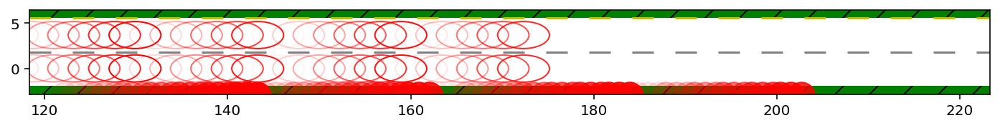

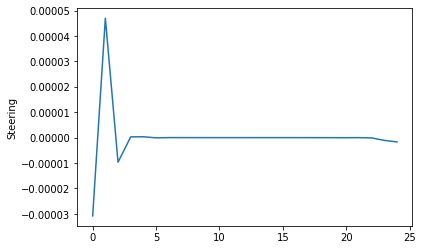

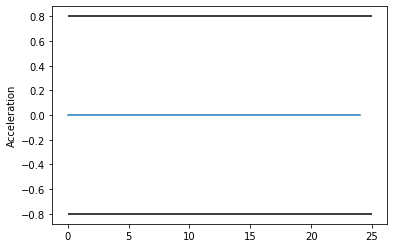

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.54ms (101.44us)   2.56ms (102.23us)        25
       nlp_g  |  14.95ms (597.80us)  17.56ms (702.32us)        25
    nlp_grad  |   1.69ms (  1.69ms)   1.71ms (  1.71ms)         1
  nlp_grad_f  |   2.45ms (122.30us)   2.47ms (123.62us)        20
  nlp_hess_l  |  74.09ms (  4.12ms)  95.49ms (  5.31ms)        18
   nlp_jac_g  |  43.32ms (  2.17ms)  47.05ms (  2.35ms)        20
       total  | 264.47ms (264.47ms) 303.79ms (303.79ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


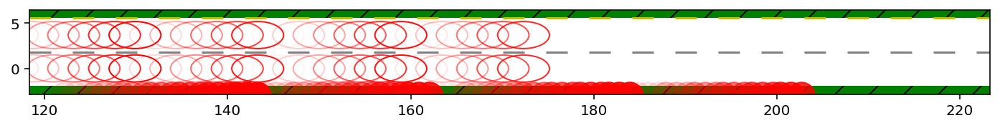

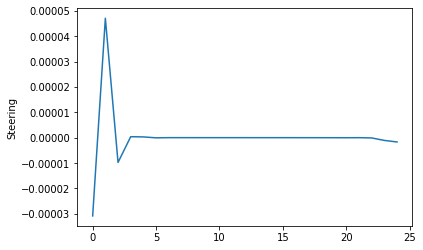

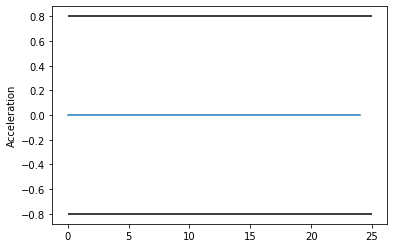

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.47ms (104.71us)   1.47ms (105.24us)        14
       nlp_g  |   8.78ms (626.79us)   9.70ms (692.52us)        14
    nlp_grad  |   1.68ms (  1.68ms)   1.68ms (  1.68ms)         1
  nlp_grad_f  |   1.54ms (110.07us)   2.15ms (153.25us)        14
  nlp_hess_l  |  53.14ms (  4.43ms)  62.54ms (  5.21ms)        12
   nlp_jac_g  |  32.95ms (  2.35ms)  36.85ms (  2.63ms)        14
       total  | 187.36ms (187.36ms) 208.67ms (208.67ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


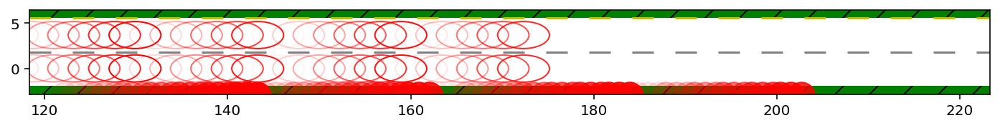

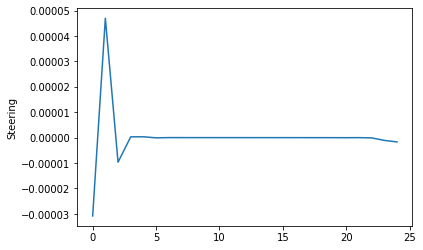

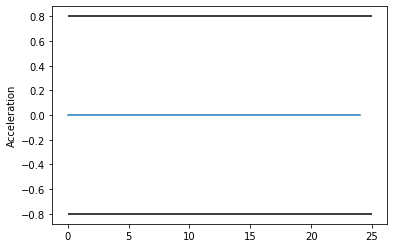

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.65ms (102.87us)   1.65ms (103.11us)        16
       nlp_g  |   9.86ms (616.31us)  10.29ms (643.34us)        16
    nlp_grad  |   1.67ms (  1.67ms)   1.67ms (  1.67ms)         1
  nlp_grad_f  |   1.59ms (106.00us)   1.85ms (123.30us)        15
  nlp_hess_l  |  52.85ms (  4.07ms)  59.99ms (  4.61ms)        13
   nlp_jac_g  |  32.28ms (  2.15ms)  35.84ms (  2.39ms)        15
       total  | 187.02ms (187.02ms) 204.73ms (204.73ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


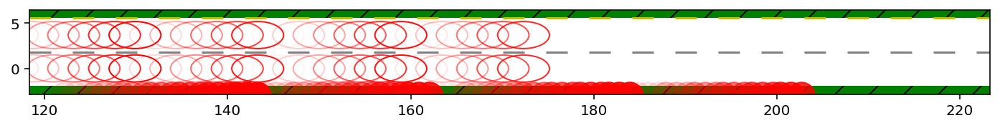

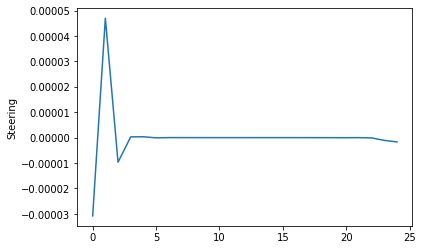

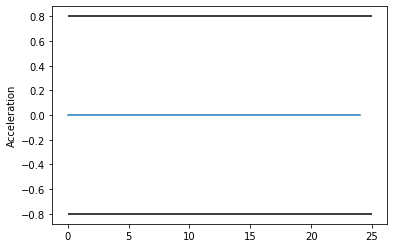

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.06ms (108.58us)   2.11ms (111.19us)        19
       nlp_g  |  12.53ms (659.53us)  12.69ms (668.14us)        19
    nlp_grad  |   1.90ms (  1.90ms)   2.76ms (  2.76ms)         1
  nlp_grad_f  |   2.16ms (108.25us)   2.20ms (110.20us)        20
  nlp_hess_l  |  73.02ms (  4.06ms)  74.40ms (  4.13ms)        18
   nlp_jac_g  |  44.30ms (  2.22ms)  45.62ms (  2.28ms)        20
       total  | 253.96ms (253.96ms) 262.52ms (262.52ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


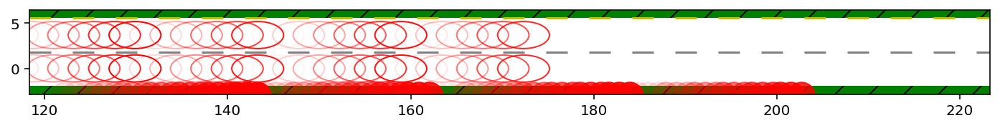

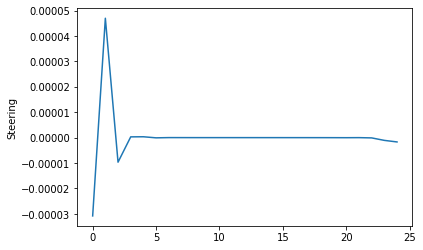

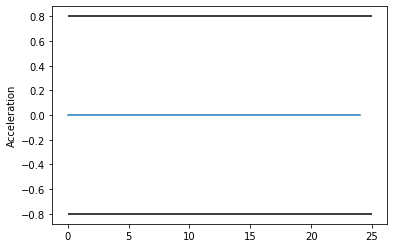

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.35ms ( 94.16us)   2.36ms ( 94.43us)        25
       nlp_g  |  15.26ms (610.48us)  15.51ms (620.38us)        25
    nlp_grad  |   1.61ms (  1.61ms)   1.61ms (  1.61ms)         1
  nlp_grad_f  |   2.11ms (100.52us)   2.11ms (100.47us)        21
  nlp_hess_l  |  74.98ms (  3.95ms)  76.24ms (  4.01ms)        19
   nlp_jac_g  |  44.45ms (  2.12ms)  44.69ms (  2.13ms)        21
       total  | 265.83ms (265.83ms) 270.08ms (270.08ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


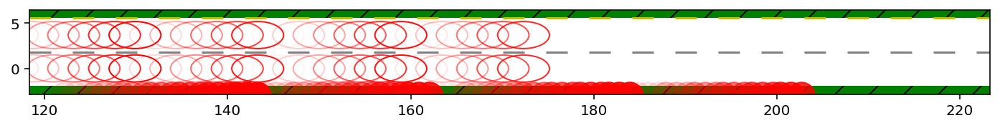

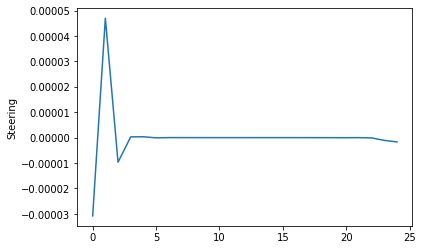

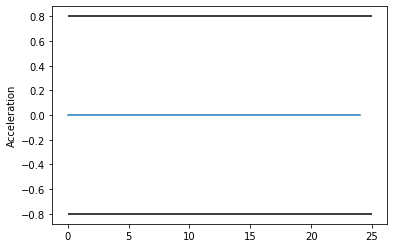

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.67ms (104.12us)   1.68ms (105.23us)        16
       nlp_g  |  10.23ms (639.56us)  10.26ms (641.13us)        16
    nlp_grad  |   1.77ms (  1.77ms)   1.78ms (  1.78ms)         1
  nlp_grad_f  |   1.45ms (103.50us)   1.46ms (104.26us)        14
  nlp_hess_l  |  47.80ms (  3.98ms)  49.21ms (  4.10ms)        12
   nlp_jac_g  |  29.85ms (  2.13ms)  30.91ms (  2.21ms)        14
       total  | 173.30ms (173.30ms) 179.24ms (179.24ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


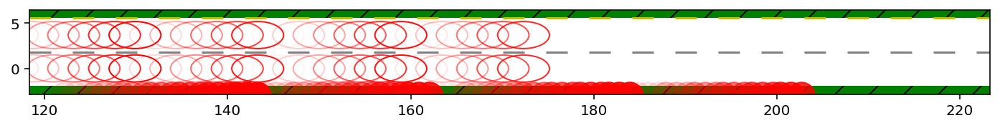

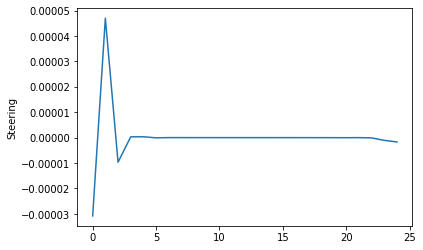

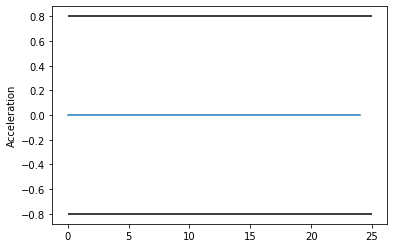

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.87ms (109.94us)   1.89ms (111.37us)        17
       nlp_g  |  11.53ms (678.06us)  11.78ms (693.11us)        17
    nlp_grad  |   1.96ms (  1.96ms)   2.16ms (  2.16ms)         1
  nlp_grad_f  |   1.74ms (116.27us)   1.79ms (119.03us)        15
  nlp_hess_l  |  51.83ms (  3.99ms)  53.03ms (  4.08ms)        13
   nlp_jac_g  |  31.58ms (  2.11ms)  32.00ms (  2.13ms)        15
       total  | 189.77ms (189.77ms) 194.54ms (194.54ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


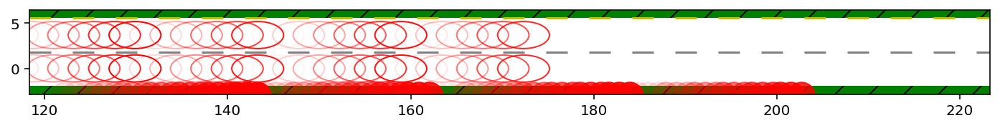

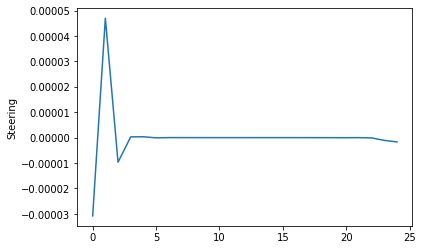

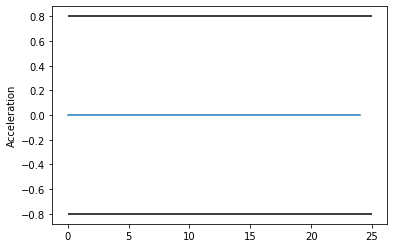

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.33ms (122.37us)   2.35ms (123.76us)        19
       nlp_g  |  12.80ms (673.79us)  13.10ms (689.26us)        19
    nlp_grad  |   1.88ms (  1.88ms)   2.07ms (  2.07ms)         1
  nlp_grad_f  |   2.78ms (138.85us)   2.79ms (139.74us)        20
  nlp_hess_l  |  73.93ms (  4.11ms)  74.98ms (  4.17ms)        18
   nlp_jac_g  |  44.44ms (  2.22ms)  46.21ms (  2.31ms)        20
       total  | 251.36ms (251.36ms) 255.34ms (255.34ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


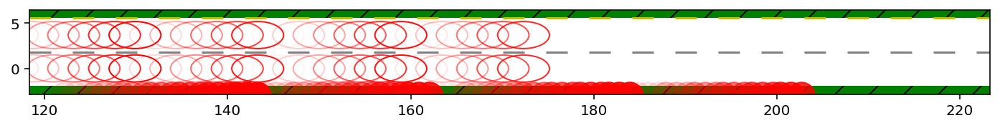

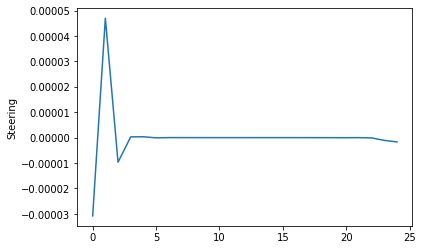

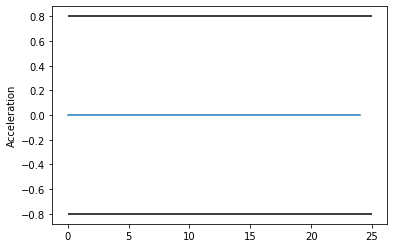

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.74ms (105.27us)   2.76ms (106.31us)        26
       nlp_g  |  17.03ms (655.19us)  18.26ms (702.15us)        26
    nlp_grad  |   1.65ms (  1.65ms)   1.65ms (  1.65ms)         1
  nlp_grad_f  |   2.71ms (122.95us)   2.83ms (128.77us)        22
  nlp_hess_l  |  82.43ms (  4.12ms) 109.15ms (  5.46ms)        20
   nlp_jac_g  |  50.63ms (  2.30ms)  58.72ms (  2.67ms)        22
       total  | 296.49ms (296.49ms) 348.98ms (348.98ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


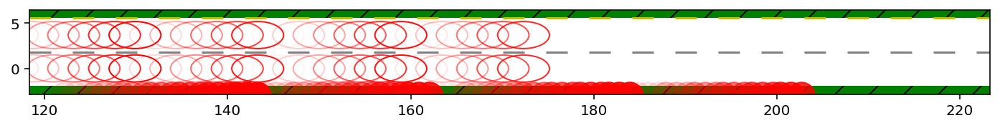

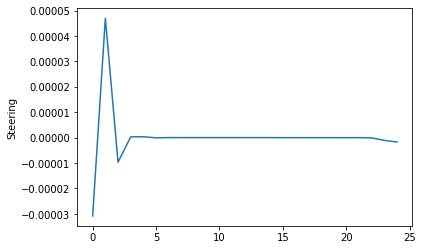

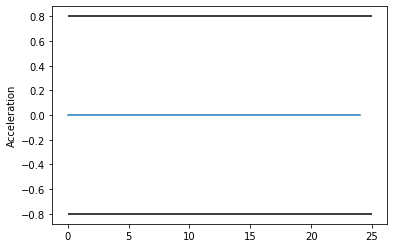

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.33ms (102.38us)   1.38ms (105.91us)        13
       nlp_g  |   8.68ms (667.54us)   9.03ms (694.68us)        13
    nlp_grad  |   2.08ms (  2.08ms)   2.09ms (  2.09ms)         1
  nlp_grad_f  |   1.50ms (106.93us)   1.51ms (107.98us)        14
  nlp_hess_l  |  51.11ms (  4.26ms)  53.69ms (  4.47ms)        12
   nlp_jac_g  |  32.07ms (  2.29ms)  33.04ms (  2.36ms)        14
       total  | 176.08ms (176.08ms) 185.78ms (185.78ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


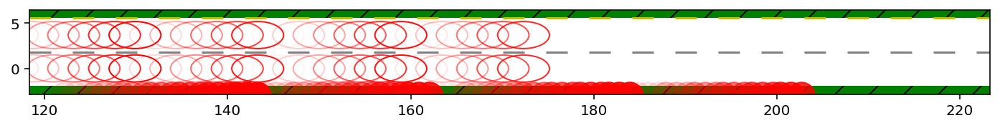

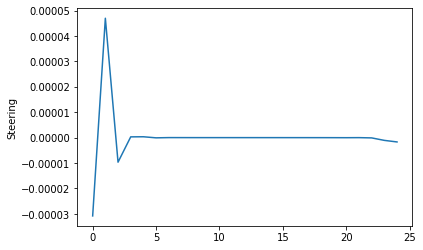

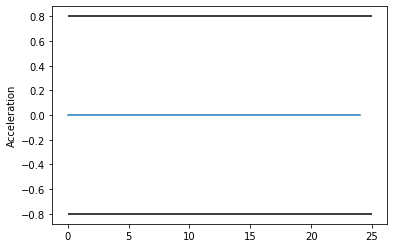

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.55ms (110.57us)   1.55ms (110.62us)        14
       nlp_g  |   9.67ms (690.79us)  10.27ms (733.31us)        14
    nlp_grad  |   1.69ms (  1.69ms)   1.70ms (  1.70ms)         1
  nlp_grad_f  |   1.88ms (125.27us)   1.88ms (125.44us)        15
  nlp_hess_l  |  54.03ms (  4.16ms)  59.92ms (  4.61ms)        13
   nlp_jac_g  |  34.12ms (  2.27ms)  47.70ms (  3.18ms)        15
       total  | 188.68ms (188.68ms) 218.18ms (218.18ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


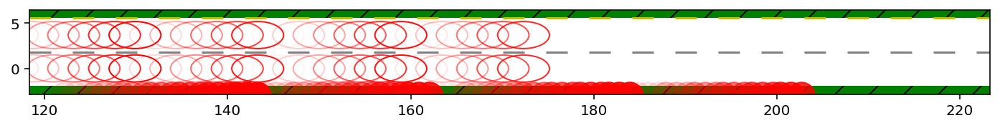

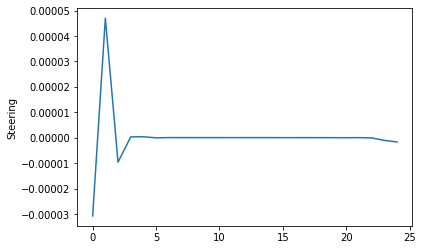

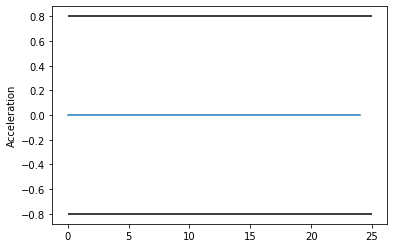

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.52ms (117.08us)   1.67ms (128.19us)        13
       nlp_g  |   8.39ms (645.08us)   8.61ms (662.04us)        13
    nlp_grad  |   1.67ms (  1.67ms)   1.67ms (  1.67ms)         1
  nlp_grad_f  |   2.08ms (148.36us)   2.38ms (170.11us)        14
  nlp_hess_l  |  52.24ms (  4.35ms)  54.81ms (  4.57ms)        12
   nlp_jac_g  |  33.31ms (  2.38ms)  35.95ms (  2.57ms)        14
       total  | 181.69ms (181.69ms) 190.45ms (190.45ms)         1
 i_mpc 2 n_round 1 i 01 Cost -7005.57 Slack 0.00 
 J_i -7005.566,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


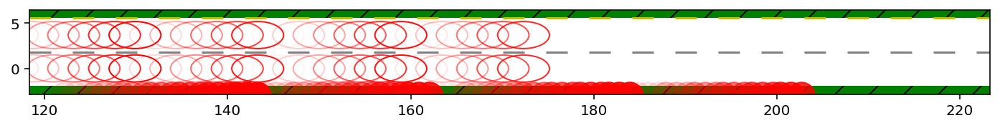

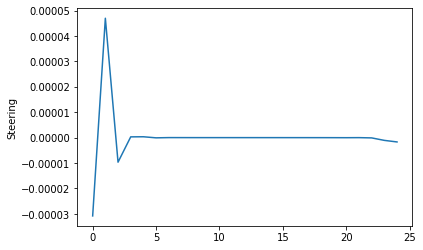

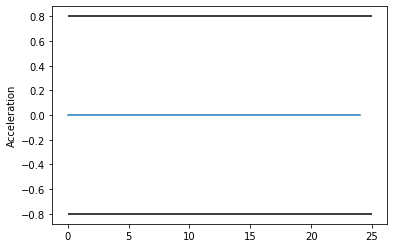

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.58ms (123.00us)   3.91ms (185.98us)        21
       nlp_g  |  12.86ms (612.38us)  13.86ms (659.90us)        21
    nlp_grad  |   1.72ms (  1.72ms)   1.72ms (  1.72ms)         1
  nlp_grad_f  |   2.47ms (112.27us)   2.48ms (112.70us)        22
  nlp_hess_l  |  85.61ms (  4.28ms)  90.84ms (  4.54ms)        20
   nlp_jac_g  |  46.63ms (  2.12ms)  51.23ms (  2.33ms)        22
       total  | 281.17ms (281.17ms) 307.19ms (307.19ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   3.13ms (104.37us)   3.20ms (106.74us)        30
       nlp_g  |  16.05ms (534.87us)  16.26ms (541.84us)        30
    nlp_grad  |   1.73ms (  1.73ms)   1.72ms (  1.72ms)         1
  nlp_grad_f  |   3.08ms (114.22us)   3.10ms (114.82us)        27
  nlp_hess_l  | 104.96ms (  4.20ms) 110.48ms (  4.42ms)        25
   nlp_jac_g  |  55.46ms (  2.05ms)  57.16ms (  2.12ms)     

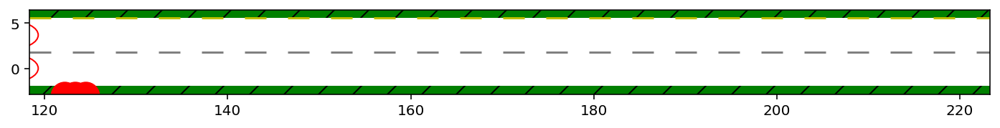

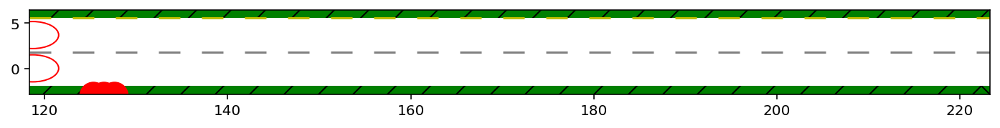

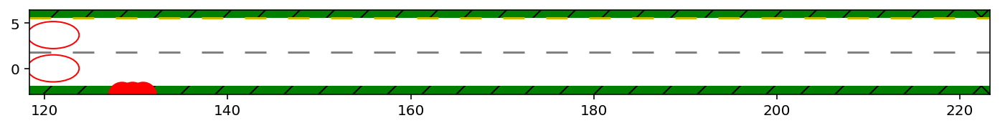

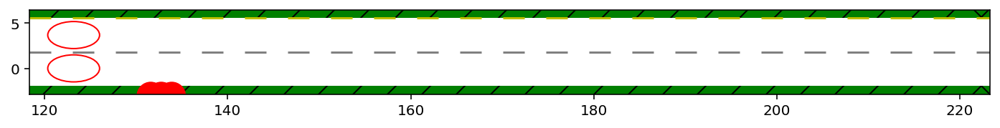

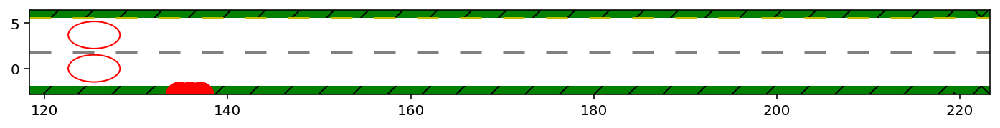

...

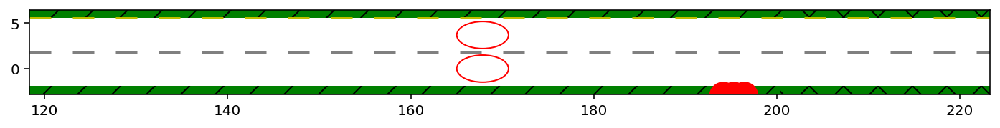

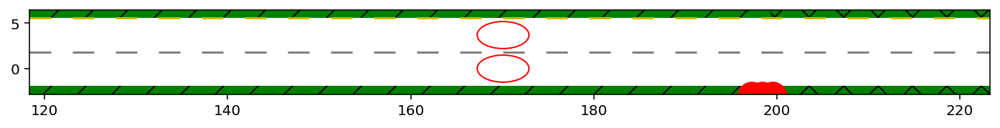

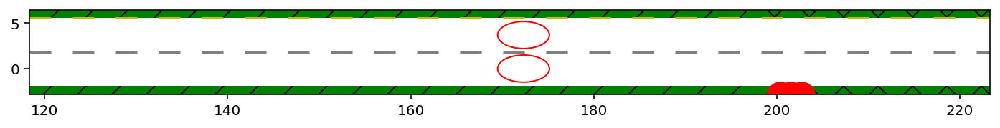

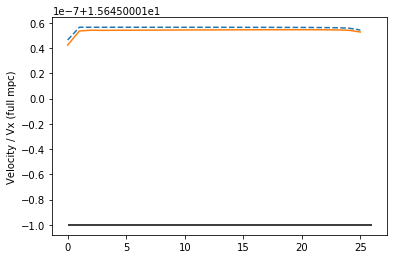

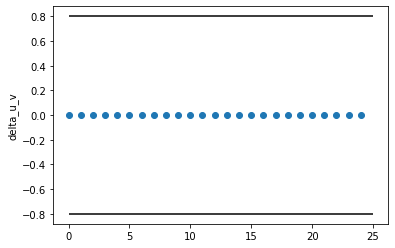

Initial conditions MPC_i: 3 IBR_i: 0 x: 201.6 y:-3.0
(array([[-1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04,
        -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04,
        -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04,
        -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04, -1.10e-04,
        -1.10e-04],
       [-3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15,
        -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15,
        -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15,
        -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15, -3.13e-15,
        -3.13e-15]]), array([ 1.72e+02,  2.12e-02, -2.36e-05,  5.54e-05,  1.12e+01,  1.63e+02]))
(array([[-2.79e-09, -2.79e-09, -2.79e-09, -2.79e-09, -2.79e-09, -2.79e-09,
        -2.79e-09, -2.79e-09, -2.79e-09, -2.79e-09, -2.79e-09, -2.79e-09,
        -2.79e-09, -2.79e-09, -2.79e-09, -2.79e-09, -2.79e-09, -2.79e-09,
        -2.79e

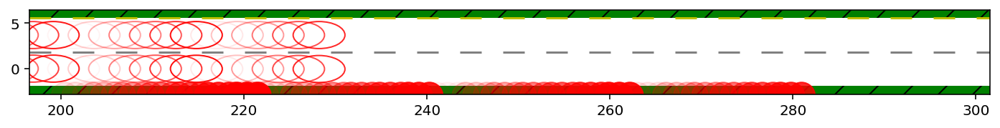

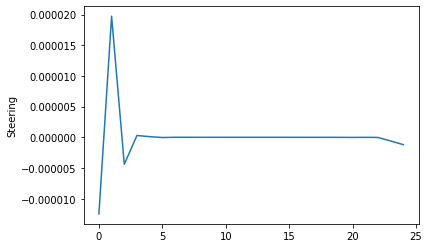

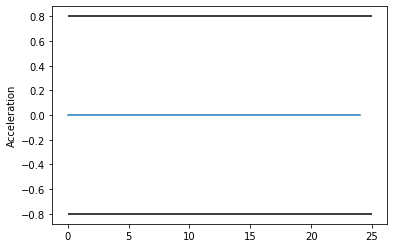

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.44ms ( 76.00us)   1.43ms ( 75.52us)        19
       nlp_g  |   2.88ms (151.68us)   5.89ms (310.14us)        19
    nlp_grad  | 474.00us (474.00us) 498.91us (498.91us)         1
  nlp_grad_f  |   2.00ms ( 99.85us)   2.06ms (103.05us)        20
  nlp_hess_l  |  38.27ms (  2.13ms)  43.74ms (  2.43ms)        18
   nlp_jac_g  |  19.70ms (985.00us)  21.81ms (  1.09ms)        20
       total  | 146.83ms (146.83ms) 159.85ms (159.85ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


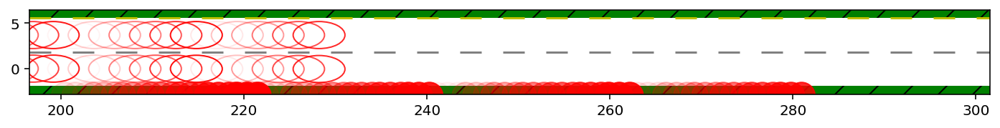

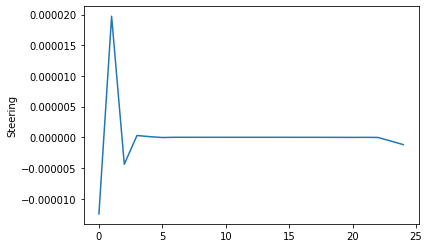

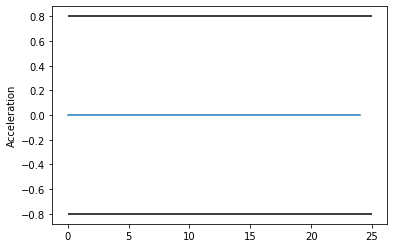

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.23ms ( 87.79us)   1.24ms ( 88.46us)        14
       nlp_g  |   2.18ms (155.64us)   2.19ms (156.42us)        14
    nlp_grad  | 616.00us (616.00us) 800.58us (800.58us)         1
  nlp_grad_f  |   1.61ms (107.53us)   1.63ms (108.72us)        15
  nlp_hess_l  |  26.96ms (  2.07ms)  28.25ms (  2.17ms)        13
   nlp_jac_g  |  15.30ms (  1.02ms)  18.46ms (  1.23ms)        15
       total  | 108.16ms (108.16ms) 118.15ms (118.15ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


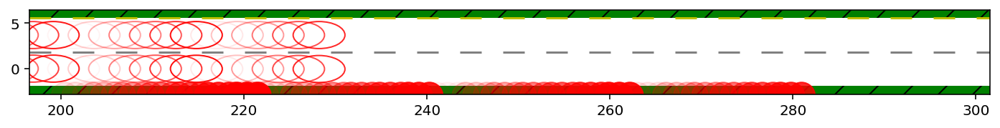

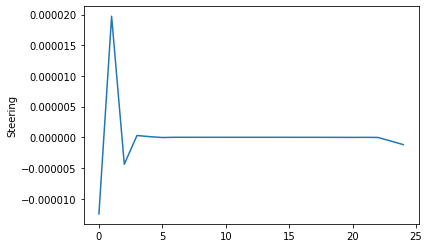

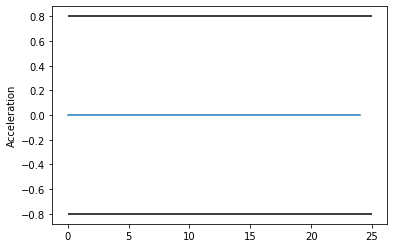

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.26ms ( 89.86us)   1.27ms ( 90.78us)        14
       nlp_g  |   2.31ms (165.29us)   2.40ms (171.49us)        14
    nlp_grad  | 504.00us (504.00us) 503.67us (503.67us)         1
  nlp_grad_f  |   1.39ms ( 92.60us)   1.40ms ( 93.35us)        15
  nlp_hess_l  |  28.40ms (  2.18ms)  29.25ms (  2.25ms)        13
   nlp_jac_g  |  15.18ms (  1.01ms)  15.96ms (  1.06ms)        15
       total  | 111.32ms (111.32ms) 114.42ms (114.42ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


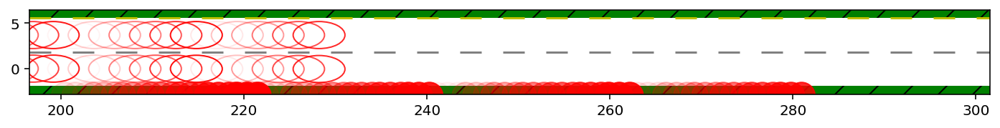

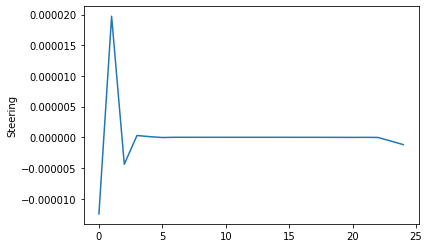

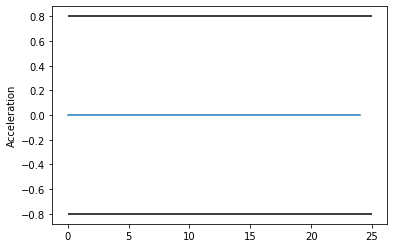

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.42ms ( 88.88us)   1.43ms ( 89.58us)        16
       nlp_g  |   2.86ms (178.62us)   2.86ms (179.03us)        16
    nlp_grad  | 513.00us (513.00us) 512.67us (512.67us)         1
  nlp_grad_f  |   1.95ms (114.53us)   2.01ms (118.10us)        17
  nlp_hess_l  |  31.14ms (  2.08ms)  31.56ms (  2.10ms)        15
   nlp_jac_g  |  17.53ms (  1.03ms)  17.77ms (  1.05ms)        17
       total  | 125.87ms (125.87ms) 128.47ms (128.47ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


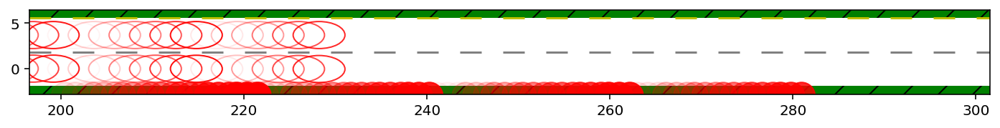

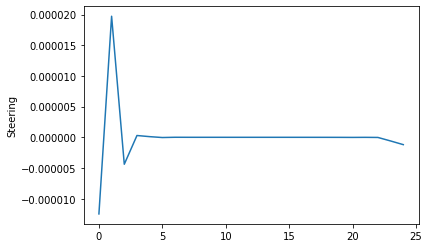

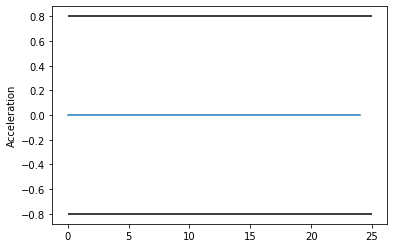

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.63ms ( 86.00us)   1.66ms ( 87.25us)        19
       nlp_g  |   2.96ms (155.63us)   3.07ms (161.38us)        19
    nlp_grad  | 473.00us (473.00us) 473.91us (473.91us)         1
  nlp_grad_f  |   2.03ms (101.60us)   2.09ms (104.55us)        20
  nlp_hess_l  |  36.84ms (  2.05ms)  39.07ms (  2.17ms)        18
   nlp_jac_g  |  19.77ms (988.65us)  20.06ms (  1.00ms)        20
       total  | 144.04ms (144.04ms) 147.53ms (147.53ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


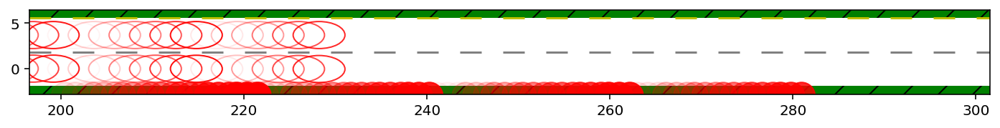

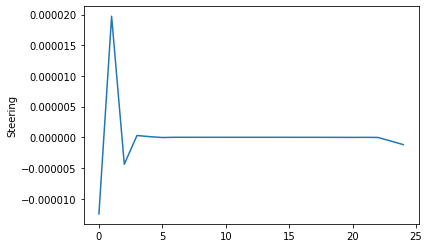

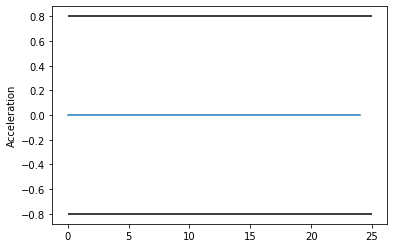

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.20ms ( 86.07us)   1.22ms ( 87.16us)        14
       nlp_g  |   2.32ms (165.43us)   2.33ms (166.58us)        14
    nlp_grad  | 470.00us (470.00us) 509.24us (509.24us)         1
  nlp_grad_f  |   1.32ms ( 88.27us)   1.33ms ( 88.82us)        15
  nlp_hess_l  |  27.68ms (  2.13ms)  31.60ms (  2.43ms)        13
   nlp_jac_g  |  14.94ms (996.13us)  16.29ms (  1.09ms)        15
       total  | 108.03ms (108.03ms) 118.46ms (118.46ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


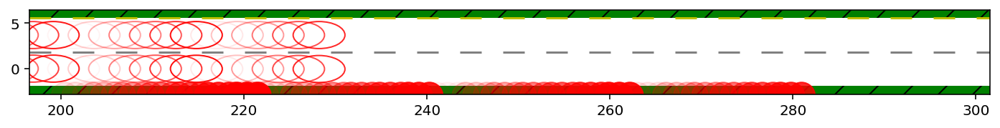

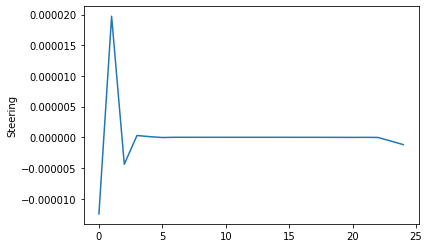

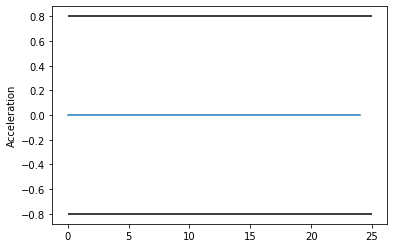

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.21ms ( 86.64us)   1.22ms ( 87.31us)        14
       nlp_g  |   2.28ms (163.14us)   2.33ms (166.43us)        14
    nlp_grad  | 513.00us (513.00us) 513.60us (513.60us)         1
  nlp_grad_f  |   1.52ms (101.13us)   1.62ms (107.80us)        15
  nlp_hess_l  |  28.27ms (  2.17ms)  29.86ms (  2.30ms)        13
   nlp_jac_g  |  14.88ms (991.87us)  15.00ms (999.67us)        15
       total  | 109.22ms (109.22ms) 112.45ms (112.45ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


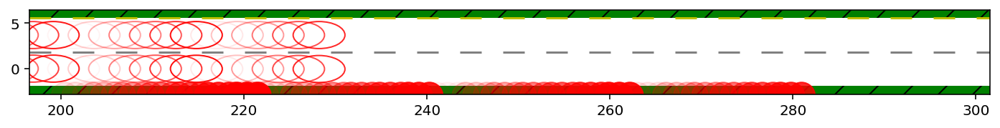

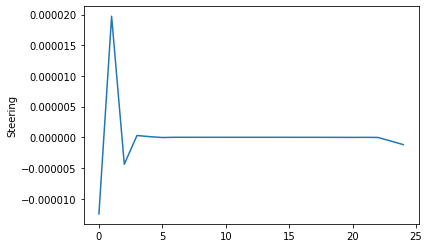

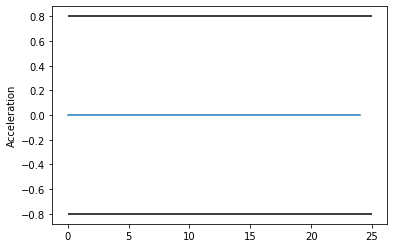

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.62ms ( 95.06us)   1.88ms (110.65us)        17
       nlp_g  |   2.63ms (154.47us)   2.64ms (155.34us)        17
    nlp_grad  | 529.00us (529.00us)   1.16ms (  1.16ms)         1
  nlp_grad_f  |   1.76ms ( 97.67us)   1.78ms ( 99.16us)        18
  nlp_hess_l  |  32.23ms (  2.01ms)  33.62ms (  2.10ms)        16
   nlp_jac_g  |  17.03ms (946.33us)  18.47ms (  1.03ms)        18
       total  | 128.08ms (128.08ms) 138.08ms (138.08ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


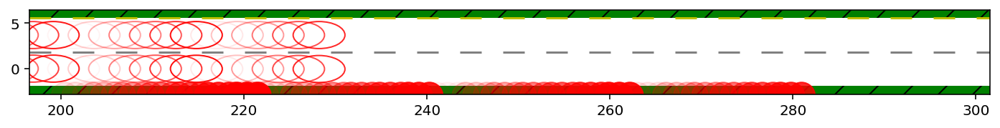

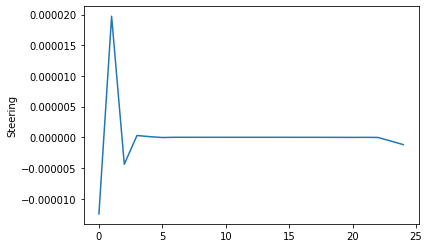

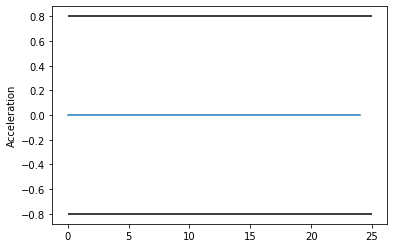

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.69ms ( 88.89us)   1.69ms ( 89.14us)        19
       nlp_g  |   3.35ms (176.21us)   3.51ms (184.50us)        19
    nlp_grad  | 429.00us (429.00us) 429.60us (429.60us)         1
  nlp_grad_f  |   2.15ms (107.65us)   2.31ms (115.48us)        20
  nlp_hess_l  |  37.86ms (  2.10ms)  38.32ms (  2.13ms)        18
   nlp_jac_g  |  20.58ms (  1.03ms)  20.87ms (  1.04ms)        20
       total  | 149.44ms (149.44ms) 151.33ms (151.33ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


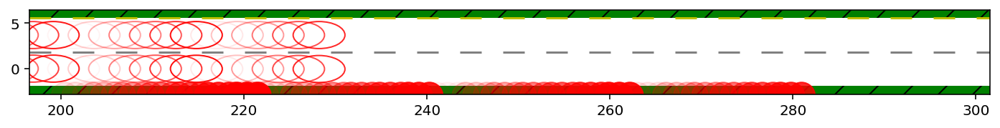

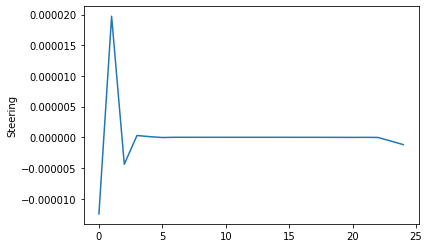

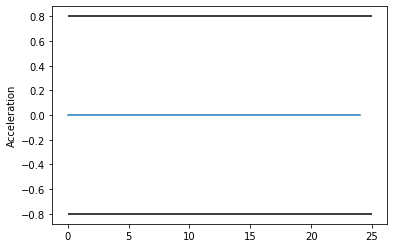

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.56ms (111.57us)   1.57ms (112.13us)        14
       nlp_g  |   2.64ms (188.43us)   2.65ms (188.97us)        14
    nlp_grad  | 594.00us (594.00us) 594.43us (594.43us)         1
  nlp_grad_f  |   2.30ms (153.07us)   2.32ms (154.55us)        15
  nlp_hess_l  |  33.51ms (  2.58ms)  43.84ms (  3.37ms)        13
   nlp_jac_g  |  18.96ms (  1.26ms)  23.82ms (  1.59ms)        15
       total  | 135.28ms (135.28ms) 158.92ms (158.92ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


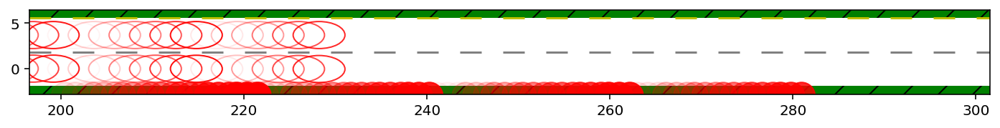

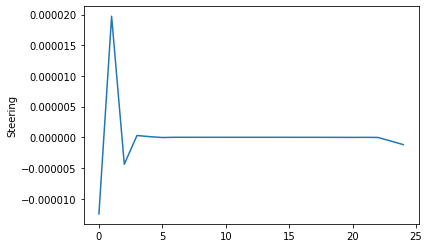

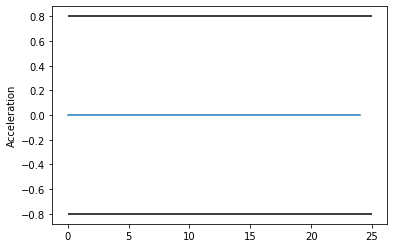

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.16ms ( 83.07us)   1.16ms ( 82.54us)        14
       nlp_g  |   2.18ms (155.71us)   2.19ms (156.14us)        14
    nlp_grad  | 459.00us (459.00us) 459.39us (459.39us)         1
  nlp_grad_f  |   1.73ms (115.60us)   1.81ms (120.96us)        15
  nlp_hess_l  |  27.20ms (  2.09ms)  28.54ms (  2.20ms)        13
   nlp_jac_g  |  15.17ms (  1.01ms)  16.05ms (  1.07ms)        15
       total  | 106.37ms (106.37ms) 115.82ms (115.82ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


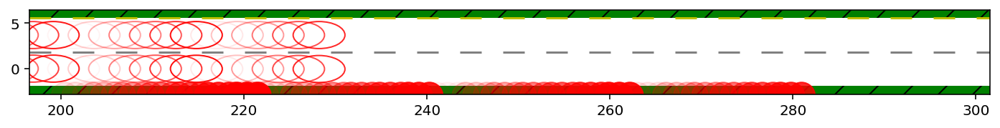

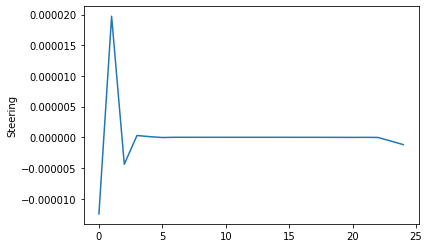

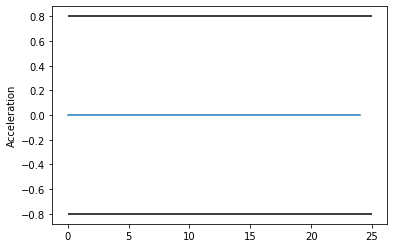

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.48ms (105.79us)   1.48ms (105.82us)        14
       nlp_g  |   2.60ms (185.71us)   2.65ms (189.43us)        14
    nlp_grad  | 897.00us (897.00us) 905.60us (905.60us)         1
  nlp_grad_f  |   1.70ms (113.13us)   1.72ms (114.83us)        15
  nlp_hess_l  |  29.26ms (  2.25ms)  31.21ms (  2.40ms)        13
   nlp_jac_g  |  16.14ms (  1.08ms)  16.57ms (  1.10ms)        15
       total  | 118.14ms (118.14ms) 122.27ms (122.27ms)         1
 i_mpc 3 n_round 0 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


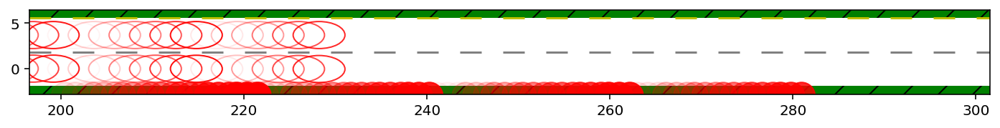

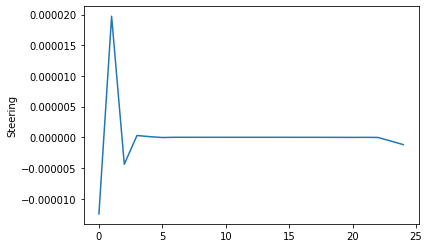

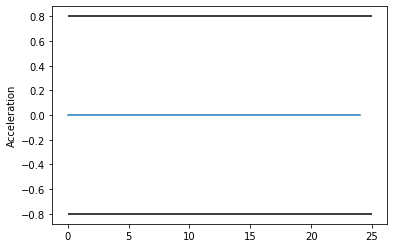

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.55ms (121.52us)   2.57ms (122.15us)        21
       nlp_g  |  13.29ms (632.76us)  13.62ms (648.70us)        21
    nlp_grad  |   1.68ms (  1.68ms)   1.69ms (  1.69ms)         1
  nlp_grad_f  |   2.34ms (106.23us)   2.35ms (106.79us)        22
  nlp_hess_l  |  87.85ms (  4.39ms)  88.77ms (  4.44ms)        20
   nlp_jac_g  |  47.84ms (  2.17ms)  48.79ms (  2.22ms)        22
       total  | 295.70ms (295.70ms) 299.84ms (299.84ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.24ms ( 97.52us)   2.25ms ( 97.82us)        23
       nlp_g  |  11.23ms (488.35us)  11.87ms (516.16us)        23
    nlp_grad  |   1.47ms (  1.47ms)   1.47ms (  1.47ms)         1
  nlp_grad_f  |   2.55ms (106.42us)   2.61ms (108.75us)        24
  nlp_hess_l  |  88.21ms (  4.01ms)  91.12ms (  4.14ms)        22
   nlp_jac_g  |  47.10ms (  1.96ms)  50.85ms (  2.12ms)     

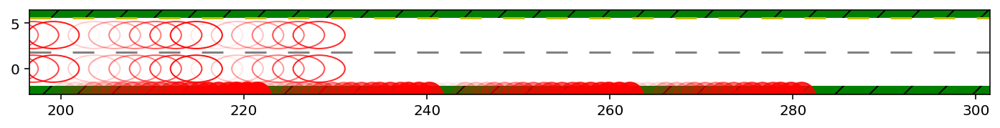

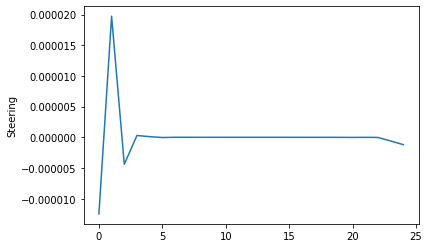

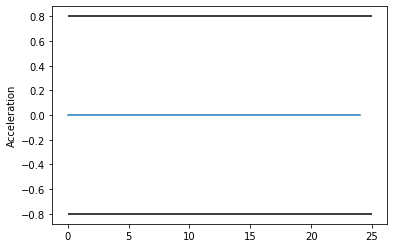

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.70ms ( 89.47us)   1.71ms ( 90.07us)        19
       nlp_g  |   2.89ms (151.89us)   3.11ms (163.42us)        19
    nlp_grad  | 472.00us (472.00us) 473.27us (473.27us)         1
  nlp_grad_f  |   2.07ms (103.65us)   2.20ms (109.83us)        20
  nlp_hess_l  |  38.23ms (  2.12ms)  38.98ms (  2.17ms)        18
   nlp_jac_g  |  20.26ms (  1.01ms)  20.63ms (  1.03ms)        20
       total  | 145.15ms (145.15ms) 148.38ms (148.38ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


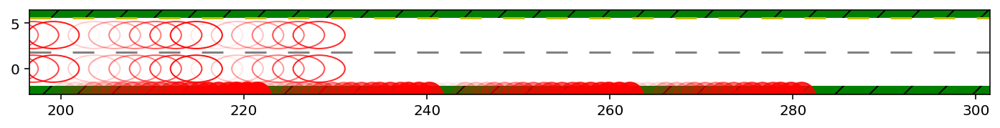

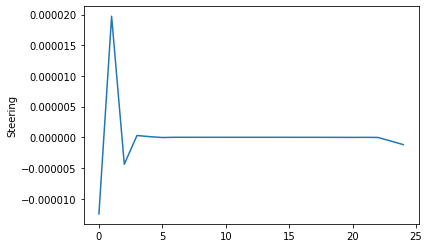

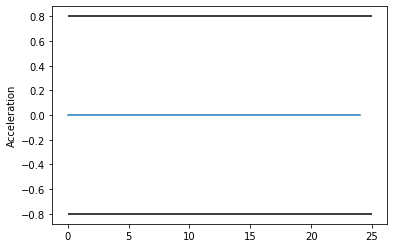

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.29ms ( 92.07us)   1.30ms ( 92.90us)        14
       nlp_g  |   1.96ms (139.71us)   1.96ms (139.76us)        14
    nlp_grad  | 406.00us (406.00us) 407.20us (407.20us)         1
  nlp_grad_f  |   1.38ms ( 92.13us)   1.40ms ( 93.66us)        15
  nlp_hess_l  |  27.29ms (  2.10ms)  29.23ms (  2.25ms)        13
   nlp_jac_g  |  14.13ms (941.73us)  20.39ms (  1.36ms)        15
       total  | 104.24ms (104.24ms) 115.93ms (115.93ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


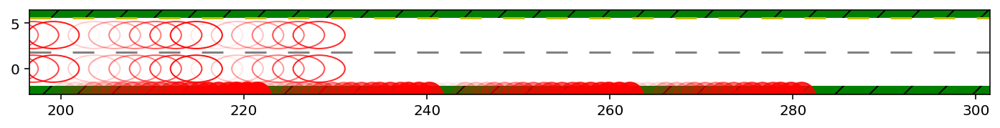

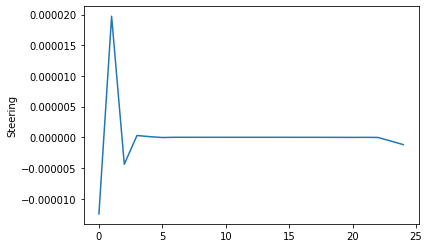

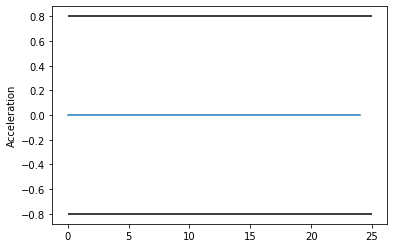

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.21ms ( 86.36us)   1.21ms ( 86.71us)        14
       nlp_g  |   2.36ms (168.29us)   2.37ms (169.07us)        14
    nlp_grad  | 429.00us (429.00us) 428.65us (428.65us)         1
  nlp_grad_f  |   1.43ms ( 95.27us)   1.42ms ( 94.84us)        15
  nlp_hess_l  |  26.95ms (  2.07ms)  27.42ms (  2.11ms)        13
   nlp_jac_g  |  14.37ms (957.67us)  14.64ms (975.75us)        15
       total  | 105.88ms (105.88ms) 107.38ms (107.38ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


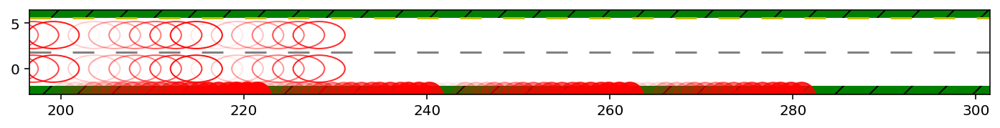

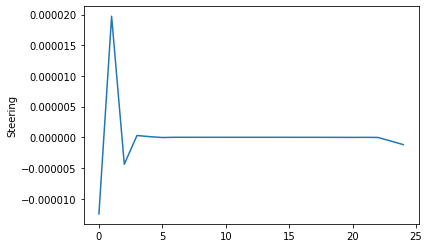

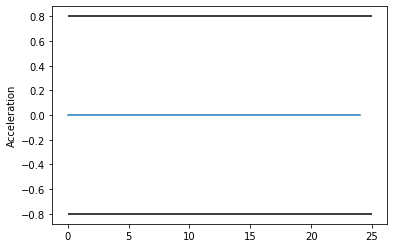

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.56ms ( 97.69us)   2.20ms (137.20us)        16
       nlp_g  |   2.48ms (155.25us)   2.49ms (155.59us)        16
    nlp_grad  | 433.00us (433.00us) 433.96us (433.96us)         1
  nlp_grad_f  |   1.84ms (108.35us)   1.87ms (109.97us)        17
  nlp_hess_l  |  30.73ms (  2.05ms)  31.59ms (  2.11ms)        15
   nlp_jac_g  |  16.30ms (959.06us)  16.45ms (967.89us)        17
       total  | 123.22ms (123.22ms) 126.31ms (126.31ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


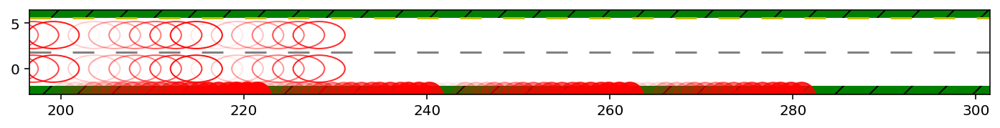

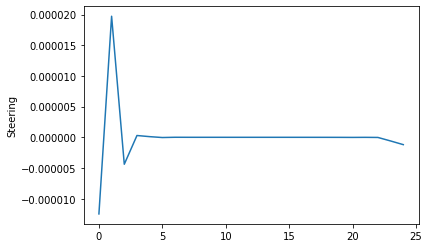

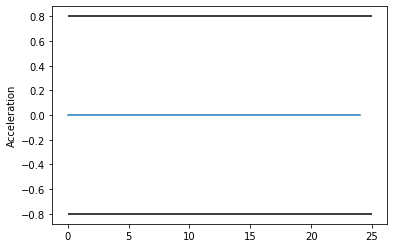

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.88ms ( 99.11us)   1.89ms ( 99.72us)        19
       nlp_g  |   3.51ms (184.95us)   3.50ms (184.19us)        19
    nlp_grad  | 448.00us (448.00us) 448.55us (448.55us)         1
  nlp_grad_f  |   2.31ms (115.30us)   2.44ms (121.99us)        20
  nlp_hess_l  |  37.53ms (  2.08ms)  38.44ms (  2.14ms)        18
   nlp_jac_g  |  20.23ms (  1.01ms)  20.43ms (  1.02ms)        20
       total  | 146.58ms (146.58ms) 148.55ms (148.55ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


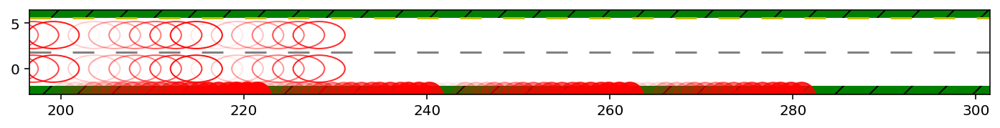

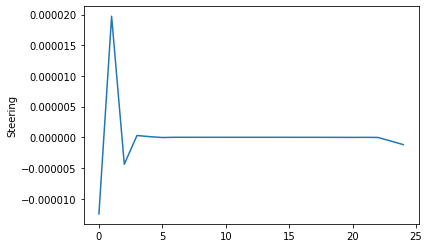

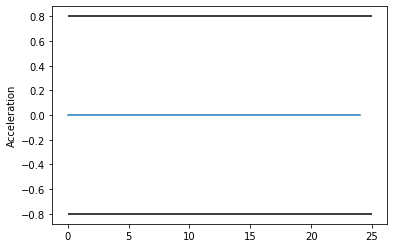

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.45ms (103.21us)   2.79ms (199.12us)        14
       nlp_g  |   2.45ms (175.14us)   2.90ms (207.15us)        14
    nlp_grad  | 406.00us (406.00us) 406.27us (406.27us)         1
  nlp_grad_f  |   1.43ms ( 95.33us)   1.44ms ( 95.76us)        15
  nlp_hess_l  |  26.59ms (  2.05ms)  27.52ms (  2.12ms)        13
   nlp_jac_g  |  14.97ms (997.93us)  16.52ms (  1.10ms)        15
       total  | 109.60ms (109.60ms) 116.16ms (116.16ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


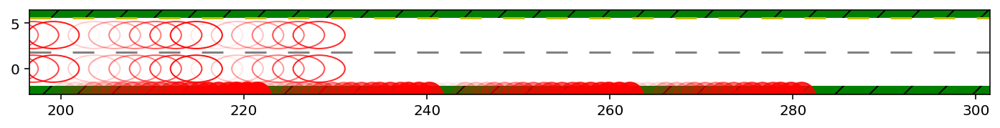

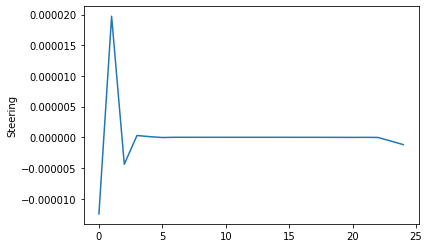

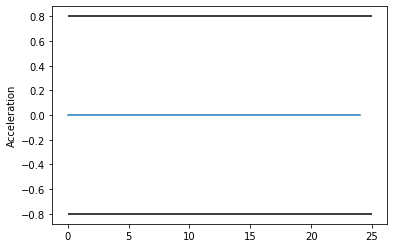

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.30ms ( 92.50us)   1.30ms ( 93.06us)        14
       nlp_g  |   2.34ms (167.36us)   2.40ms (171.15us)        14
    nlp_grad  | 574.00us (574.00us) 584.67us (584.67us)         1
  nlp_grad_f  |   1.62ms (107.80us)   1.66ms (110.90us)        15
  nlp_hess_l  |  29.00ms (  2.23ms)  29.49ms (  2.27ms)        13
   nlp_jac_g  |  15.36ms (  1.02ms)  15.51ms (  1.03ms)        15
       total  | 115.93ms (115.93ms) 118.59ms (118.59ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


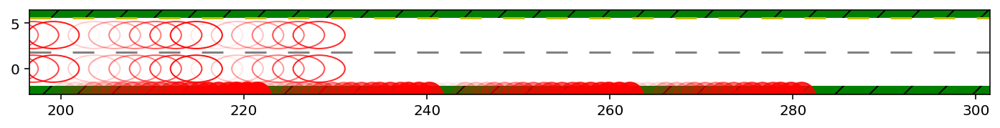

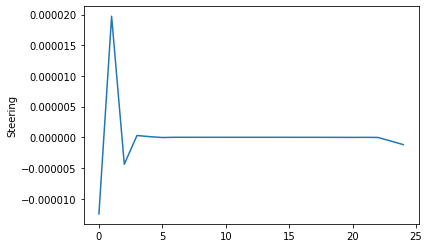

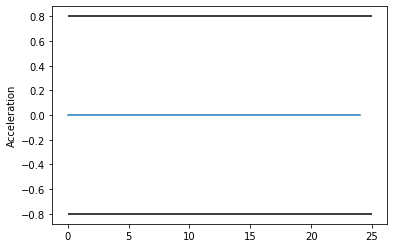

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.75ms (102.88us)   1.82ms (106.91us)        17
       nlp_g  |   2.59ms (152.29us)   2.62ms (154.32us)        17
    nlp_grad  | 654.00us (654.00us) 655.87us (655.87us)         1
  nlp_grad_f  |   1.89ms (105.06us)   1.93ms (107.29us)        18
  nlp_hess_l  |  35.25ms (  2.20ms)  35.82ms (  2.24ms)        16
   nlp_jac_g  |  17.20ms (955.44us)  17.36ms (964.52us)        18
       total  | 132.41ms (132.41ms) 134.55ms (134.55ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


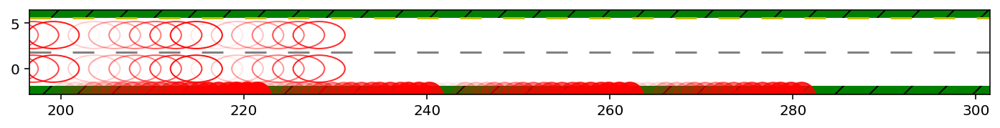

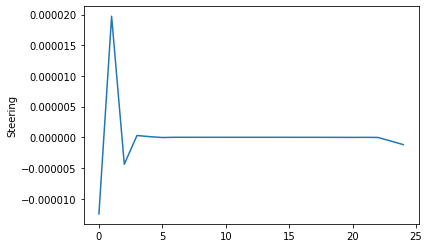

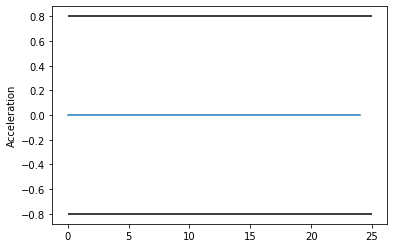

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.81ms ( 95.16us)   2.09ms (109.91us)        19
       nlp_g  |   3.09ms (162.42us)   3.19ms (167.64us)        19
    nlp_grad  | 453.00us (453.00us) 452.14us (452.14us)         1
  nlp_grad_f  |   1.96ms ( 97.95us)   1.98ms ( 98.97us)        20
  nlp_hess_l  |  37.44ms (  2.08ms)  39.83ms (  2.21ms)        18
   nlp_jac_g  |  19.36ms (967.75us)  20.70ms (  1.03ms)        20
       total  | 145.33ms (145.33ms) 157.56ms (157.56ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


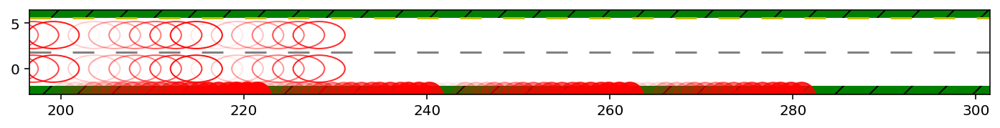

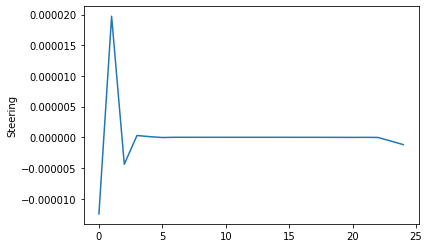

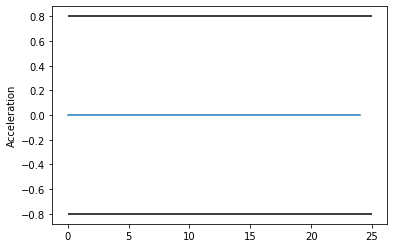

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.40ms ( 99.64us)   1.41ms (100.68us)        14
       nlp_g  |   2.39ms (170.43us)   2.42ms (173.03us)        14
    nlp_grad  | 486.00us (486.00us) 486.93us (486.93us)         1
  nlp_grad_f  |   1.72ms (114.87us)   2.06ms (137.43us)        15
  nlp_hess_l  |  28.85ms (  2.22ms)  32.83ms (  2.53ms)        13
   nlp_jac_g  |  14.70ms (980.13us)  14.78ms (985.58us)        15
       total  | 113.33ms (113.33ms) 125.20ms (125.20ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


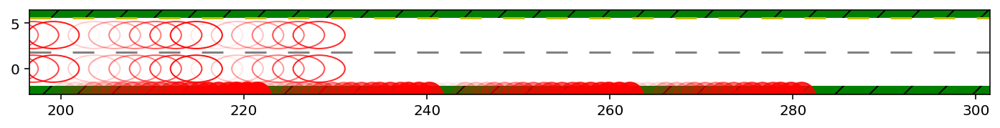

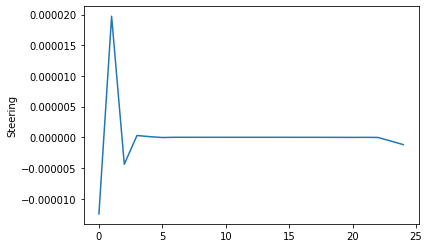

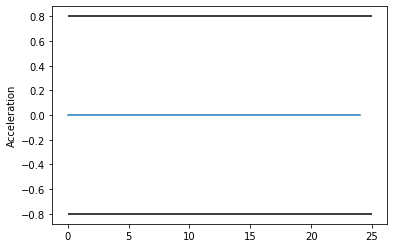

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.31ms ( 93.21us)   1.31ms ( 93.78us)        14
       nlp_g  |   2.22ms (158.64us)   2.27ms (162.45us)        14
    nlp_grad  | 503.00us (503.00us) 504.04us (504.04us)         1
  nlp_grad_f  |   1.66ms (110.53us)   2.10ms (140.02us)        15
  nlp_hess_l  |  27.24ms (  2.10ms)  29.78ms (  2.29ms)        13
   nlp_jac_g  |  14.89ms (992.60us)  16.24ms (  1.08ms)        15
       total  | 107.08ms (107.08ms) 113.43ms (113.43ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


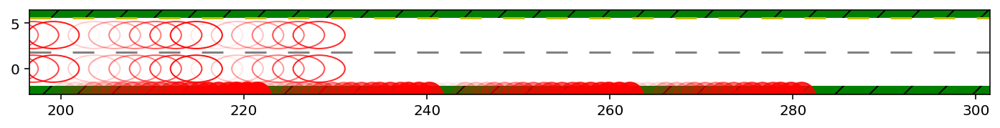

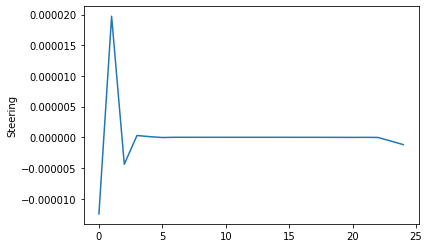

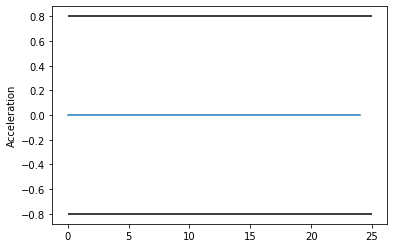

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.33ms ( 94.86us)   1.37ms ( 97.96us)        14
       nlp_g  |   2.43ms (173.50us)   2.42ms (173.09us)        14
    nlp_grad  | 498.00us (498.00us) 508.42us (508.42us)         1
  nlp_grad_f  |   1.58ms (105.07us)   1.59ms (106.11us)        15
  nlp_hess_l  |  26.77ms (  2.06ms)  27.12ms (  2.09ms)        13
   nlp_jac_g  |  15.06ms (  1.00ms)  15.16ms (  1.01ms)        15
       total  | 106.39ms (106.39ms) 108.11ms (108.11ms)         1
 i_mpc 3 n_round 1 i 01 Cost -15205.00 Slack 0.00 
 J_i -15204.996,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


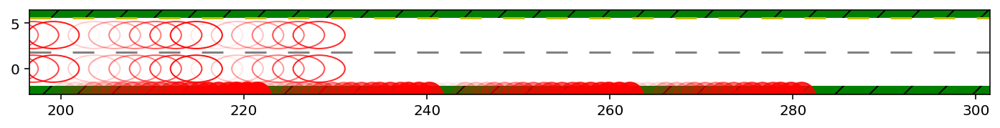

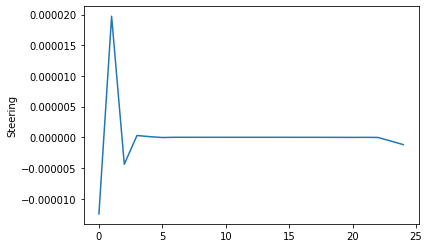

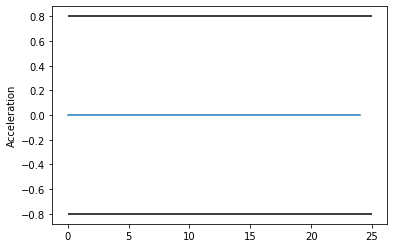

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.30ms (109.48us)   2.31ms (109.78us)        21
       nlp_g  |  11.09ms (528.19us)  11.11ms (529.16us)        21
    nlp_grad  |   1.49ms (  1.49ms)   1.49ms (  1.49ms)         1
  nlp_grad_f  |   2.41ms (109.50us)   2.54ms (115.43us)        22
  nlp_hess_l  |  81.29ms (  4.06ms)  82.51ms (  4.13ms)        20
   nlp_jac_g  |  44.92ms (  2.04ms)  45.54ms (  2.07ms)        22
       total  | 287.19ms (287.19ms) 291.58ms (291.58ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.62ms (109.38us)   2.81ms (117.04us)        24
       nlp_g  |  14.37ms (598.83us)  14.58ms (607.33us)        24
    nlp_grad  |   1.67ms (  1.67ms)   1.70ms (  1.70ms)         1
  nlp_grad_f  |   3.39ms (135.44us)   4.36ms (174.28us)        25
  nlp_hess_l  |  98.64ms (  4.29ms) 101.65ms (  4.42ms)        23
   nlp_jac_g  |  54.68ms (  2.19ms)  58.45ms (  2.34ms)     

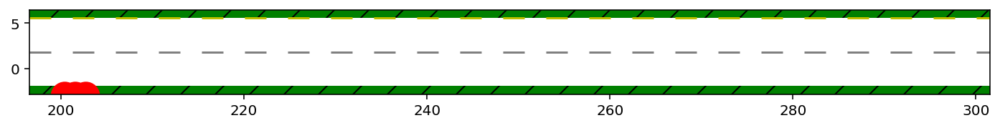

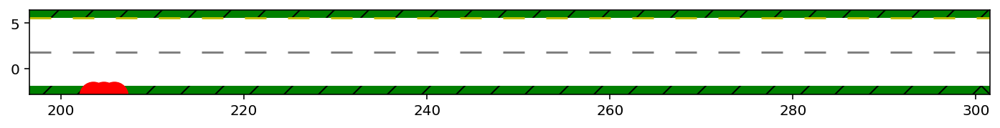

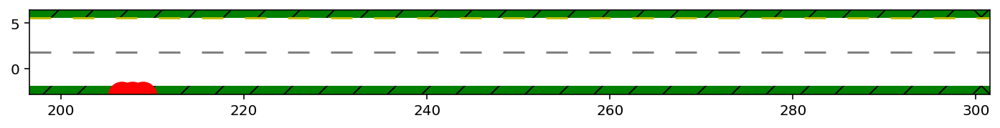

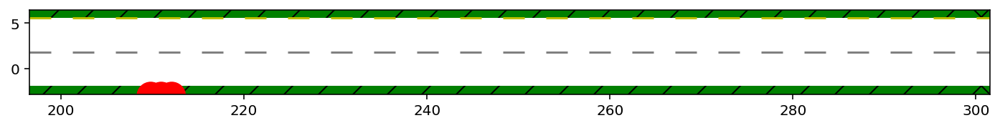

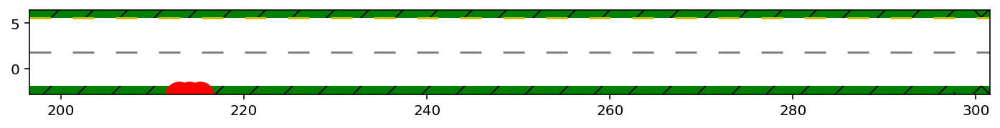

...

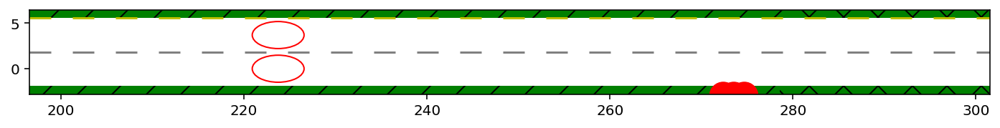

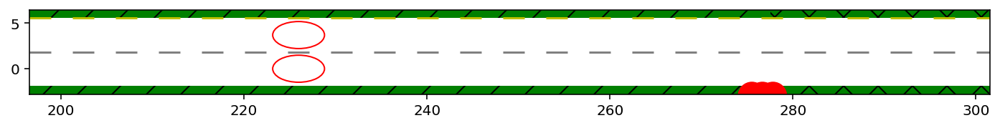

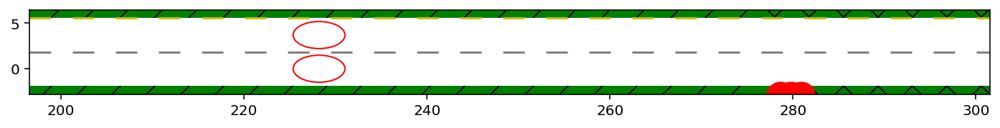

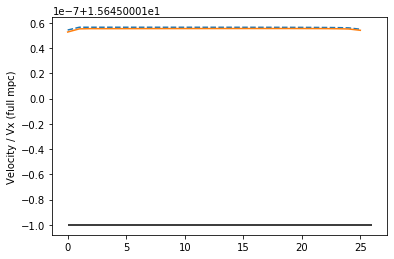

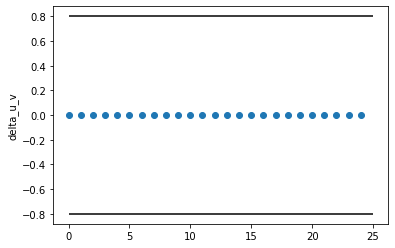

Initial conditions MPC_i: 4 IBR_i: 0 x: 279.8 y:-3.0
(array([[-4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05,
        -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05,
        -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05,
        -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05, -4.51e-05,
        -4.51e-05],
       [-4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15,
        -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15,
        -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15,
        -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15, -4.32e-15,
        -4.32e-15]]), array([ 2.28e+02,  8.67e-03, -9.68e-06,  2.27e-05,  1.12e+01,  2.19e+02]))
(array([[-1.37e-09, -1.37e-09, -1.37e-09, -1.37e-09, -1.37e-09, -1.37e-09,
        -1.37e-09, -1.37e-09, -1.37e-09, -1.37e-09, -1.37e-09, -1.37e-09,
        -1.37e-09, -1.37e-09, -1.37e-09, -1.37e-09, -1.37e-09, -1.37e-09,
        -1.37e

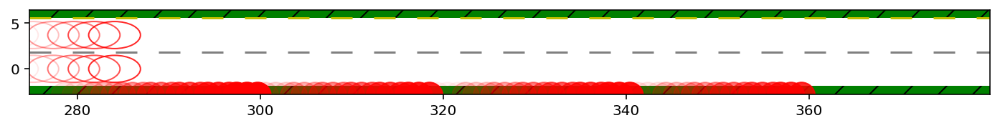

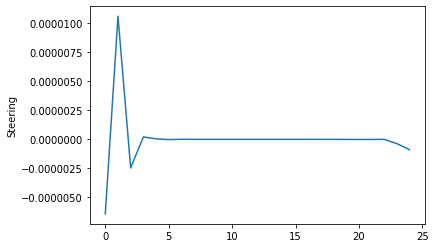

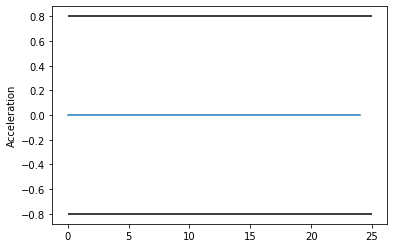

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.05ms (102.35us)   2.05ms (102.74us)        20
       nlp_g  |   3.61ms (180.35us)   3.63ms (181.39us)        20
    nlp_grad  | 912.00us (912.00us) 913.27us (913.27us)         1
  nlp_grad_f  |   2.62ms (124.81us)   2.63ms (125.47us)        21
  nlp_hess_l  |  43.46ms (  2.29ms)  44.16ms (  2.32ms)        19
   nlp_jac_g  |  23.84ms (  1.14ms)  25.92ms (  1.23ms)        21
       total  | 185.15ms (185.15ms) 198.03ms (198.03ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


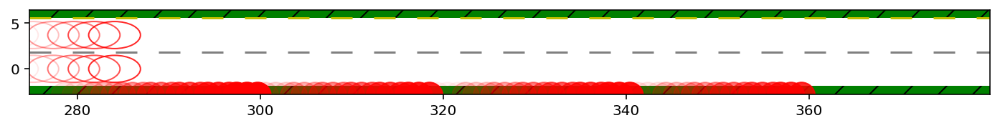

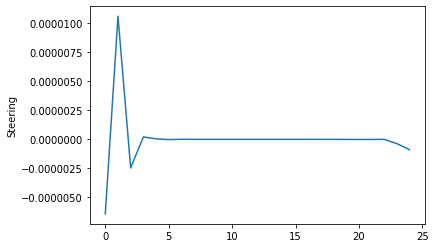

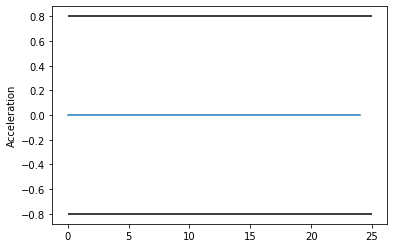

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.48ms ( 92.25us)   1.53ms ( 95.63us)        16
       nlp_g  |   2.64ms (164.75us)   2.71ms (169.50us)        16
    nlp_grad  | 736.00us (736.00us) 798.32us (798.32us)         1
  nlp_grad_f  |   1.87ms (109.88us)   1.88ms (110.43us)        17
  nlp_hess_l  |  30.54ms (  2.04ms)  30.82ms (  2.05ms)        15
   nlp_jac_g  |  16.89ms (993.76us)  17.51ms (  1.03ms)        17
       total  | 127.60ms (127.60ms) 130.33ms (130.33ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


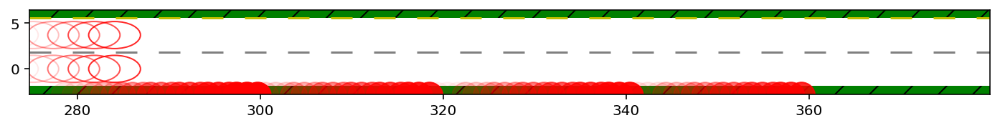

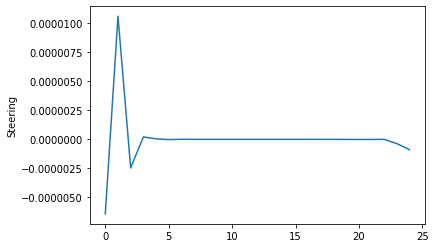

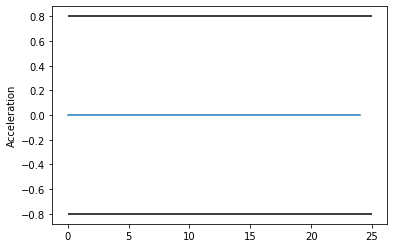

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.31ms ( 93.21us)   1.31ms ( 93.44us)        14
       nlp_g  |   2.19ms (156.50us)   2.19ms (156.53us)        14
    nlp_grad  | 721.00us (721.00us) 743.49us (743.49us)         1
  nlp_grad_f  |   1.47ms ( 97.80us)   1.47ms ( 98.15us)        15
  nlp_hess_l  |  25.88ms (  1.99ms)  26.15ms (  2.01ms)        13
   nlp_jac_g  |  14.74ms (982.60us)  14.88ms (992.26us)        15
       total  | 107.47ms (107.47ms) 108.49ms (108.49ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


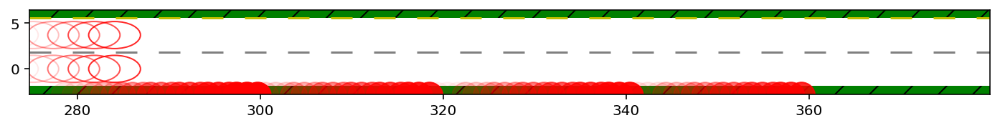

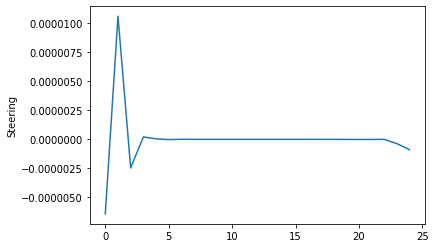

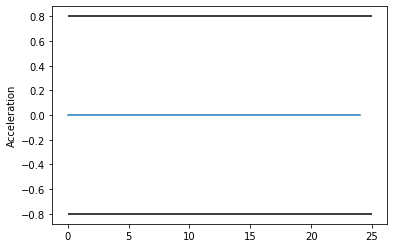

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.71ms (100.53us)   1.77ms (104.34us)        17
       nlp_g  |   3.08ms (181.35us)   3.13ms (184.36us)        17
    nlp_grad  | 733.00us (733.00us) 737.35us (737.35us)         1
  nlp_grad_f  |   2.02ms (112.00us)   2.02ms (112.49us)        18
  nlp_hess_l  |  35.98ms (  2.25ms)  36.80ms (  2.30ms)        16
   nlp_jac_g  |  19.21ms (  1.07ms)  20.03ms (  1.11ms)        18
       total  | 140.73ms (140.73ms) 144.61ms (144.61ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


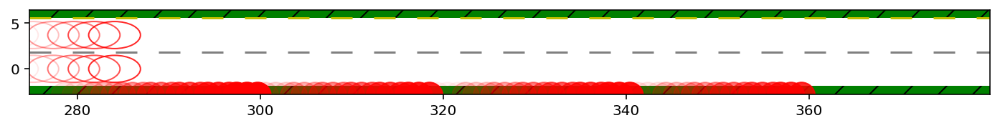

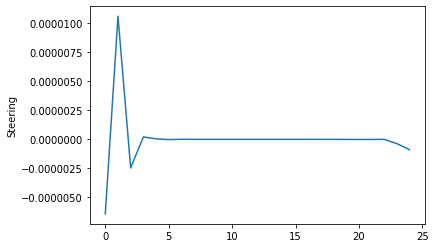

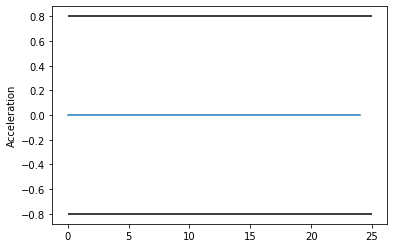

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.83ms ( 91.75us)   1.86ms ( 92.79us)        20
       nlp_g  |   3.64ms (181.90us)   4.21ms (210.42us)        20
    nlp_grad  | 533.00us (533.00us) 533.26us (533.26us)         1
  nlp_grad_f  |   2.38ms (113.14us)   2.52ms (120.08us)        21
  nlp_hess_l  |  38.98ms (  2.05ms)  41.20ms (  2.17ms)        19
   nlp_jac_g  |  20.19ms (961.52us)  20.49ms (975.53us)        21
       total  | 150.66ms (150.66ms) 158.99ms (158.99ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


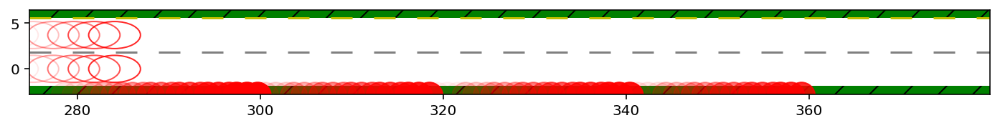

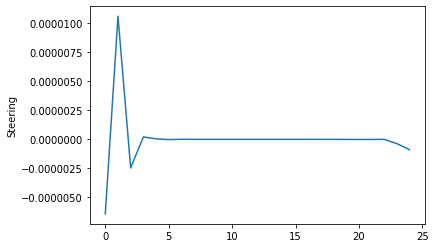

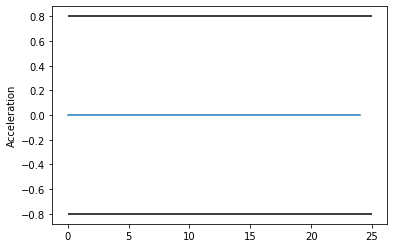

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.62ms (101.25us)   1.64ms (102.22us)        16
       nlp_g  |   2.42ms (151.06us)   2.42ms (151.15us)        16
    nlp_grad  | 461.00us (461.00us) 461.14us (461.14us)         1
  nlp_grad_f  |   1.86ms (109.41us)   1.89ms (110.89us)        17
  nlp_hess_l  |  31.22ms (  2.08ms)  31.74ms (  2.12ms)        15
   nlp_jac_g  |  16.25ms (955.65us)  16.59ms (975.72us)        17
       total  | 129.54ms (129.54ms) 131.81ms (131.81ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


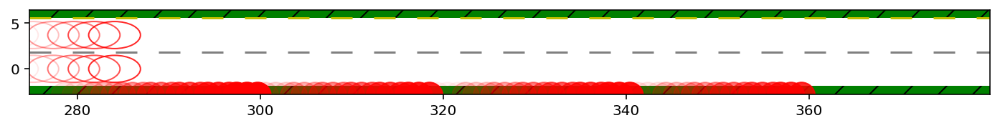

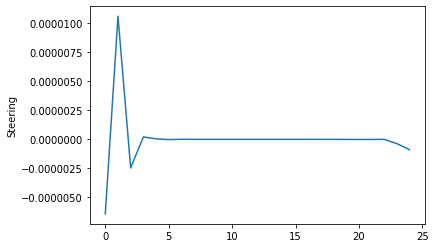

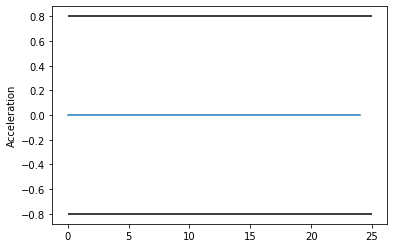

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.29ms ( 92.36us)   1.30ms ( 92.86us)        14
       nlp_g  |   2.42ms (172.86us)   2.51ms (179.23us)        14
    nlp_grad  | 432.00us (432.00us) 432.31us (432.31us)         1
  nlp_grad_f  |   1.95ms (130.07us)   1.96ms (130.68us)        15
  nlp_hess_l  |  27.81ms (  2.14ms)  29.09ms (  2.24ms)        13
   nlp_jac_g  |  14.73ms (982.13us)  15.51ms (  1.03ms)        15
       total  | 117.18ms (117.18ms) 128.45ms (128.45ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


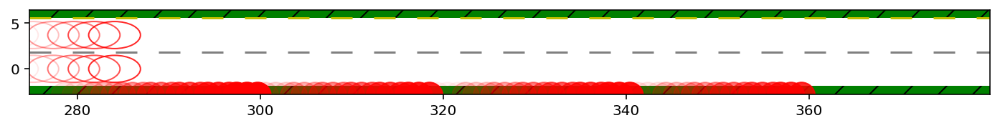

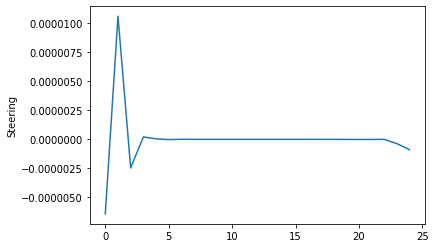

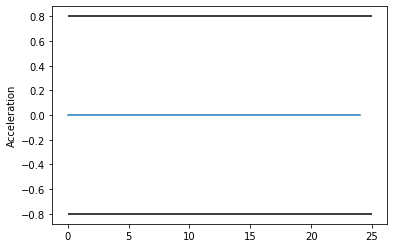

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.85ms (108.65us)   2.22ms (130.68us)        17
       nlp_g  |   3.16ms (185.65us)   3.89ms (228.67us)        17
    nlp_grad  | 573.00us (573.00us) 573.92us (573.92us)         1
  nlp_grad_f  |   2.32ms (128.94us)   2.35ms (130.56us)        18
  nlp_hess_l  |  36.88ms (  2.31ms)  42.16ms (  2.64ms)        16
   nlp_jac_g  |  19.57ms (  1.09ms)  21.84ms (  1.21ms)        18
       total  | 150.00ms (150.00ms) 176.07ms (176.07ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


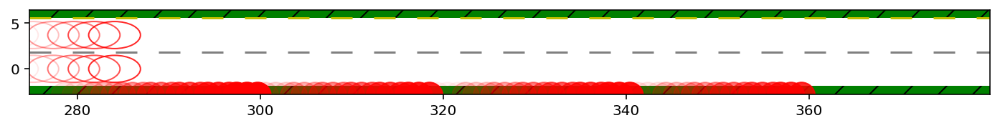

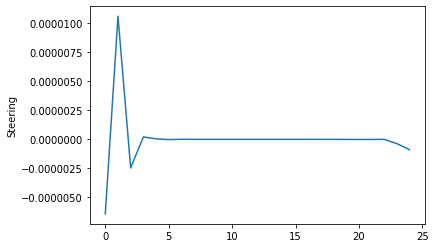

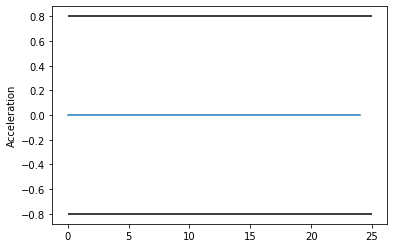

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.82ms ( 90.95us)   1.92ms ( 95.95us)        20
       nlp_g  |   3.50ms (174.85us)   3.77ms (188.37us)        20
    nlp_grad  | 848.00us (848.00us) 889.89us (889.89us)         1
  nlp_grad_f  |   2.19ms (104.29us)   2.21ms (105.33us)        21
  nlp_hess_l  |  39.39ms (  2.07ms)  40.58ms (  2.14ms)        19
   nlp_jac_g  |  21.48ms (  1.02ms)  22.19ms (  1.06ms)        21
       total  | 153.37ms (153.37ms) 156.65ms (156.65ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


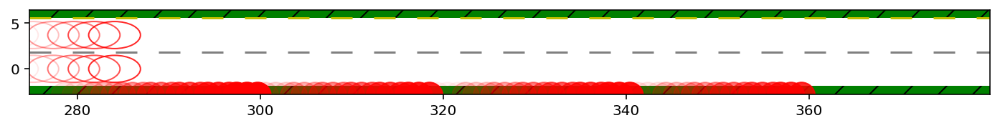

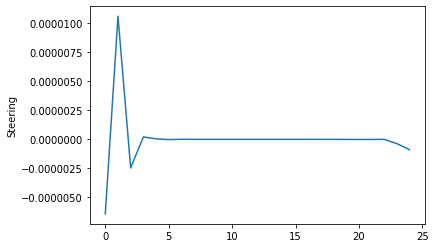

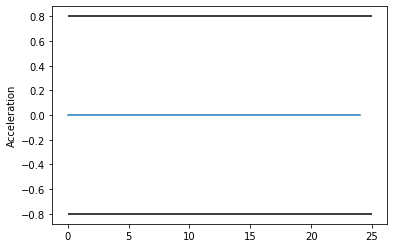

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.63ms (101.81us)   1.82ms (114.05us)        16
       nlp_g  |   3.04ms (189.87us)   3.03ms (189.59us)        16
    nlp_grad  | 484.00us (484.00us) 484.32us (484.32us)         1
  nlp_grad_f  |   2.11ms (124.00us)   2.12ms (124.95us)        17
  nlp_hess_l  |  38.00ms (  2.53ms)  40.05ms (  2.67ms)        15
   nlp_jac_g  |  20.04ms (  1.18ms)  27.25ms (  1.60ms)        17
       total  | 149.02ms (149.02ms) 204.68ms (204.68ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


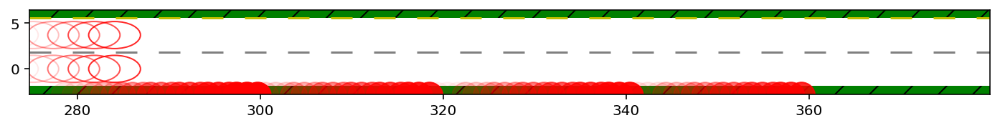

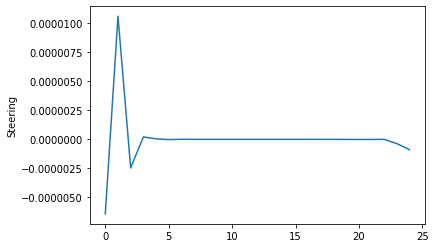

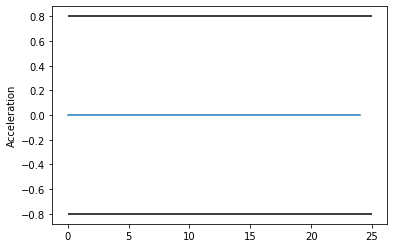

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.44ms (102.79us)   1.45ms (103.48us)        14
       nlp_g  |   2.35ms (168.14us)   2.34ms (167.35us)        14
    nlp_grad  | 582.00us (582.00us) 583.02us (583.02us)         1
  nlp_grad_f  |   2.03ms (135.20us)   2.02ms (134.69us)        15
  nlp_hess_l  |  28.41ms (  2.19ms)  30.63ms (  2.36ms)        13
   nlp_jac_g  |  15.27ms (  1.02ms)  16.89ms (  1.13ms)        15
       total  | 109.97ms (109.97ms) 115.19ms (115.19ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


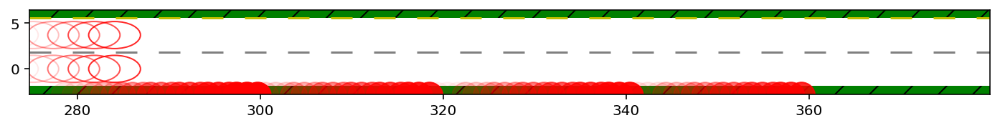

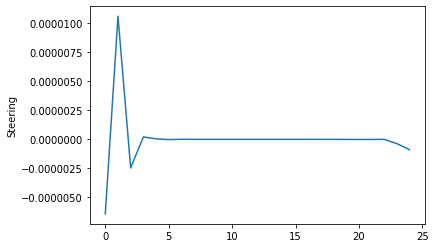

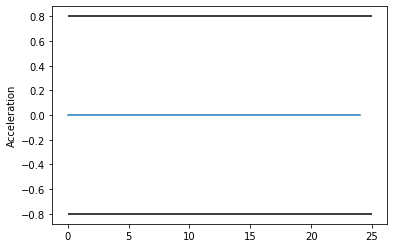

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.41ms (100.71us)   1.60ms (114.24us)        14
       nlp_g  |   2.39ms (170.43us)   2.43ms (173.70us)        14
    nlp_grad  | 554.00us (554.00us) 554.81us (554.81us)         1
  nlp_grad_f  |   1.95ms (129.80us)   2.18ms (145.62us)        15
  nlp_hess_l  |  30.87ms (  2.37ms)  32.72ms (  2.52ms)        13
   nlp_jac_g  |  15.98ms (  1.07ms)  16.69ms (  1.11ms)        15
       total  | 121.70ms (121.70ms) 126.52ms (126.52ms)         1
 i_mpc 4 n_round 0 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


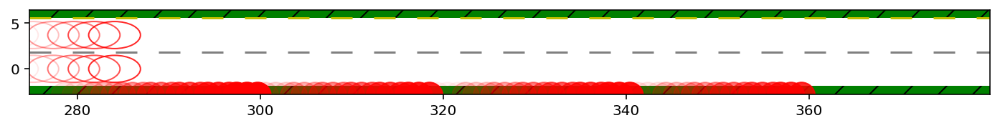

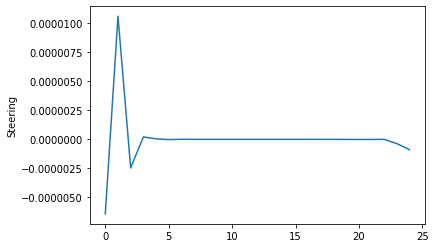

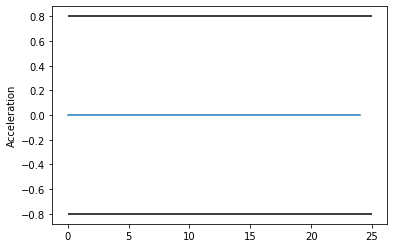

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.36ms (112.57us)   2.38ms (113.12us)        21
       nlp_g  |  12.92ms (615.14us)  13.18ms (627.78us)        21
    nlp_grad  |   1.68ms (  1.68ms)   1.68ms (  1.68ms)         1
  nlp_grad_f  |   2.69ms (122.41us)   2.96ms (134.40us)        22
  nlp_hess_l  |  87.26ms (  4.36ms)  90.62ms (  4.53ms)        20
   nlp_jac_g  |  48.76ms (  2.22ms)  50.21ms (  2.28ms)        22
       total  | 289.72ms (289.72ms) 298.08ms (298.08ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.29ms ( 91.44us)   2.32ms ( 92.65us)        25
       nlp_g  |  12.84ms (513.68us)  13.63ms (545.26us)        25
    nlp_grad  |   1.46ms (  1.46ms)   1.46ms (  1.46ms)         1
  nlp_grad_f  |   2.79ms (111.44us)   2.88ms (115.05us)        25
  nlp_hess_l  |  97.61ms (  4.24ms) 106.76ms (  4.64ms)        23
   nlp_jac_g  |  50.03ms (  2.00ms)  53.38ms (  2.14ms)     

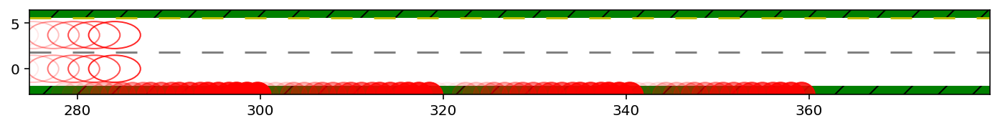

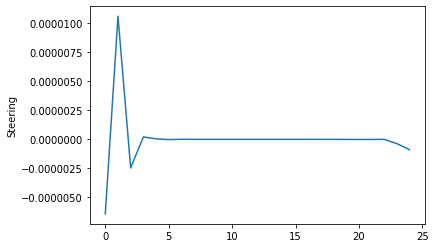

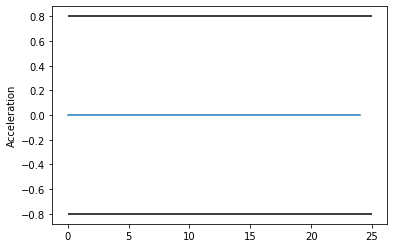

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.98ms ( 99.00us)   2.05ms (102.63us)        20
       nlp_g  |   3.02ms (150.75us)   3.02ms (151.02us)        20
    nlp_grad  | 560.00us (560.00us) 604.58us (604.58us)         1
  nlp_grad_f  |   2.53ms (120.48us)   2.55ms (121.46us)        21
  nlp_hess_l  |  40.14ms (  2.11ms)  41.20ms (  2.17ms)        19
   nlp_jac_g  |  21.41ms (  1.02ms)  21.88ms (  1.04ms)        21
       total  | 163.25ms (163.25ms) 167.06ms (167.06ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


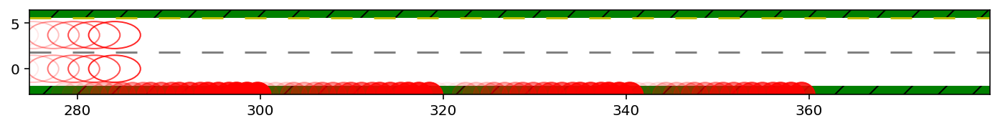

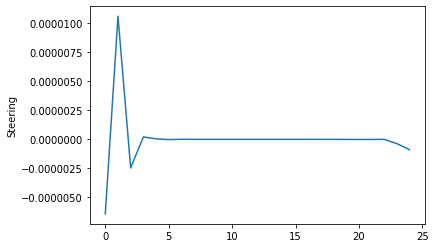

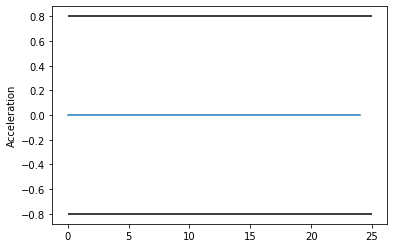

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.35ms ( 84.25us)   1.42ms ( 88.71us)        16
       nlp_g  |   2.42ms (151.44us)   2.42ms (151.38us)        16
    nlp_grad  | 408.00us (408.00us) 408.62us (408.62us)         1
  nlp_grad_f  |   1.81ms (106.41us)   4.50ms (264.78us)        17
  nlp_hess_l  |  31.16ms (  2.08ms)  34.13ms (  2.28ms)        15
   nlp_jac_g  |  16.13ms (948.94us)  16.71ms (983.23us)        17
       total  | 126.08ms (126.08ms) 135.55ms (135.55ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


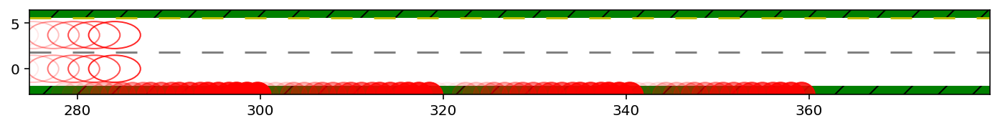

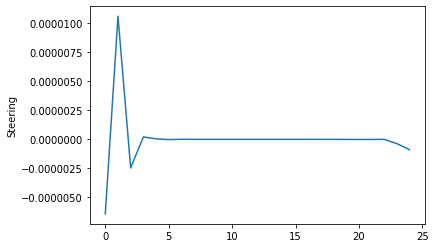

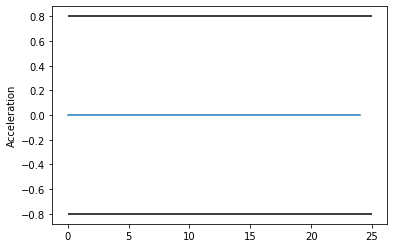

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.36ms ( 97.00us)   1.35ms ( 96.40us)        14
       nlp_g  |   2.33ms (166.36us)   2.81ms (200.92us)        14
    nlp_grad  | 517.00us (517.00us) 517.90us (517.90us)         1
  nlp_grad_f  |   1.74ms (116.27us)   1.80ms (120.08us)        15
  nlp_hess_l  |  26.69ms (  2.05ms)  27.41ms (  2.11ms)        13
   nlp_jac_g  |  15.51ms (  1.03ms)  16.38ms (  1.09ms)        15
       total  | 110.33ms (110.33ms) 115.79ms (115.79ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


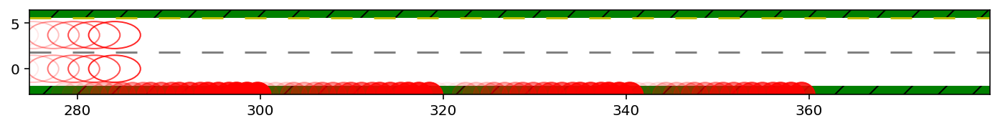

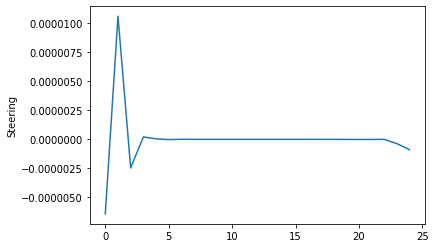

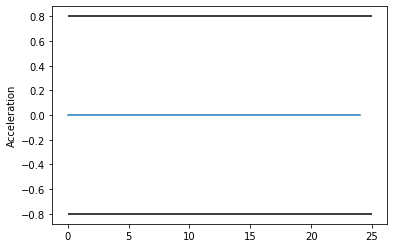

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.55ms ( 91.12us)   1.56ms ( 91.66us)        17
       nlp_g  |   2.57ms (151.29us)   2.57ms (151.42us)        17
    nlp_grad  | 479.00us (479.00us) 464.53us (464.53us)         1
  nlp_grad_f  |   1.79ms ( 99.17us)   1.83ms (101.45us)        18
  nlp_hess_l  |  32.85ms (  2.05ms)  33.28ms (  2.08ms)        16
   nlp_jac_g  |  18.70ms (  1.04ms)  19.01ms (  1.06ms)        18
       total  | 128.63ms (128.63ms) 129.88ms (129.88ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


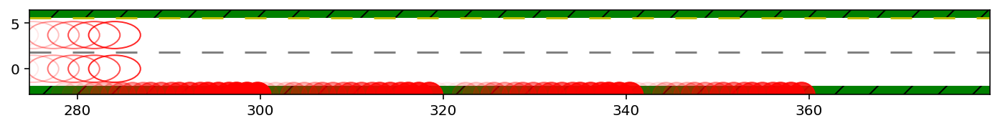

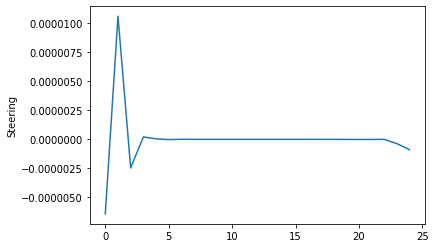

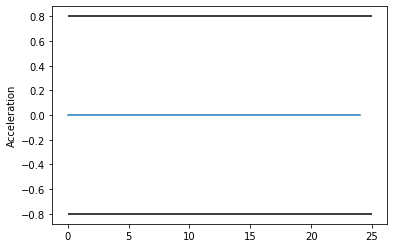

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.00ms (100.15us)   2.02ms (101.21us)        20
       nlp_g  |   3.47ms (173.25us)   3.80ms (189.85us)        20
    nlp_grad  | 504.00us (504.00us) 503.82us (503.82us)         1
  nlp_grad_f  |   2.76ms (131.29us)   2.77ms (131.76us)        21
  nlp_hess_l  |  40.72ms (  2.14ms)  40.91ms (  2.15ms)        19
   nlp_jac_g  |  21.12ms (  1.01ms)  21.70ms (  1.03ms)        21
       total  | 160.50ms (160.50ms) 162.95ms (162.95ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


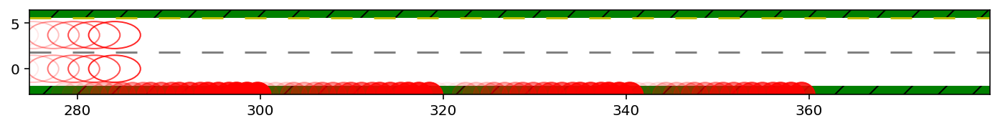

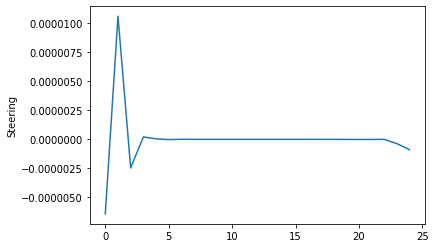

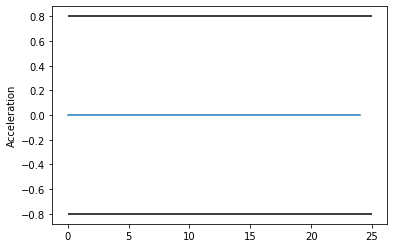

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.50ms ( 93.50us)   1.52ms ( 94.79us)        16
       nlp_g  |   2.68ms (167.81us)   2.69ms (168.30us)        16
    nlp_grad  | 532.00us (532.00us) 532.67us (532.67us)         1
  nlp_grad_f  |   1.91ms (112.53us)   1.91ms (112.09us)        17
  nlp_hess_l  |  30.84ms (  2.06ms)  31.36ms (  2.09ms)        15
   nlp_jac_g  |  16.74ms (984.59us)  16.89ms (993.66us)        17
       total  | 130.10ms (130.10ms) 131.95ms (131.95ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


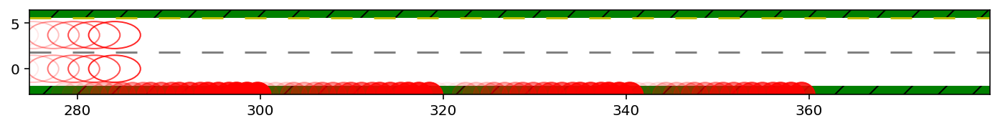

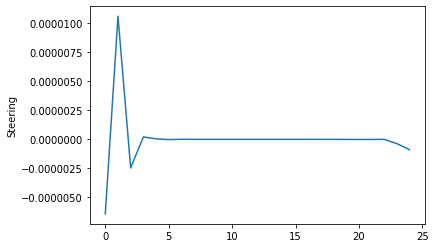

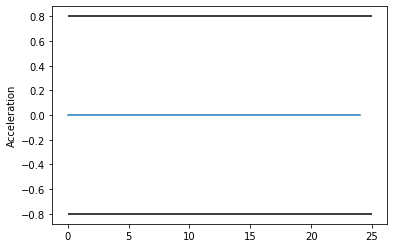

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.35ms ( 96.57us)   1.36ms ( 97.17us)        14
       nlp_g  |   2.33ms (166.71us)   2.34ms (166.92us)        14
    nlp_grad  | 522.00us (522.00us) 522.51us (522.51us)         1
  nlp_grad_f  |   1.74ms (116.13us)   1.78ms (118.89us)        15
  nlp_hess_l  |  27.30ms (  2.10ms)  27.67ms (  2.13ms)        13
   nlp_jac_g  |  15.52ms (  1.03ms)  15.66ms (  1.04ms)        15
       total  | 117.60ms (117.60ms) 120.22ms (120.22ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


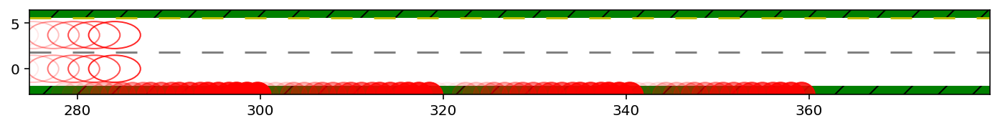

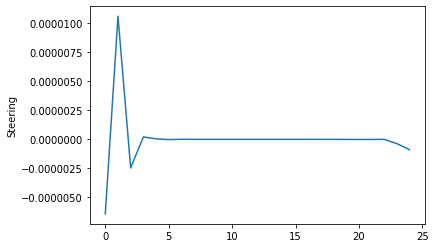

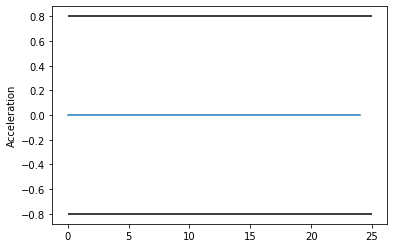

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.78ms (104.94us)   1.79ms (105.53us)        17
       nlp_g  |   2.80ms (164.65us)   3.39ms (199.18us)        17
    nlp_grad  | 642.00us (642.00us) 870.95us (870.95us)         1
  nlp_grad_f  |   2.14ms (119.00us)   2.17ms (120.40us)        18
  nlp_hess_l  |  34.58ms (  2.16ms)  37.69ms (  2.36ms)        16
   nlp_jac_g  |  19.00ms (  1.06ms)  21.85ms (  1.21ms)        18
       total  | 143.41ms (143.41ms) 166.23ms (166.23ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


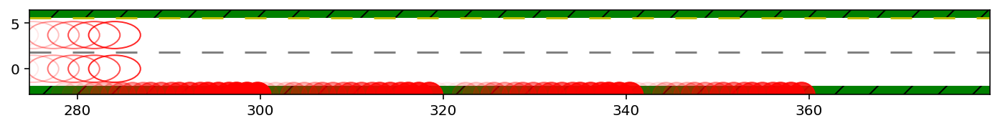

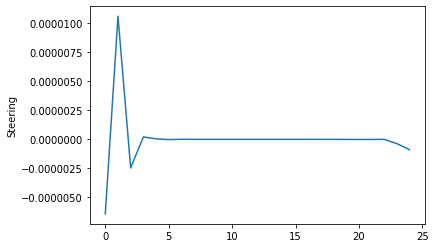

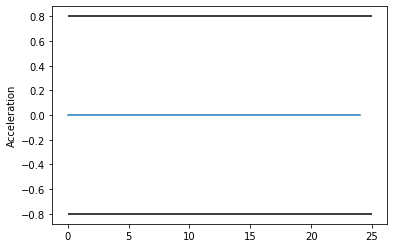

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.08ms (104.15us)   2.84ms (141.83us)        20
       nlp_g  |   4.26ms (212.85us)   4.73ms (236.29us)        20
    nlp_grad  | 464.00us (464.00us) 464.63us (464.63us)         1
  nlp_grad_f  |   2.95ms (140.29us)   4.00ms (190.31us)        21
  nlp_hess_l  |  43.59ms (  2.29ms)  46.05ms (  2.42ms)        19
   nlp_jac_g  |  24.08ms (  1.15ms)  25.76ms (  1.23ms)        21
       total  | 173.09ms (173.09ms) 196.61ms (196.61ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


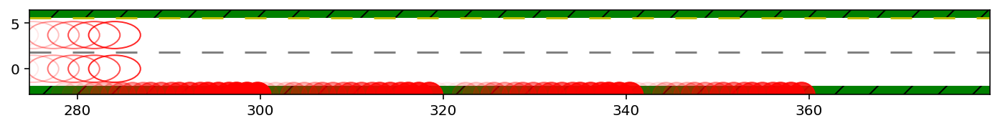

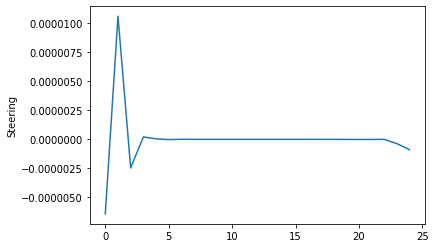

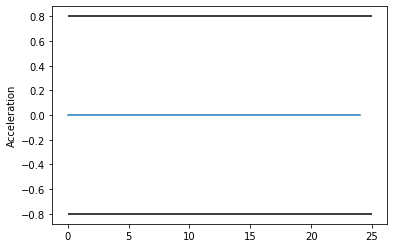

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.57ms ( 98.25us)   1.59ms ( 99.46us)        16
       nlp_g  |   2.60ms (162.62us)   2.62ms (163.48us)        16
    nlp_grad  | 536.00us (536.00us) 535.62us (535.62us)         1
  nlp_grad_f  |   1.86ms (109.59us)   1.87ms (110.22us)        17
  nlp_hess_l  |  33.21ms (  2.21ms)  34.05ms (  2.27ms)        15
   nlp_jac_g  |  16.83ms (990.18us)  17.06ms (  1.00ms)        17
       total  | 129.26ms (129.26ms) 133.57ms (133.57ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


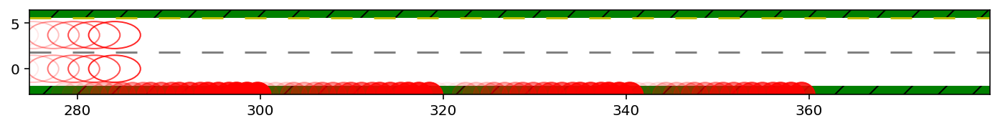

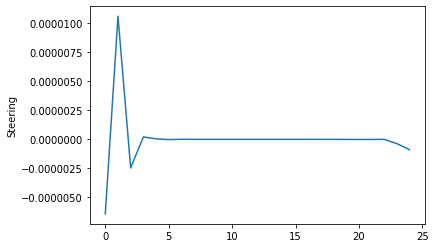

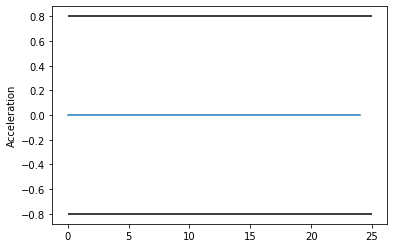

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.34ms ( 96.07us)   1.35ms ( 96.39us)        14
       nlp_g  |   2.36ms (168.64us)   2.38ms (170.34us)        14
    nlp_grad  | 435.00us (435.00us) 434.59us (434.59us)         1
  nlp_grad_f  |   1.43ms ( 95.27us)   1.44ms ( 96.06us)        15
  nlp_hess_l  |  26.10ms (  2.01ms)  26.64ms (  2.05ms)        13
   nlp_jac_g  |  15.62ms (  1.04ms)  15.99ms (  1.07ms)        15
       total  | 105.91ms (105.91ms) 108.07ms (108.07ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


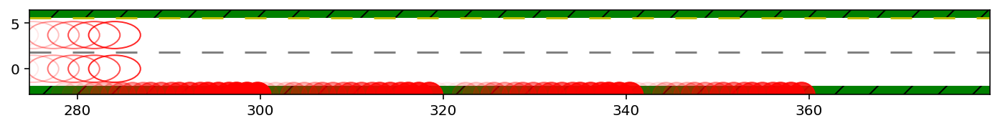

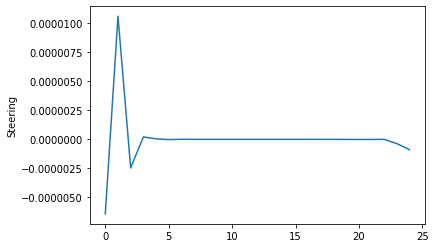

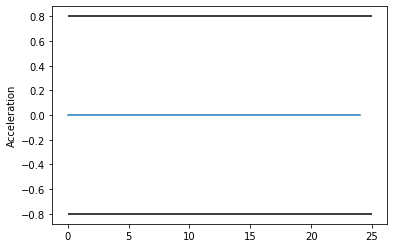

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.32ms ( 94.21us)   1.32ms ( 94.29us)        14
       nlp_g  |   2.30ms (164.64us)   2.35ms (167.89us)        14
    nlp_grad  | 478.00us (478.00us) 477.98us (477.98us)         1
  nlp_grad_f  |   1.65ms (110.13us)   1.67ms (111.63us)        15
  nlp_hess_l  |  26.09ms (  2.01ms)  27.48ms (  2.11ms)        13
   nlp_jac_g  |  14.48ms (965.27us)  14.72ms (981.28us)        15
       total  | 111.23ms (111.23ms) 118.42ms (118.42ms)         1
 i_mpc 4 n_round 1 i 01 Cost -26586.38 Slack 0.00 
 J_i -26586.384,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


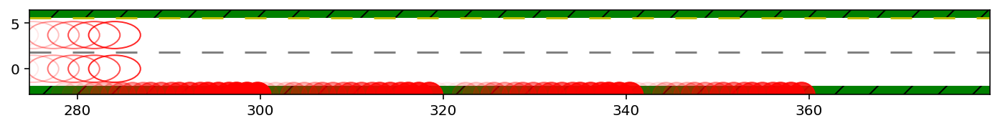

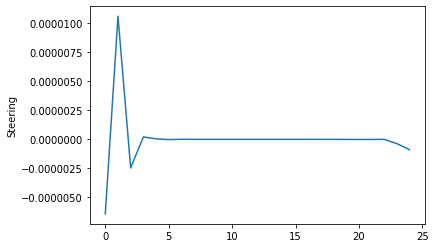

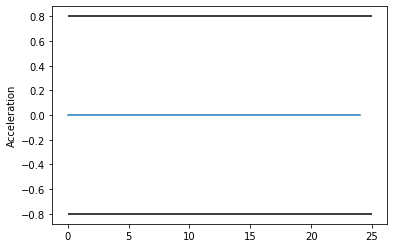

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.29ms (114.55us)   2.30ms (114.98us)        20
       nlp_g  |  11.91ms (595.30us)  12.45ms (622.54us)        20
    nlp_grad  |   1.52ms (  1.52ms)   1.52ms (  1.52ms)         1
  nlp_grad_f  |   3.05ms (145.19us)   3.08ms (146.52us)        21
  nlp_hess_l  |  79.29ms (  4.17ms)  80.52ms (  4.24ms)        19
   nlp_jac_g  |  44.13ms (  2.10ms)  45.55ms (  2.17ms)        21
       total  | 266.02ms (266.02ms) 270.18ms (270.18ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.85ms (114.00us)   2.86ms (114.33us)        25
       nlp_g  |  13.37ms (534.72us)  13.44ms (537.67us)        25
    nlp_grad  |   1.94ms (  1.94ms)   1.95ms (  1.95ms)         1
  nlp_grad_f  |   3.17ms (126.64us)   3.45ms (137.91us)        25
  nlp_hess_l  |  96.94ms (  4.21ms)  99.04ms (  4.31ms)        23
   nlp_jac_g  |  50.65ms (  2.03ms)  51.63ms (  2.07ms)     

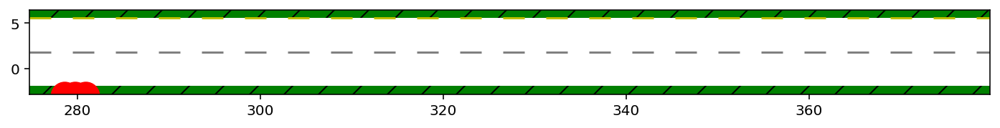

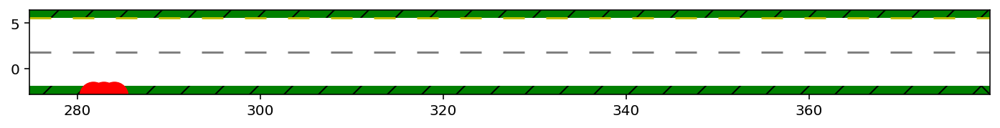

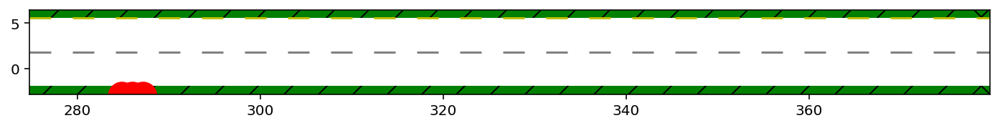

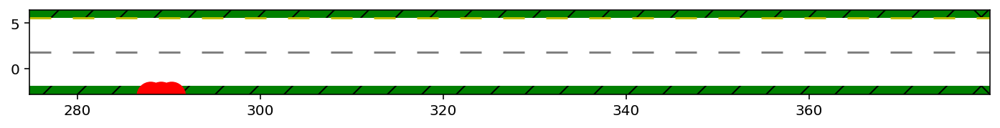

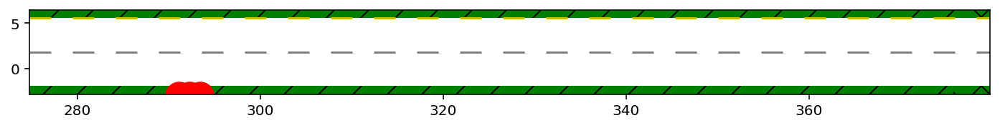

...

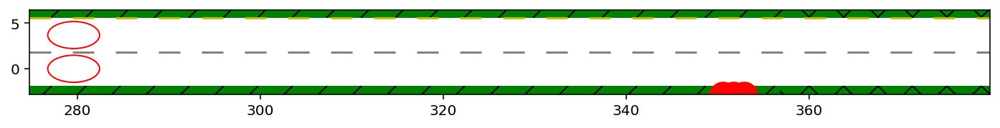

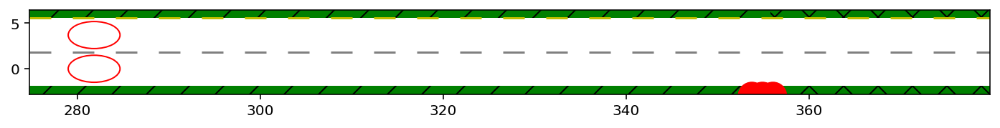

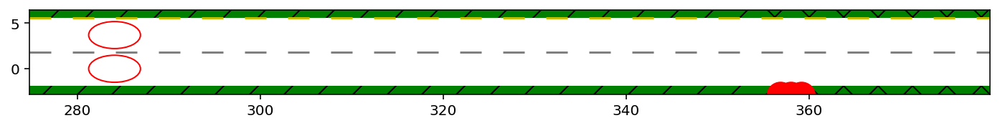

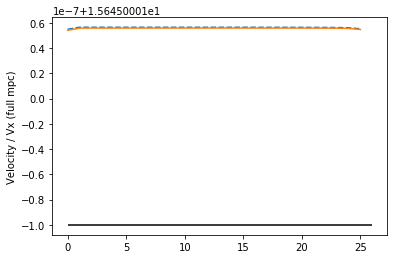

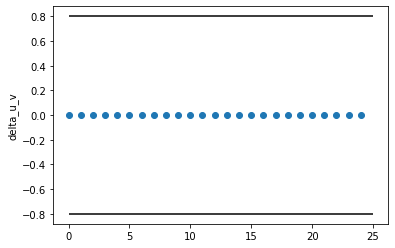

Initial conditions MPC_i: 5 IBR_i: 0 x: 358.0 y:-3.0
(array([[-1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05,
        -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05,
        -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05,
        -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05, -1.85e-05,
        -1.85e-05],
       [ 1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,
         1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,
         1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,
         1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,  1.65e-15,
         1.65e-15]]), array([ 2.84e+02,  3.55e-03, -3.97e-06,  9.32e-06,  1.12e+01,  2.74e+02]))
(array([[1.01e-08, 1.01e-08, 1.01e-08, 1.01e-08, 1.01e-08, 1.01e-08,
        1.01e-08, 1.01e-08, 1.01e-08, 1.01e-08, 1.01e-08, 1.01e-08,
        1.01e-08, 1.01e-08, 1.01e-08, 1.01e-08, 1.01e-08, 1.01e-08,
        1.01e-08, 1.01e-08, 1.01

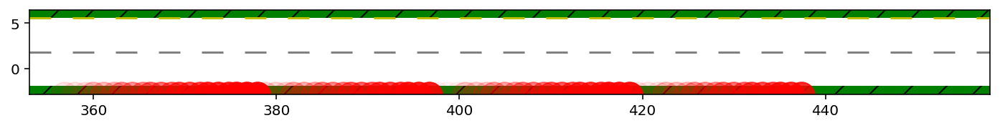

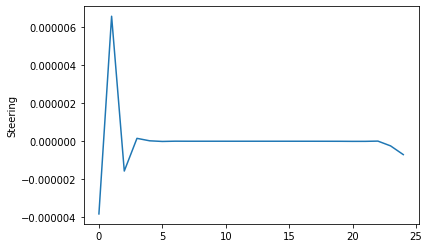

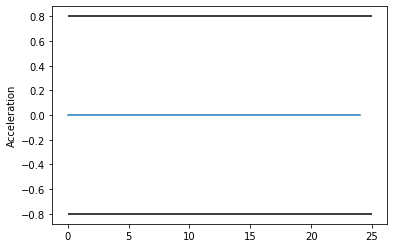

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.13ms ( 97.00us)   2.16ms ( 98.36us)        22
       nlp_g  |   3.93ms (178.50us)   5.91ms (268.57us)        22
    nlp_grad  | 437.00us (437.00us) 436.88us (436.88us)         1
  nlp_grad_f  |   2.68ms (116.52us)   2.69ms (116.98us)        23
  nlp_hess_l  |  44.04ms (  2.10ms)  48.91ms (  2.33ms)        21
   nlp_jac_g  |  22.77ms (990.17us)  23.93ms (  1.04ms)        23
       total  | 179.48ms (179.48ms) 194.02ms (194.02ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


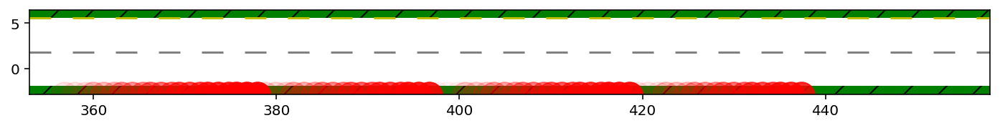

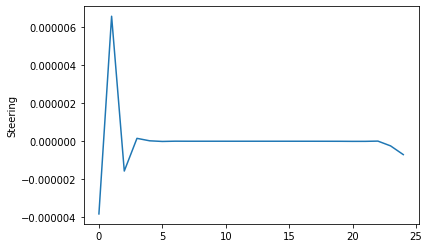

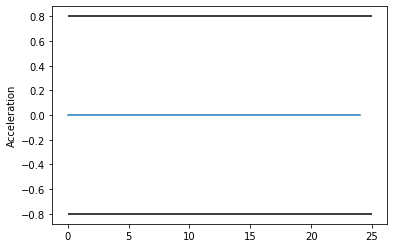

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.36ms ( 84.88us)   1.37ms ( 85.42us)        16
       nlp_g  |   2.54ms (158.50us)   2.55ms (159.68us)        16
    nlp_grad  | 452.00us (452.00us) 452.11us (452.11us)         1
  nlp_grad_f  |   1.76ms (103.65us)   1.78ms (104.78us)        17
  nlp_hess_l  |  30.52ms (  2.03ms)  33.11ms (  2.21ms)        15
   nlp_jac_g  |  16.12ms (948.47us)  16.58ms (975.49us)        17
       total  | 128.65ms (128.65ms) 135.68ms (135.68ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


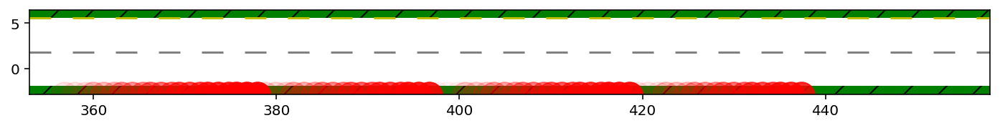

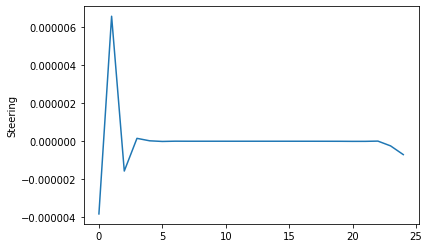

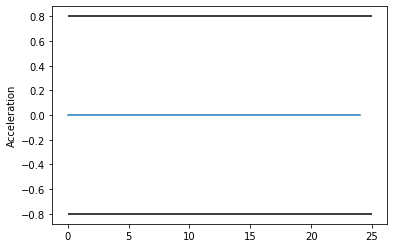

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.11ms ( 79.36us)   1.12ms ( 79.73us)        14
       nlp_g  |   2.39ms (170.57us)   2.52ms (180.17us)        14
    nlp_grad  | 839.00us (839.00us) 881.97us (881.97us)         1
  nlp_grad_f  |   1.45ms ( 96.73us)   1.47ms ( 98.16us)        15
  nlp_hess_l  |  26.31ms (  2.02ms)  27.15ms (  2.09ms)        13
   nlp_jac_g  |  14.80ms (986.87us)  14.87ms (991.07us)        15
       total  | 112.79ms (112.79ms) 118.28ms (118.28ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


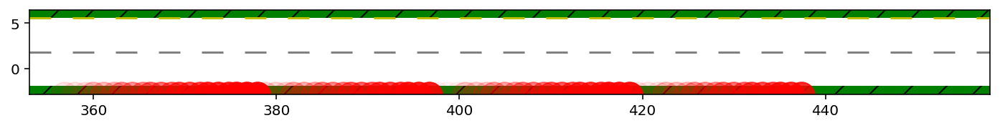

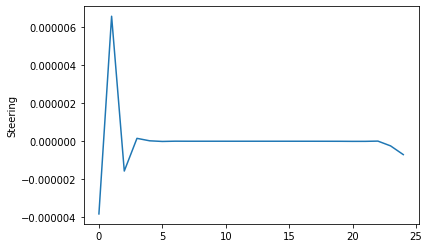

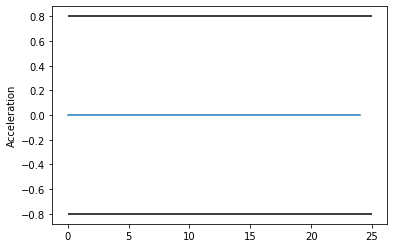

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.49ms ( 83.00us)   1.51ms ( 83.63us)        18
       nlp_g  |   2.66ms (147.56us)   2.69ms (149.26us)        18
    nlp_grad  | 434.00us (434.00us) 433.30us (433.30us)         1
  nlp_grad_f  |   2.36ms (124.26us)   2.44ms (128.41us)        19
  nlp_hess_l  |  34.57ms (  2.03ms)  35.99ms (  2.12ms)        17
   nlp_jac_g  |  18.02ms (948.68us)  19.15ms (  1.01ms)        19
       total  | 139.09ms (139.09ms) 146.93ms (146.93ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


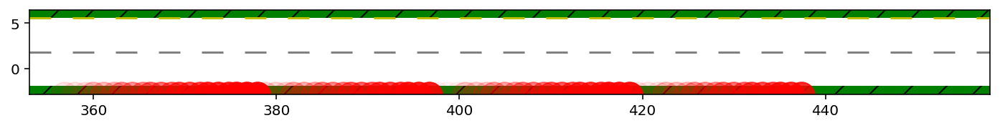

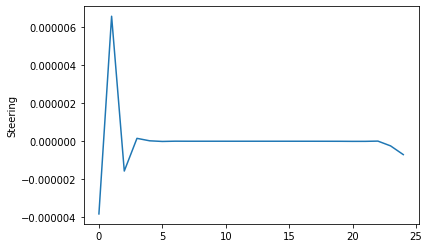

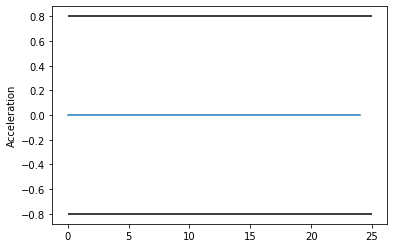

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.12ms ( 96.18us)   2.13ms ( 96.94us)        22
       nlp_g  |   3.67ms (166.64us)   3.67ms (166.60us)        22
    nlp_grad  | 709.00us (709.00us) 754.05us (754.05us)         1
  nlp_grad_f  |   2.70ms (117.57us)   2.87ms (124.90us)        23
  nlp_hess_l  |  43.45ms (  2.07ms)  43.91ms (  2.09ms)        21
   nlp_jac_g  |  23.66ms (  1.03ms)  24.58ms (  1.07ms)        23
       total  | 179.47ms (179.47ms) 183.90ms (183.90ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


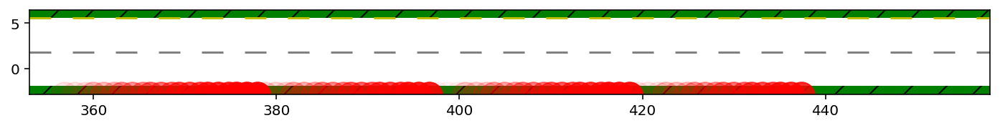

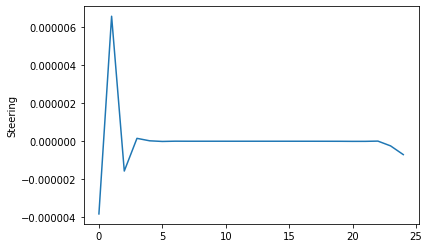

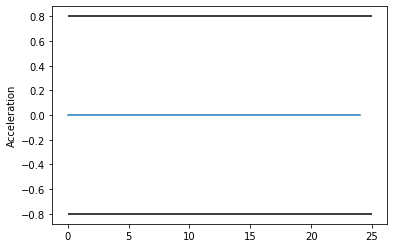

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.04ms (127.31us)   2.12ms (132.66us)        16
       nlp_g  |   3.61ms (225.88us)   3.63ms (226.75us)        16
    nlp_grad  | 612.00us (612.00us) 613.45us (613.45us)         1
  nlp_grad_f  |   2.62ms (154.29us)   2.67ms (157.32us)        17
  nlp_hess_l  |  41.76ms (  2.78ms)  44.61ms (  2.97ms)        15
   nlp_jac_g  |  24.07ms (  1.42ms)  26.50ms (  1.56ms)        17
       total  | 175.94ms (175.94ms) 187.31ms (187.31ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


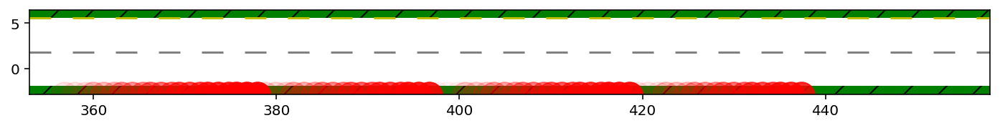

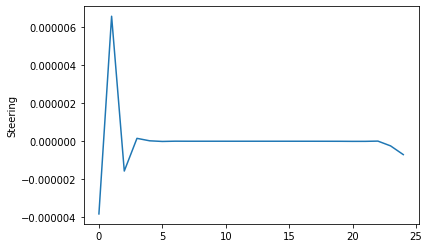

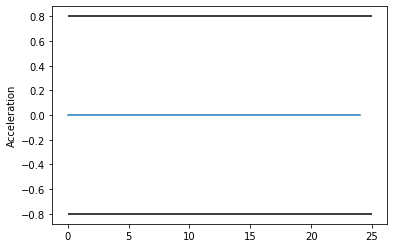

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.19ms ( 85.00us)   1.20ms ( 85.66us)        14
       nlp_g  |   2.13ms (152.14us)   2.22ms (158.64us)        14
    nlp_grad  | 428.00us (428.00us) 428.31us (428.31us)         1
  nlp_grad_f  |   1.54ms (102.47us)   1.71ms (114.03us)        15
  nlp_hess_l  |  29.37ms (  2.26ms)  33.10ms (  2.55ms)        13
   nlp_jac_g  |  14.87ms (991.33us)  15.10ms (  1.01ms)        15
       total  | 113.28ms (113.28ms) 124.92ms (124.92ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


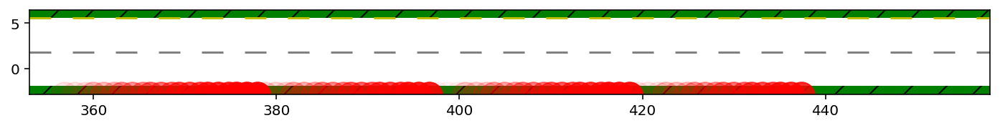

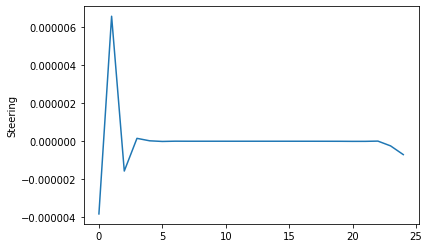

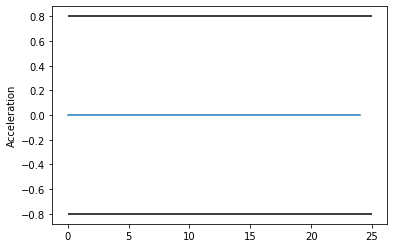

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.60ms ( 88.78us)   1.62ms ( 89.86us)        18
       nlp_g  |   3.02ms (167.89us)   3.05ms (169.66us)        18
    nlp_grad  | 490.00us (490.00us) 490.36us (490.36us)         1
  nlp_grad_f  |   2.12ms (111.68us)   2.15ms (113.14us)        19
  nlp_hess_l  |  34.90ms (  2.05ms)  35.79ms (  2.11ms)        17
   nlp_jac_g  |  18.83ms (991.11us)  19.09ms (  1.00ms)        19
       total  | 156.65ms (156.65ms) 159.35ms (159.35ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


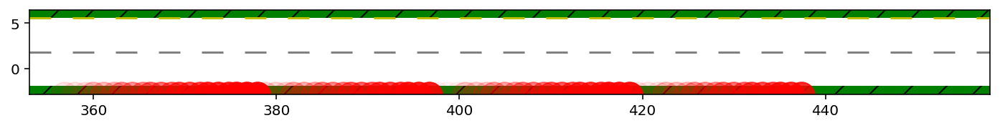

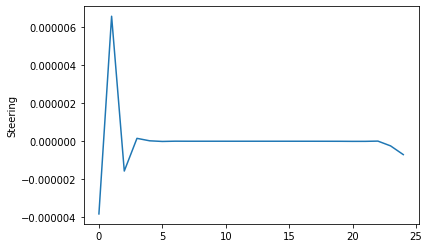

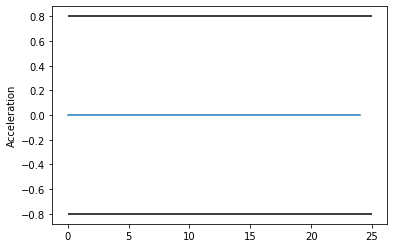

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.82ms ( 95.79us)   1.82ms ( 96.00us)        19
       nlp_g  |   3.25ms (171.05us)   3.26ms (171.38us)        19
    nlp_grad  | 477.00us (477.00us) 478.12us (478.12us)         1
  nlp_grad_f  |   2.22ms (110.80us)   2.23ms (111.45us)        20
  nlp_hess_l  |  37.50ms (  2.08ms)  38.71ms (  2.15ms)        18
   nlp_jac_g  |  20.85ms (  1.04ms)  21.62ms (  1.08ms)        20
       total  | 144.91ms (144.91ms) 146.90ms (146.90ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


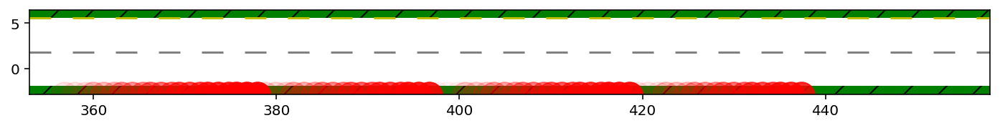

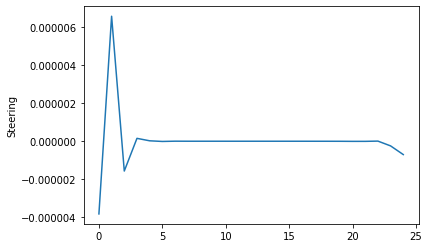

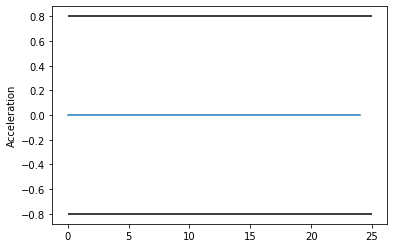

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.23ms ( 82.07us)   1.24ms ( 82.40us)        15
       nlp_g  |   2.36ms (157.27us)   2.36ms (157.10us)        15
    nlp_grad  | 493.00us (493.00us) 492.92us (492.92us)         1
  nlp_grad_f  |   1.97ms (123.19us)   1.98ms (123.53us)        16
  nlp_hess_l  |  29.56ms (  2.11ms)  29.75ms (  2.12ms)        14
   nlp_jac_g  |  16.41ms (  1.03ms)  16.83ms (  1.05ms)        16
       total  | 117.47ms (117.47ms) 119.02ms (119.02ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


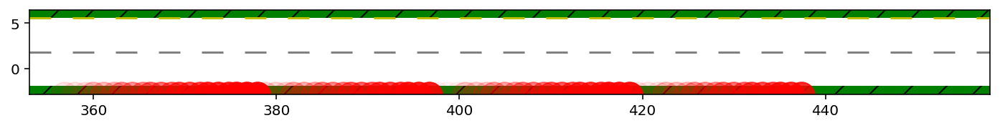

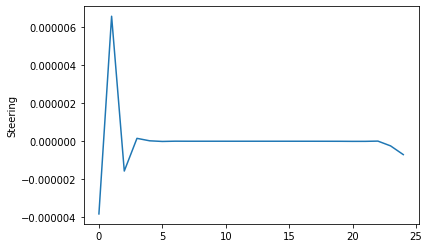

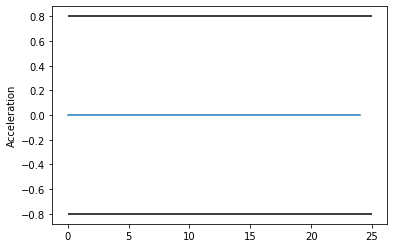

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.59ms (113.36us)   1.60ms (114.48us)        14
       nlp_g  |   2.57ms (183.57us)   2.82ms (201.32us)        14
    nlp_grad  | 530.00us (530.00us) 530.57us (530.57us)         1
  nlp_grad_f  |   2.00ms (133.53us)   2.01ms (134.15us)        15
  nlp_hess_l  |  28.47ms (  2.19ms)  29.22ms (  2.25ms)        13
   nlp_jac_g  |  15.31ms (  1.02ms)  15.38ms (  1.03ms)        15
       total  | 112.69ms (112.69ms) 115.73ms (115.73ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


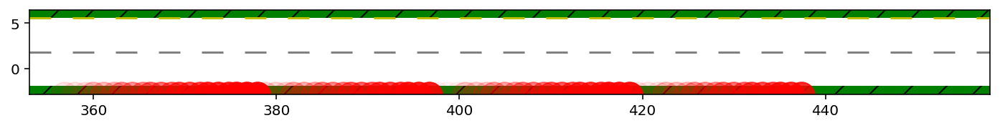

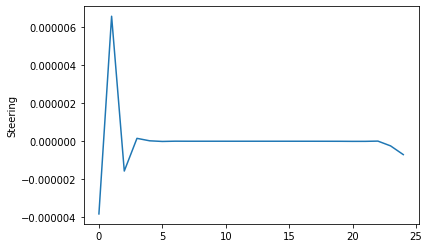

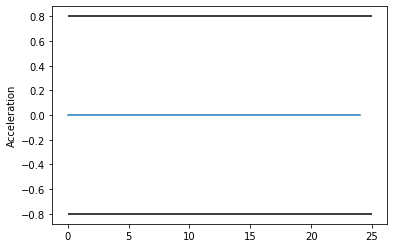

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.32ms ( 94.36us)   1.33ms ( 94.71us)        14
       nlp_g  |   2.48ms (176.93us)   2.46ms (175.86us)        14
    nlp_grad  | 688.00us (688.00us) 695.12us (695.12us)         1
  nlp_grad_f  |   1.68ms (111.93us)   1.67ms (111.47us)        15
  nlp_hess_l  |  28.65ms (  2.20ms)  28.93ms (  2.23ms)        13
   nlp_jac_g  |  15.26ms (  1.02ms)  15.36ms (  1.02ms)        15
       total  | 120.03ms (120.03ms) 121.63ms (121.63ms)         1
 i_mpc 5 n_round 0 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


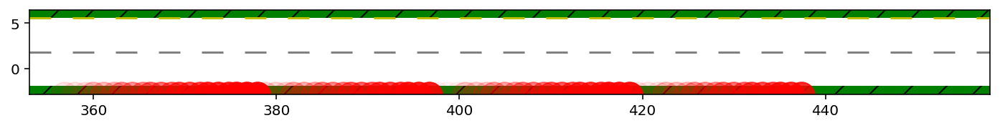

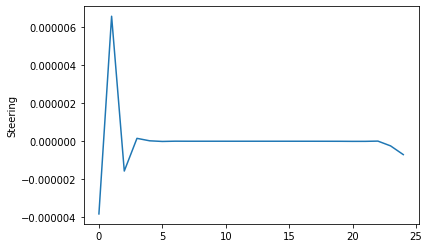

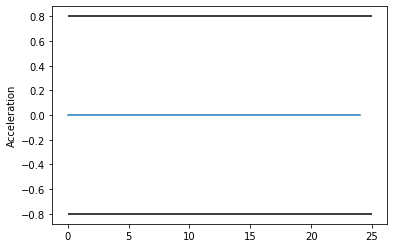

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.48ms (117.90us)   2.50ms (119.04us)        21
       nlp_g  |  13.74ms (654.38us)  14.34ms (682.74us)        21
    nlp_grad  |   1.47ms (  1.47ms)   1.47ms (  1.47ms)         1
  nlp_grad_f  |   2.99ms (135.95us)   3.46ms (157.21us)        22
  nlp_hess_l  |  86.92ms (  4.35ms)  91.74ms (  4.59ms)        20
   nlp_jac_g  |  48.44ms (  2.20ms)  49.53ms (  2.25ms)        22
       total  | 297.08ms (297.08ms) 308.55ms (308.55ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.42ms ( 96.96us)   2.91ms (116.41us)        25
       nlp_g  |  11.76ms (470.40us)  12.17ms (486.99us)        25
    nlp_grad  |   1.63ms (  1.63ms)   1.64ms (  1.64ms)         1
  nlp_grad_f  |   2.44ms ( 97.76us)   2.45ms ( 98.01us)        25
  nlp_hess_l  |  92.44ms (  4.02ms) 103.45ms (  4.50ms)        23
   nlp_jac_g  |  49.29ms (  1.97ms)  59.03ms (  2.36ms)     

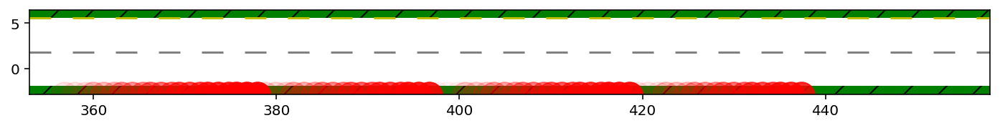

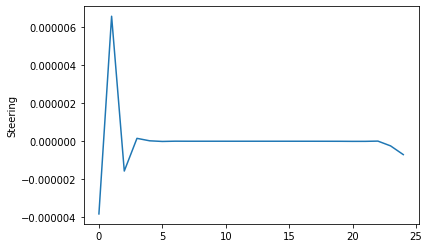

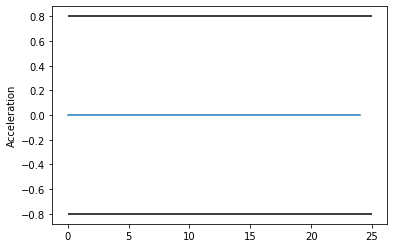

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.54ms (115.23us)   4.09ms (185.84us)        22
       nlp_g  |   4.48ms (203.50us)   4.51ms (204.87us)        22
    nlp_grad  | 568.00us (568.00us) 569.08us (569.08us)         1
  nlp_grad_f  |   3.19ms (138.61us)   3.58ms (155.60us)        23
  nlp_hess_l  |  51.86ms (  2.47ms)  58.48ms (  2.78ms)        21
   nlp_jac_g  |  28.81ms (  1.25ms)  36.76ms (  1.60ms)        23
       total  | 223.26ms (223.26ms) 277.82ms (277.82ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


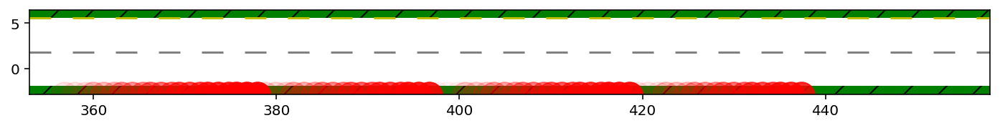

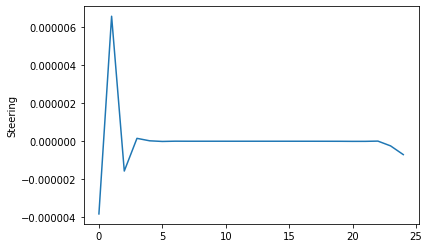

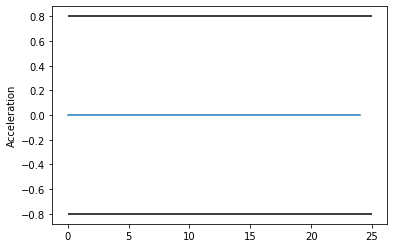

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.68ms (105.00us)   1.69ms (105.47us)        16
       nlp_g  |   2.85ms (178.13us)   2.89ms (180.39us)        16
    nlp_grad  | 495.00us (495.00us) 494.97us (494.97us)         1
  nlp_grad_f  |   2.31ms (135.82us)   2.32ms (136.75us)        17
  nlp_hess_l  |  34.14ms (  2.28ms)  35.02ms (  2.33ms)        15
   nlp_jac_g  |  18.63ms (  1.10ms)  19.19ms (  1.13ms)        17
       total  | 143.90ms (143.90ms) 146.16ms (146.16ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


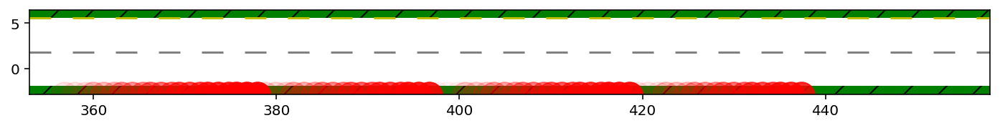

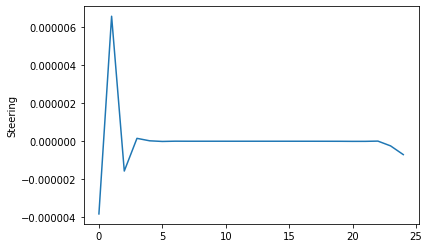

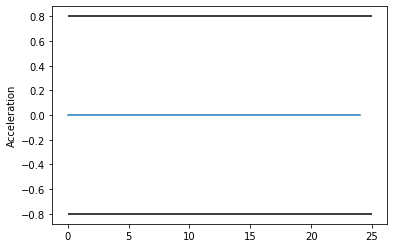

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.25ms ( 89.36us)   1.26ms ( 90.19us)        14
       nlp_g  |   2.05ms (146.57us)   2.06ms (147.06us)        14
    nlp_grad  | 540.00us (540.00us) 545.05us (545.05us)         1
  nlp_grad_f  |   1.67ms (111.53us)   1.68ms (112.27us)        15
  nlp_hess_l  |  25.37ms (  1.95ms)  25.50ms (  1.96ms)        13
   nlp_jac_g  |  13.59ms (905.80us)  13.60ms (906.58us)        15
       total  | 106.56ms (106.56ms) 106.74ms (106.74ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


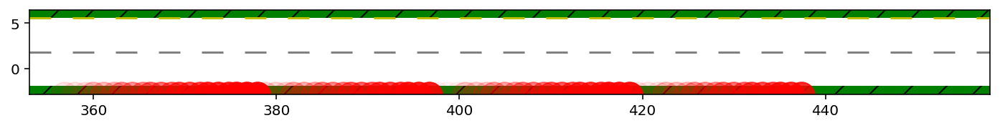

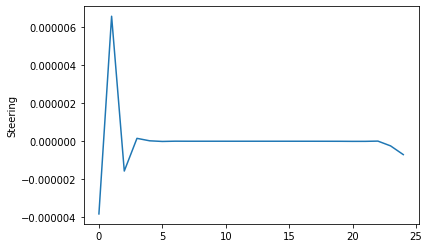

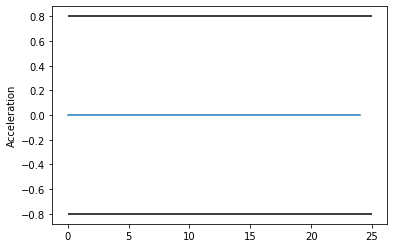

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.58ms ( 87.67us)   1.58ms ( 87.97us)        18
       nlp_g  |   2.76ms (153.39us)   2.77ms (153.92us)        18
    nlp_grad  | 479.00us (479.00us) 479.98us (479.98us)         1
  nlp_grad_f  |   2.46ms (129.74us)   2.50ms (131.63us)        19
  nlp_hess_l  |  33.05ms (  1.94ms)  33.24ms (  1.96ms)        17
   nlp_jac_g  |  18.64ms (980.84us)  19.44ms (  1.02ms)        19
       total  | 135.23ms (135.23ms) 136.40ms (136.40ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


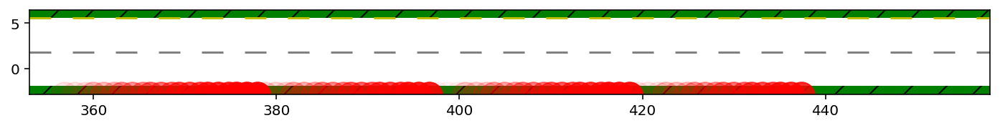

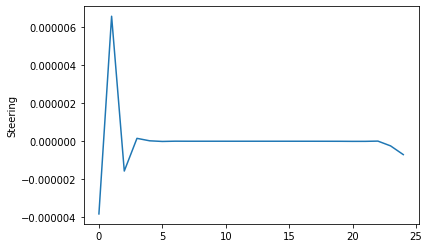

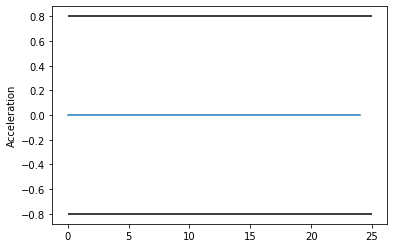

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.09ms ( 94.77us)   2.10ms ( 95.48us)        22
       nlp_g  |   3.74ms (170.14us)   3.71ms (168.72us)        22
    nlp_grad  | 509.00us (509.00us) 510.92us (510.92us)         1
  nlp_grad_f  |   2.93ms (127.30us)   3.07ms (133.61us)        23
  nlp_hess_l  |  42.50ms (  2.02ms)  43.56ms (  2.07ms)        21
   nlp_jac_g  |  22.54ms (979.87us)  23.07ms (  1.00ms)        23
       total  | 173.97ms (173.97ms) 176.42ms (176.42ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


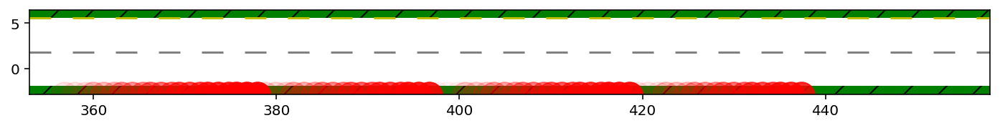

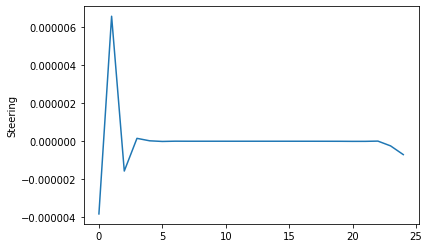

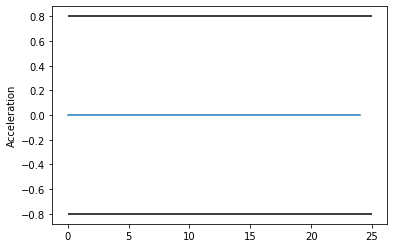

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.81ms (113.37us)   1.90ms (118.46us)        16
       nlp_g  |   2.98ms (186.06us)   3.24ms (202.74us)        16
    nlp_grad  | 478.00us (478.00us) 478.18us (478.18us)         1
  nlp_grad_f  |   2.28ms (134.29us)   2.30ms (135.54us)        17
  nlp_hess_l  |  35.54ms (  2.37ms)  39.83ms (  2.66ms)        15
   nlp_jac_g  |  19.54ms (  1.15ms)  19.62ms (  1.15ms)        17
       total  | 146.91ms (146.91ms) 164.67ms (164.67ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


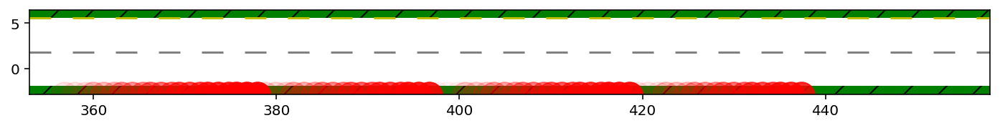

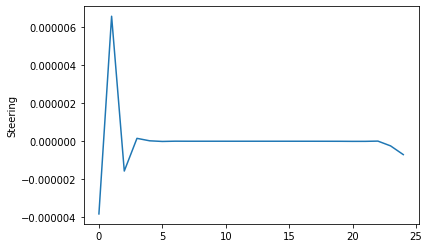

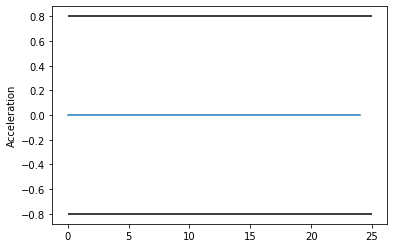

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.18ms ( 84.57us)   1.19ms ( 85.11us)        14
       nlp_g  |   2.00ms (142.93us)   2.00ms (142.96us)        14
    nlp_grad  | 463.00us (463.00us) 464.39us (464.39us)         1
  nlp_grad_f  |   1.46ms ( 97.00us)   1.46ms ( 97.64us)        15
  nlp_hess_l  |  25.51ms (  1.96ms)  25.56ms (  1.97ms)        13
   nlp_jac_g  |  13.81ms (920.67us)  13.89ms (925.98us)        15
       total  |  99.92ms ( 99.92ms) 100.12ms (100.12ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


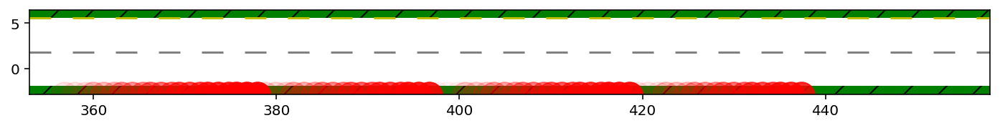

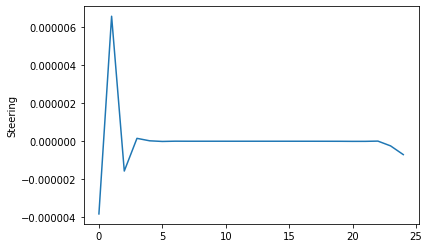

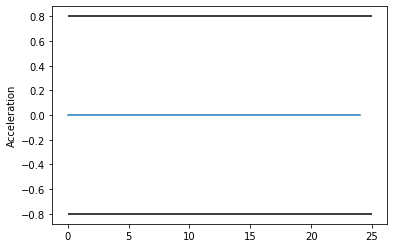

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.61ms ( 89.50us)   1.62ms ( 89.94us)        18
       nlp_g  |   3.09ms (171.83us)   3.08ms (171.15us)        18
    nlp_grad  | 572.00us (572.00us) 571.61us (571.61us)         1
  nlp_grad_f  |   2.11ms (111.21us)   2.10ms (110.47us)        19
  nlp_hess_l  |  35.55ms (  2.09ms)  35.67ms (  2.10ms)        17
   nlp_jac_g  |  18.58ms (978.05us)  18.65ms (981.83us)        19
       total  | 158.69ms (158.69ms) 158.97ms (158.97ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


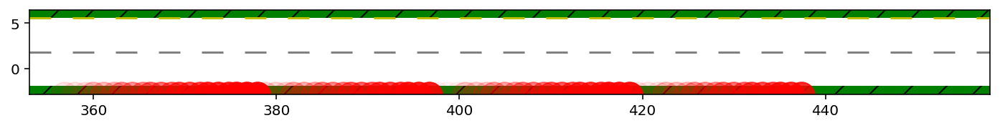

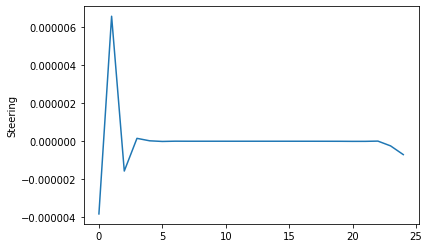

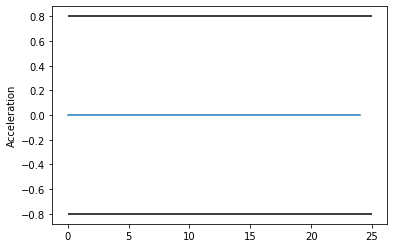

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.20ms (115.68us)   2.22ms (116.77us)        19
       nlp_g  |   3.52ms (185.42us)   3.52ms (185.48us)        19
    nlp_grad  | 805.00us (805.00us) 820.56us (820.56us)         1
  nlp_grad_f  |   2.61ms (130.45us)   2.62ms (130.96us)        20
  nlp_hess_l  |  44.96ms (  2.50ms)  45.24ms (  2.51ms)        18
   nlp_jac_g  |  23.60ms (  1.18ms)  23.83ms (  1.19ms)        20
       total  | 170.49ms (170.49ms) 171.43ms (171.43ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


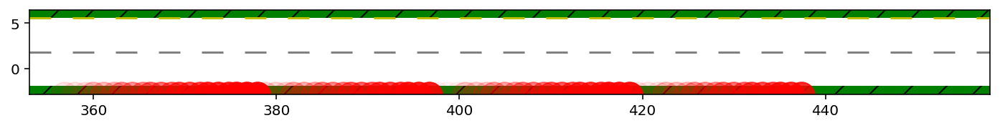

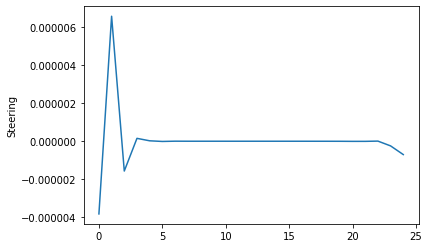

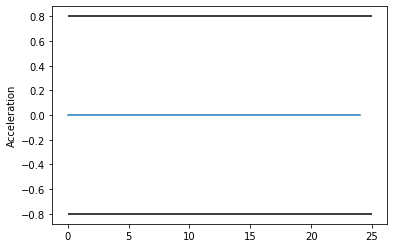

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.33ms ( 88.93us)   1.35ms ( 90.21us)        15
       nlp_g  |   2.25ms (149.73us)   2.25ms (150.05us)        15
    nlp_grad  | 536.00us (536.00us) 540.41us (540.41us)         1
  nlp_grad_f  |   1.87ms (116.81us)   1.88ms (117.20us)        16
  nlp_hess_l  |  26.77ms (  1.91ms)  26.89ms (  1.92ms)        14
   nlp_jac_g  |  15.82ms (988.62us)  15.95ms (996.92us)        16
       total  | 107.39ms (107.39ms) 107.84ms (107.84ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


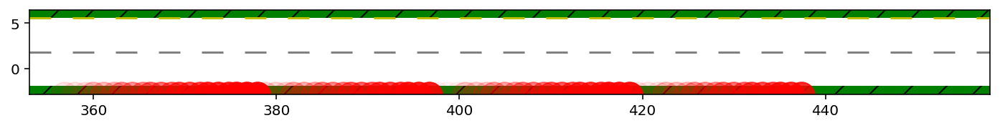

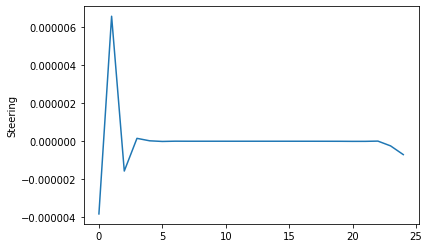

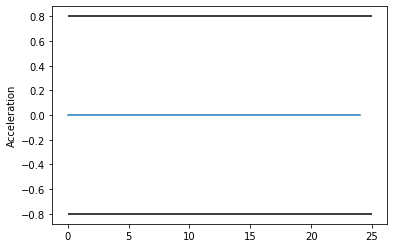

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.54ms (110.00us)   1.59ms (113.38us)        14
       nlp_g  |   2.29ms (163.50us)   2.29ms (163.58us)        14
    nlp_grad  | 492.00us (492.00us) 492.52us (492.52us)         1
  nlp_grad_f  |   1.83ms (122.13us)   1.87ms (124.60us)        15
  nlp_hess_l  |  25.89ms (  1.99ms)  25.99ms (  2.00ms)        13
   nlp_jac_g  |  14.90ms (993.47us)  15.00ms (  1.00ms)        15
       total  | 103.18ms (103.18ms) 103.68ms (103.68ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


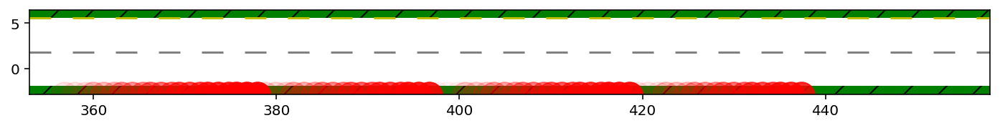

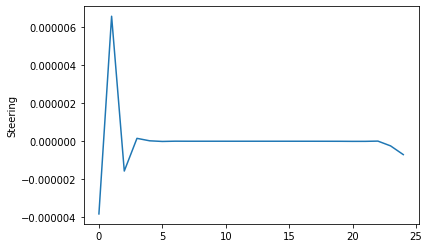

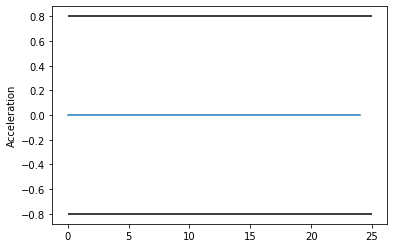

      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.28ms ( 91.21us)   1.29ms ( 92.00us)        14
       nlp_g  |   2.12ms (151.07us)   2.11ms (150.66us)        14
    nlp_grad  | 504.00us (504.00us) 504.27us (504.27us)         1
  nlp_grad_f  |   1.91ms (127.27us)   1.92ms (127.69us)        15
  nlp_hess_l  |  24.49ms (  1.88ms)  24.49ms (  1.88ms)        13
   nlp_jac_g  |  14.06ms (937.27us)  14.12ms (941.25us)        15
       total  | 105.05ms (105.05ms) 105.21ms (105.21ms)         1
 i_mpc 5 n_round 1 i 01 Cost -41149.73 Slack 0.00 
 J_i -41149.731,  J_j 0.000, Slack 0.000, CA  0.000
 Dir: 20200224-103456_real_dim_CA
 SOLUTION


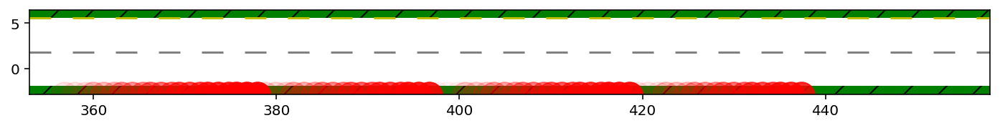

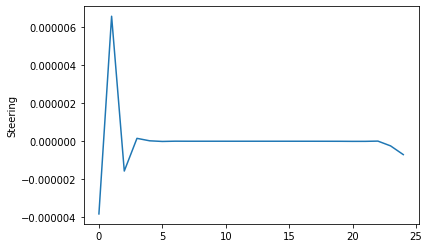

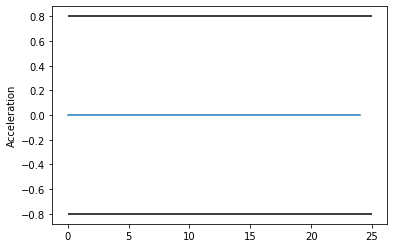

SOLVING AGENT 0
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.93ms ( 91.76us)   1.93ms ( 92.09us)        21
       nlp_g  |  12.33ms (587.29us)  12.30ms (585.79us)        21
    nlp_grad  |   1.67ms (  1.67ms)   1.69ms (  1.69ms)         1
  nlp_grad_f  |   1.98ms ( 89.91us)   2.03ms ( 92.25us)        22
  nlp_hess_l  |  76.91ms (  3.85ms)  77.14ms (  3.86ms)        20
   nlp_jac_g  |  44.53ms (  2.02ms)  44.63ms (  2.03ms)        22
       total  | 254.49ms (254.49ms) 254.80ms (254.80ms)         1
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   2.64ms (109.79us)   2.66ms (110.70us)        24
       nlp_g  |  11.08ms (461.63us)  11.07ms (461.32us)        24
    nlp_grad  |   1.37ms (  1.37ms)   1.37ms (  1.37ms)         1
  nlp_grad_f  |   2.74ms (114.33us)   2.75ms (114.79us)        24
  nlp_hess_l  |  84.03ms (  3.82ms)  84.48ms (  3.84ms)        22
   nlp_jac_g  |  43.65ms (  1.82ms)  43.77ms (  1.82ms)     

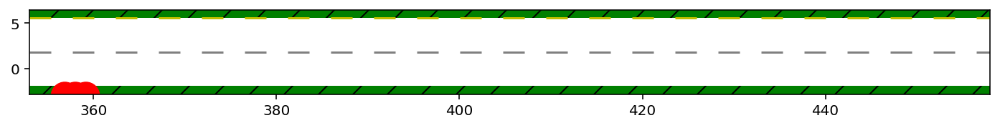

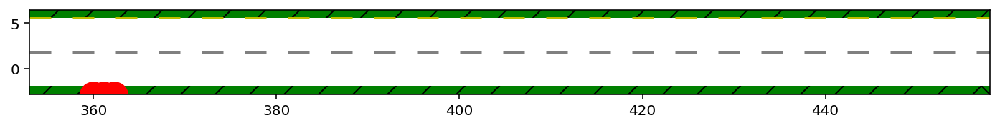

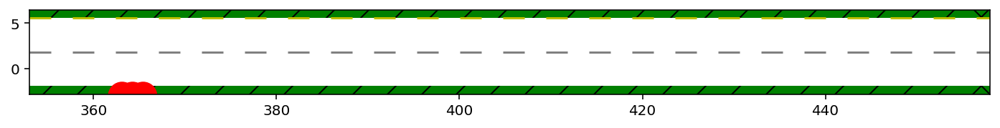

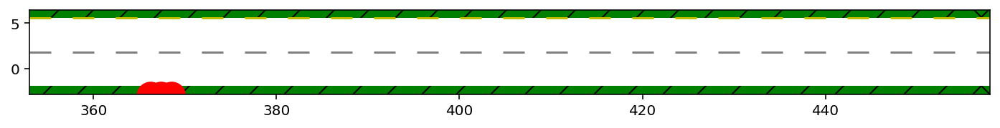

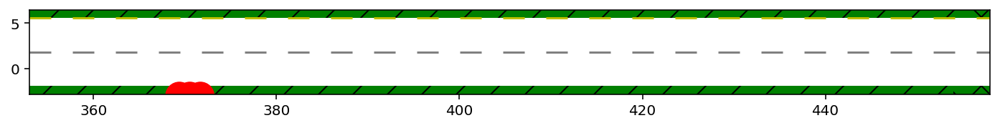

...

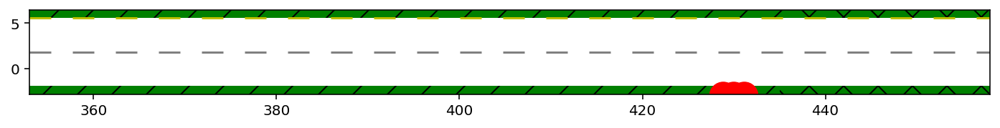

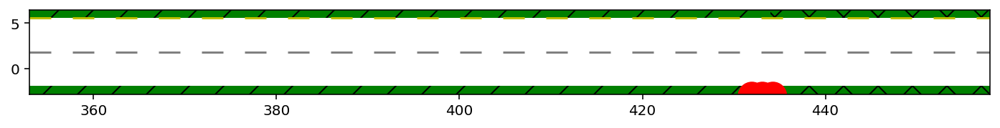

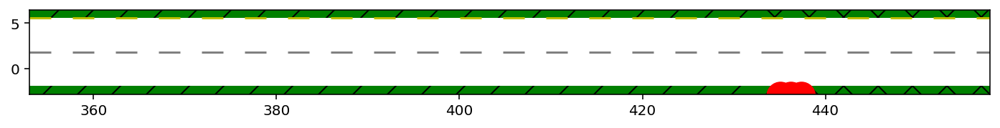

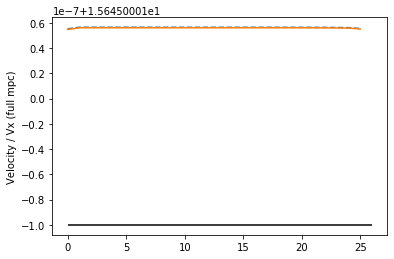

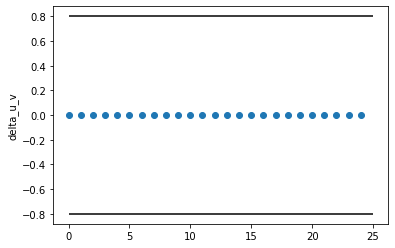

Solver Done!  Runtime: 778


In [27]:
import time, datetime, argparse
import os, sys
import numpy as np
np.set_printoptions(precision=2)
import matplotlib.pyplot as plt
import copy as cp
import pickle

# PROJECT_PATH = '/home/nbuckman/Dropbox (MIT)/DRL/2020_01_cooperative_mpc/mpc-multiple-vehicles/'
PROJECT_PATH = '/Users/noambuckman/mpc-multiple-vehicles/'
sys.path.append(PROJECT_PATH)

import casadi as cas
import src.MPC_Casadi as mpc
import src.TrafficWorld as tw
import src.IterativeBestResponseMPCMultiple as mibr
import src.car_plotting_multiple as cmplot


##########################################################
svo_theta = np.pi/4.0
# random_seed = args.random_seed[0]
random_seed = 3
NEW = False
if NEW:
    optional_suffix = "ellipses"
    subdir_name = datetime.datetime.now().strftime("%Y%m%d_%H%M%S") + optional_suffix
    folder = "results/" + subdir_name + "/"
    os.makedirs(folder)
    os.makedirs(folder+"imgs/")
    os.makedirs(folder+"data/")
    os.makedirs(folder+"vids/")
    os.makedirs(folder+"plots/")
else:
    subdir_name = "20200224-103456_real_dim_CA"
    folder = "results/" + subdir_name + "/"
print(folder)
if random_seed > 0:
    np.random.seed(random_seed)


#######################################################################
T = 5  # MPC Planning Horizon
dt = 0.2
N = int(T/dt) #Number of control intervals in MPC
n_rounds_mpc = 6
percent_mpc_executed = 1.0 ## This is the percent of MPC that is executed
number_ctrl_pts_executed =  int(np.floor(N*percent_mpc_executed))
print("number ctrl pts:  %d"%number_ctrl_pts_executed)
XAMB_ONLY = False
PLOT_FLAG, SAVE_FLAG, PRINT_FLAG = False, False, False
n_other = 2
n_rounds_ibr = 2

world = tw.TrafficWorld(2, 0, 1000)
    # large_world = tw.TrafficWorld(2, 0, 1000, 5.0)

#########################################################################
actual_xamb = np.zeros((6, n_rounds_mpc*number_ctrl_pts_executed + 1))
actual_uamb = np.zeros((2, n_rounds_mpc*number_ctrl_pts_executed))
actual_xothers = [np.zeros((6, n_rounds_mpc*number_ctrl_pts_executed + 1)) for i in range(n_other)]
actual_uothers = [np.zeros((2, n_rounds_mpc*number_ctrl_pts_executed)) for i in range(n_other)]
actual_all_other_x0 = [np.zeros((6, 2*N)) for i in range(n_other)]


xamb = np.zeros(shape=(6, N+1))
t_start_time = time.time()
####################################################
## Create the Cars in this Problem
all_other_x0 = []
all_other_u = []
all_other_MPC = []
all_other_x = [np.zeros(shape=(6, N+1)) for i in range(n_other)]
next_x0 = 0
for i in range(n_other):
    x1_MPC = mpc.MPC(dt)
    x1_MPC.n_circles = 3
    x1_MPC.theta_iamb =  svo_theta
    x1_MPC.N = N
    x1_MPC.k_change_u_v = 0.001
    x1_MPC.max_delta_u = 50 * np.pi/180 * x1_MPC.dt
    x1_MPC.k_u_v = 0.01
    x1_MPC.k_u_delta = .00001
    x1_MPC.k_change_u_v = 0.01
    x1_MPC.k_change_u_delta = 0.001

    x1_MPC.k_s = 0
    x1_MPC.k_x = 0
    x1_MPC.k_x_dot = -1.0 / 100.0
    x1_MPC.k_lat = 0.001
    x1_MPC.k_lon = 0.0

    x1_MPC.k_phi_error = 0.001
    x1_MPC.k_phi_dot = 0.01    
    x1_MPC.strict_wall_constraint = False

    ####Vehicle Initial Conditions
    if i%2 == 0: 
        lane_number = 0
        next_x0 += x1_MPC.L + 2*x1_MPC.min_dist
    else:
        lane_number = 1
    initial_speed = 0.75*x1_MPC.max_v
    traffic_world = world
    x1_MPC.fd = x1_MPC.gen_f_desired_lane(traffic_world, lane_number, True)
    x0 = np.array([next_x0, traffic_world.get_lane_centerline_y(lane_number), 0, 0, initial_speed, 0]).T

    ## Set the initial control of the other vehicles
    u1 = np.zeros((2,N))
    # u1[0,:] = np.clip(np.pi/180 *np.random.normal(size=(1,N)), -2 * np.pi/180, 2 * np.pi/180)
    SAME_SIDE = False
    if lane_number == 1 or SAME_SIDE:
        u1[0,0] = 2 * np.pi/180
    else:
        u1[0,0] = -2 * np.pi/180
    u1[0,0] = 0 

    all_other_MPC += [x1_MPC]
    all_other_x0 += [x0]
    all_other_u += [u1]    

# Settings for Ambulance
amb_MPC = cp.deepcopy(x1_MPC)
amb_MPC.theta_iamb = 0.0

amb_MPC.k_u_v = 0.0000
amb_MPC.k_u_delta = .01
amb_MPC.k_change_u_v = 0.0000
amb_MPC.k_change_u_delta = 0

amb_MPC.k_s = 0
amb_MPC.k_x = 0
amb_MPC.k_x_dot = -1.0 / 100.0
amb_MPC.k_x = -1.0/100
amb_MPC.k_x_dot = 0
amb_MPC.k_lat = 0.00001
amb_MPC.k_lon = 0.0
# amb_MPC.min_v = 0.8*initial_speed
amb_MPC.max_v = 35 * 0.447 # m/s
amb_MPC.k_phi_error = 0.1
amb_MPC.k_phi_dot = 0.01
NO_GRASS = False
amb_MPC.min_y = world.y_min        
amb_MPC.max_y = world.y_max
if NO_GRASS:
    amb_MPC.min_y += world.grass_width
    amb_MPC.max_y -= world.grass_width
amb_MPC.fd = amb_MPC.gen_f_desired_lane(world, 0, True)
x0_amb = np.array([0, 0, 0, 0, initial_speed , 0]).T
if SAVE_FLAG:
    pickle.dump(x1_MPC, open(folder + "data/"+"mpc%d"%i + ".p",'wb'))
    pickle.dump(amb_MPC, open(folder + "data/"+"mpcamb" + ".p",'wb'))
########################################################################
#### SOLVE THE MPC #####################################################
xamb_executed, all_other_x_executed = None, [] #This gets updated after each round of MPC
uamb_mpc, all_other_u_mpc = None, []
for i_mpc in range(n_rounds_mpc):
    min_slack = np.infty
    actual_t = i_mpc * number_ctrl_pts_executed
    ###### Update the initial conditions for all vehicles
    if i_mpc > 0:
        x0_amb = xamb_executed[:, number_ctrl_pts_executed] 
        for i in range(len(all_other_x0)):
            all_other_x0[i] = all_other_x_executed[i][:, number_ctrl_pts_executed]        

    uamb_ibr = None
    xamb_ibr = None
    xamb_des_ibr = None
    all_other_u_ibr = [None for i in range(n_other)]    
    all_other_x_ibr = [None for i in range(n_other)]
    all_other_x_des_ibr = [None for i in range(n_other)]
    amb_solved_flag = False
    other_solved_flag = [False for i in range(n_other)]

    for i_rounds_ibr in range(n_rounds_ibr):
        print("Initial conditions MPC_i: %d IBR_i: %d x: %0.1f y:%0.1f"%(i_mpc, i_rounds_ibr, x0_amb[0], x0_amb[1]))
        if i_rounds_ibr == 0:
            ###### Initial guess for the other u.  This will be updated once the other vehicles
            ###### solve the best response to the ambulance. Initial guess just looks at the last solution. This could also be a lange change
            for i in range(n_other):
                if i_mpc == 0:
                    all_other_u_ibr[i] = np.zeros(shape=(2, N)) ## All vehicles constant velocity
                else:
                    all_other_u_ibr[i] = np.concatenate((all_other_u_mpc[i][:, number_ctrl_pts_executed:], np.tile(all_other_u_mpc[i][:,-1:],(1, number_ctrl_pts_executed))),axis=1) ##   
                print((all_other_u_ibr[i], all_other_x0[i]))
                all_other_x_ibr[i], all_other_x_des_ibr[i] = all_other_MPC[i].forward_simulate_all(all_other_x0[i].reshape(6,1), all_other_u_ibr[i])

        ########## Solve the Ambulance MPC ##########
        response_MPC = amb_MPC
        response_x0 = x0_amb
        nonresponse_MPC_list = all_other_MPC
        nonresponse_x0_list = all_other_x0
        nonresponse_u_list = all_other_u_ibr
        nonresponse_x_list = all_other_x_ibr
        nonresponse_xd_list = all_other_x_des_ibr
        ################# Generate the warm starts ###############################
        u_warm_profiles = mibr.generate_warm_u(N, response_MPC)
        if i_rounds_ibr > 0:            # warm start with the solution from the last IBR round
            u_warm_profiles["previous"] = uamb_ibr    
        else:                           # take the control inputs of the last MPC and continue the ctrl
            if i_mpc > 0:
                u_warm_profiles["previous"] = np.concatenate((uamb_mpc[:, number_ctrl_pts_executed:], np.tile(uamb_mpc[:,-1:],(1, number_ctrl_pts_executed))),axis=1) ##    
        #######################################################################
        min_response_cost = 99999999
        for k_warm in u_warm_profiles.keys():
            u_warm = u_warm_profiles[k_warm]
            x_warm, x_des_warm = response_MPC.forward_simulate_all(response_x0.reshape(6,1), u_warm)
            bri = mibr.IterativeBestResponseMPCMultiple(response_MPC, None, nonresponse_MPC_list )
            k_slack, k_CA, k_CA_power, wall_CA = 10000.0, 0.000000000000000, 4, True
            bri.k_slack, bri.k_CA, bri.k_CA_power, bri.world, bri.wall_CA = k_slack, k_CA, k_CA_power, world, wall_CA
            # for slack_var in bri.slack_vars_list: ## Added to constrain slacks
            #     bri.opti.subject_to(cas.vec(slack_var) <= 1.0)
            bri.generate_optimization(N, T, response_x0, None, nonresponse_x0_list,  0, slack=False)
            bri.opti.set_initial(bri.u_opt, u_warm)            
            bri.opti.set_initial(bri.x_opt, x_warm)
            bri.opti.set_initial(bri.x_desired, x_des_warm)   
            ### Set the trajectories of the nonresponse vehicles (as given)        
            for j in range(len(nonresponse_x_list)):
                bri.opti.set_value(bri.allother_x_opt[j], nonresponse_x_list[j])
                bri.opti.set_value(bri.allother_x_desired[j], nonresponse_xd_list[j])
            
            # print("Plot the Warm Start")
            # print("  k_warm", k_warm)
            # plt.plot(u_warm[0])
            # plt.ylabel("Steering")
            # plt.show()
            # plt.plot(u_warm[1])
            # plt.ylabel("Acceleration")            
            # plt.show()            
            # for k in range(N):
            #     cmplot.plot_multiple_cars( k, bri.responseMPC, nonresponse_x_list, x_warm,  True, None, None, None, bri.world, 0)     
            #     plt.show()            
            ### Solve the Optimization
            # Debugging
            # plot_range = [N]
            # bri.opti.callback(lambda i: bri.debug_callback(i, plot_range))
            # bri.opti.callback(lambda i: print("J_i %.03f,  J_j %.03f, Slack %.03f, CA  %.03f"%(bri.solution.value(bri.response_svo_cost), bri.solution.value(bri.other_svo_cost), bri.solution.value(bri.k_slack*bri.slack_cost), bri.solution.value(bri.k_CA*bri.collision_cost))))
            try:
                bri.solve(None, nonresponse_u_list)
                x1, u1, x1_des, _, _, _, _, _, _ = bri.get_solution()
                print(" i_mpc %d n_round %d i %02d Cost %.02f Slack %.02f "%(i_mpc, i_rounds_ibr, i, bri.solution.value(bri.total_svo_cost), bri.solution.value(bri.slack_cost)))
                print(" J_i %.03f,  J_j %.03f, Slack %.03f, CA  %.03f"%(bri.solution.value(bri.response_svo_cost), bri.solution.value(bri.other_svo_cost), bri.solution.value(bri.k_slack*bri.slack_cost), bri.solution.value(bri.k_CA*bri.collision_cost)))
                print(" Dir:", subdir_name)
                if bri.solution.value(bri.slack_cost) < min_slack:
                    current_cost = bri.solution.value(bri.total_svo_cost)
                    # print("  WARM START: %s, C: %0.02f"%(k_warm, current_cost)) 
                    # for k in range(N):
                    #     cmplot.plot_multiple_cars( k, bri.responseMPC, nonresponse_x_list, x_warm,  True, None, None, None, bri.world, 0)                                                     
                    #     plt.show()     
                    print( " SOLUTION")
                    cmplot.plot_single_frame(world, bri.responseMPC, x1, nonresponse_x_list, None, xamb_desired=None, xothers_desired=None,  
                CIRCLES=True, parallelize=True, camera_speed = 0)
                    plt.show()
                    plt.plot(u1[0,:])
                    plt.ylabel("Steering")
                    plt.show()
                    plt.plot(u1[1,:])
                    plt.hlines(amb_MPC.max_v_u,0,u1.shape[1])
                    plt.hlines(amb_MPC.min_v_u,0,u1.shape[1])                    
                    plt.ylabel("Acceleration")            
                    plt.show()                                                                 
                    if current_cost < min_response_cost:                # Update the solution for response vehicle at this iteration
                        uamb_ibr = u1
                        xamb_ibr = x1
                        xamb_des_ibr = x1_des
                        min_response_cost = current_cost
                        min_response_warm_ibr = k_warm
                        min_bri_ibr = bri
                        amb_solved_flag = True  
                                         
                        # file_name = folder + "data/"+'%03d'%ibr_sub_it
                        # mibr.save_state(file_name, xamb, uamb, xamb_des, all_other_x, all_other_u, all_other_x_des)
                        # mibr.save_costs(file_name, bri)                  
            except RuntimeError:
                print("Infeasibility: k_warm %s"%k_warm)
                # ibr_sub_it +=1   
        if not amb_solved_flag:
            raise Exception("Ambulance did not converge to a solution")
        ########### SOLVE FOR THE OTHER VEHICLES ON THE ROAD
        if not XAMB_ONLY:
            for i in range(len(all_other_MPC)):
                print("SOLVING AGENT %d"%i)
                response_MPC = all_other_MPC[i]
                response_x0 = all_other_x0[i]
                nonresponse_MPC_list = all_other_MPC[:i] + all_other_MPC[i+1:]
                nonresponse_x0_list = all_other_x0[:i] + all_other_x0[i+1:]
                nonresponse_u_list = all_other_u_ibr[:i] + all_other_u_ibr[i+1:]
                nonresponse_x_list = all_other_x_ibr[:i] + all_other_x_ibr[i+1:]
                nonresponse_xd_list = all_other_x_des_ibr[:i] + all_other_x_des_ibr[i+1:]

                ################  Warm Start
                u_warm_profiles = mibr.generate_warm_u(N, response_MPC)
                if i_rounds_ibr > 0:   # warm start with the solution from the last IBR round
                    u_warm_profiles["previous"] = all_other_u_ibr[i] 
                else:
                    # take the control inputs of the last MPC and continue the ctrl
                    if i_mpc > 0:
                        u_warm_profiles["previous"] = np.concatenate((all_other_u[i][:, number_ctrl_pts_executed:], np.tile(all_other_u[i][:,-1:],(1, number_ctrl_pts_executed))),axis=1) ##    

                min_response_cost = 99999999
                for k_warm in u_warm_profiles.keys():
                   
                    #### OPTIMZATION SETTINGS
                    bri = mibr.IterativeBestResponseMPCMultiple(response_MPC, amb_MPC, nonresponse_MPC_list)
                    bri.k_slack, bri.k_CA, bri.k_CA_power, bri.world, bri.wall_CA = k_slack, k_CA, k_CA_power, world, wall_CA
                    bri.generate_optimization(N, T, response_x0, x0_amb, nonresponse_x0_list,  0, slack=False)
                    # bri.opti.callback(lambda i: print("J_i %.03f,  J_j %.03f, Slack %.03f, CA  %.03f"%(bri.solution.value(bri.response_svo_cost), bri.solution.value(bri.other_svo_cost), bri.solution.value(bri.k_slack*bri.slack_cost), bri.solution.value(bri.k_CA*bri.collision_cost))))
                    # bri.opti.callback(lambda i: bri.debug_callback(i, range(N)))
                    ### Set the trajectories of the nonresponse vehicles (as given)        
                    bri.opti.set_value(bri.xamb_opt, xamb_ibr)
                    bri.opti.set_value(bri.xamb_desired, xamb_des_ibr)
                    for j in range(len(nonresponse_x_list)):
                        bri.opti.set_value(bri.allother_x_opt[j], nonresponse_x_list[j])
                        bri.opti.set_value(bri.allother_x_desired[j], nonresponse_xd_list[j])
                    # for slack_var in bri.slack_vars_list: ## Added to constrain slacks
                    #     bri.opti.subject_to(cas.vec(slack_var) <= 1.0)                    
                    
                    u_warm = u_warm_profiles[k_warm]
                    x_warm, x_des_warm = response_MPC.forward_simulate_all(response_x0.reshape(6,1), u_warm)                    
                    bri.opti.set_initial(bri.u_opt, u_warm)            
                    bri.opti.set_initial(bri.x_opt, x_warm)
                    bri.opti.set_initial(bri.x_desired, x_des_warm)   


                    # print("Plot the Warm Start")
                    # print("  k_warm", k_warm)
                    # plt.plot(u_warm[0])
                    # plt.ylabel("Steering")
                    # plt.show()
                    # plt.plot(u_warm[1])
                    # plt.ylabel("Acceleration")            
                    # plt.show()                       
                    # for k in range(N):
                    #     temp_amb_nonresponse = nonresponse_x_list + [xamb]
                    #     cmplot.plot_multiple_cars( k, bri.responseMPC, temp_amb_nonresponse, x_warm,  True, None, None, None, bri.world, 0)     
                    #     plt.show()
                    # Debugging
                    try:                     ### Solve the Optimization
                        bri.solve(uamb_ibr, nonresponse_u_list)
                        x1_ibr_k, u1_ibr_k, x1_des_ibr_k, _, _, _, _, _, _ = bri.get_solution()
                        if PRINT_FLAG:
                            print("  i_mpc %d n_round %d i %02d Cost %.02f Slack %.02f "%(i_mpc, i_rounds_ibr, i, bri.solution.value(bri.total_svo_cost), bri.solution.value(bri.slack_cost)))
                            print("  J_i %.03f,  J_j %.03f, Slack %.03f, CA  %.03f"%(bri.solution.value(bri.response_svo_cost), bri.solution.value(bri.other_svo_cost), bri.solution.value(bri.k_slack*bri.slack_cost), bri.solution.value(bri.k_CA*bri.collision_cost)))
                            print("  Dir:", subdir_name)
                        if bri.solution.value(bri.slack_cost) < min_slack:
                            current_cost = bri.solution.value(bri.total_svo_cost)
                            if current_cost < min_response_cost:
                                all_other_x_ibr[i] = x1_ibr_k
                                all_other_u_ibr[i] = u1_ibr_k
                                all_other_x_des_ibr[i] = x1_des_ibr_k
                                other_solved_flag[i] = True
                                min_response_cost = current_cost
                                min_response_warm = k_warm
                                min_bri = bri

                                if SAVE_FLAG:
                                    file_name = folder + "data/"+'%03d'%i_rounds_ibr
                                    mibr.save_state(file_name, xamb_ibr, uamb_ibr, xamb_des_ibr, all_other_x_ibr, all_other_u_ibr, all_other_x_des_ibr)
                                    mibr.save_costs(file_name, bri)
                    except RuntimeError:
                        print("  Infeasibility: k_warm %s"%k_warm)
                if not other_solved_flag[i]:
                    raise Exception("i did not converge to a solution")

    xamb_mpc = xamb_ibr
    xamb_des_mpc = xamb_des_ibr
    uamb_mpc = uamb_ibr
    all_other_u_mpc = all_other_u_ibr
    all_other_x_mpc = all_other_x_ibr
    all_other_x_des_mpc = all_other_x_des_ibr
    bri_mpc = min_bri
    file_name = folder + "data/"+'r%02d%03d'%(i_mpc, i_rounds_ibr)

    all_other_x_executed = [np.zeros(shape=(6,number_ctrl_pts_executed+1)) for i in range(n_other)]
    all_other_u_executed = [np.zeros(shape=(2,number_ctrl_pts_executed)) for i in range(n_other)]
    if (not amb_solved_flag) or (False in other_solved_flag):
        print("MPC Error: One of the vehicles did not converge to a solution.")
        print(xamb_mpc)
        print(all_other_x_mpc)
        raise Exception
    else:
        ### SAVE EXECUTED MPC SOLUTION TO HISTORY
        actual_t = i_mpc * number_ctrl_pts_executed
        xamb_executed, uamb_executed = xamb_mpc[:,:number_ctrl_pts_executed+1], uamb_mpc[:,:number_ctrl_pts_executed]
        actual_xamb[:,actual_t:actual_t+number_ctrl_pts_executed+1], actual_uamb[:,actual_t:actual_t+number_ctrl_pts_executed] = xamb_executed, uamb_executed
        for i in range(len(all_other_x)):
            all_other_x_executed[i], all_other_u_executed[i] = all_other_x_mpc[i][:,:number_ctrl_pts_executed+1], all_other_u_mpc[i][:,:number_ctrl_pts_executed]
            actual_xothers[i][:,actual_t:actual_t+number_ctrl_pts_executed+1], actual_uothers[i][:,actual_t:actual_t+number_ctrl_pts_executed] = all_other_x_executed[i], all_other_u_executed[i]

        ### SAVE STATES AND PLOT
        if SAVE_FLAG:
            mibr.save_state(file_name, xamb_mpc, uamb_mpc, xamb_des_mpc, all_other_x_mpc, all_other_u_mpc, all_other_x_des_mpc)
            mibr.save_costs(file_name, bri_mpc)        
        print(" MPC Done:  Rd %02d / %02d"%(i_mpc, n_rounds_mpc))
        print(" Full MPC Solution", xamb_mpc[0:2,:])
        print(" Executed MPC", xamb_mpc[0:2,:number_ctrl_pts_executed+1])
        print(" Solution Costs...")
        for cost in bri_mpc.car1_costs_list:
            print("%.04f"%bri_mpc.solution.value(cost))
        print(bri_mpc.solution.value(bri_mpc.k_CA * bri_mpc.collision_cost), bri_mpc.solution.value(bri_mpc.collision_cost))
        print(bri_mpc.solution.value(bri_mpc.k_slack * bri_mpc.slack_cost), bri_mpc.solution.value(bri_mpc.slack_cost))
        print(" Save to...", file_name)
        
        plot_range = range(number_ctrl_pts_executed+1)
        for k in plot_range:
            cmplot.plot_multiple_cars( k, bri_mpc.responseMPC, all_other_x_mpc, xamb_mpc, True, None, None, None, bri_mpc.world, 0)     
            plt.show()
        plt.plot(xamb_mpc[4,:],'--')
        plt.plot(xamb_mpc[4,:] * np.cos(xamb_mpc[2,:]))
        plt.ylabel("Velocity / Vx (full mpc)")
        plt.hlines(35*0.447,0,xamb_mpc.shape[1])
        plt.show()
        plt.plot(uamb_mpc[1,:],'o')
        plt.hlines(amb_MPC.max_v_u,0,uamb_mpc.shape[1])
        plt.hlines(amb_MPC.min_v_u,0,uamb_mpc.shape[1])
        plt.ylabel("delta_u_v")
        plt.show()
print("Solver Done!  Runtime: %.1d"%(time.time()-t_start_time))


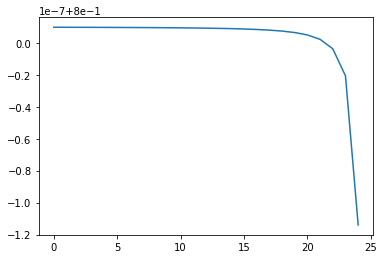

In [14]:
plt.plot(uamb_ibr[1,:])

(-1, 1)

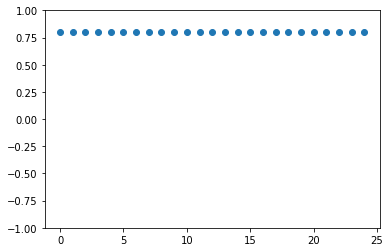

In [24]:
plt.plot(uamb_ibr[1,:],'o')
plt.ylim([-1,1])

In [23]:
np.mean(uamb_ibr[1,:])

0.8000000019378433

In [57]:
response_MPC = amb_MPC
response_x0 = x0_amb

u_warm_profiles = mibr.generate_warm_u(N, response_MPC)

Plot the Warm Start
  k_warm none halfaccel


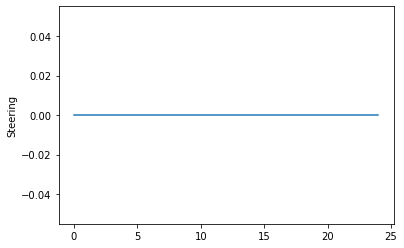

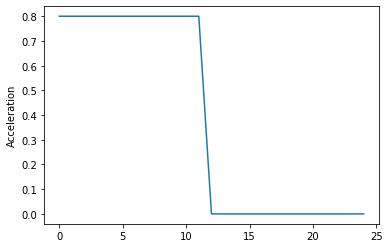

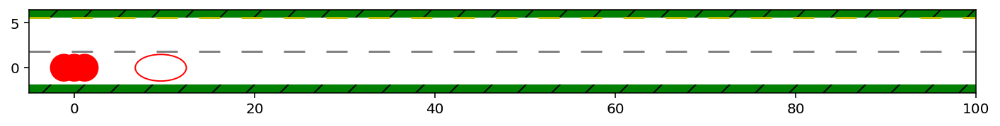

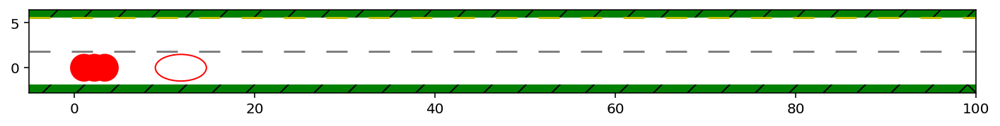

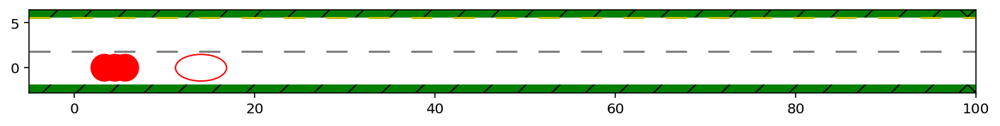

...

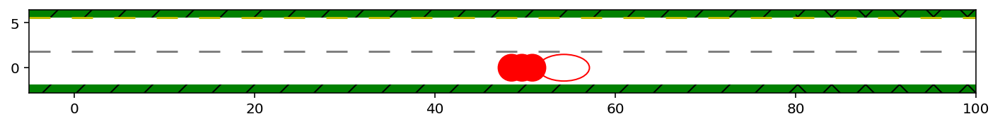

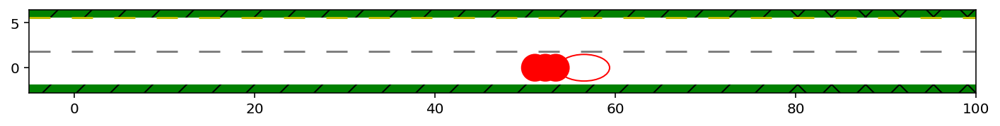

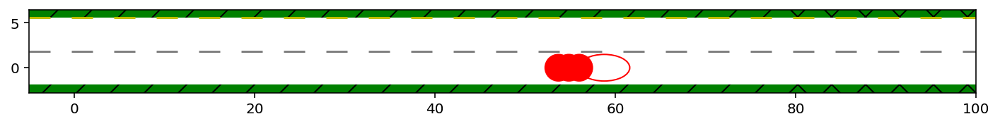

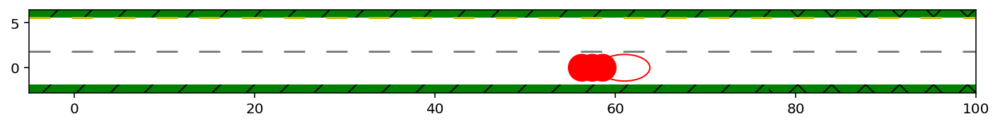

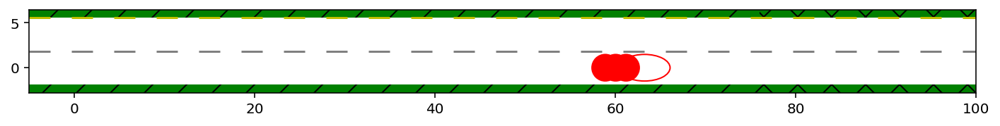

In [66]:
response_MPC = amb_MPC
response_x0 = x0_amb
k_warm = 'none halfaccel'
u_warm = u_warm_profiles[k_warm]
x_warm, x_des_warm = response_MPC.forward_simulate_all(response_x0.reshape(6,1), u_warm)
bri = mibr.IterativeBestResponseMPCMultiple(response_MPC, None, nonresponse_MPC_list )
k_slack, k_CA, k_CA_power, wall_CA = 10000.0, 0.000000000000000, 4, True
bri.k_slack, bri.k_CA, bri.k_CA_power, bri.world, bri.wall_CA = k_slack, k_CA, k_CA_power, world, wall_CA
# for slack_var in bri.slack_vars_list: ## Added to constrain slacks
#     bri.opti.subject_to(cas.vec(slack_var) <= 1.0)
bri.generate_optimization(N, T, response_x0, None, nonresponse_x0_list,  0, slack=False)
bri.opti.set_initial(bri.u_opt, u_warm)            
bri.opti.set_initial(bri.x_opt, x_warm)
bri.opti.set_initial(bri.x_desired, x_des_warm)   
### Set the trajectories of the nonresponse vehicles (as given)        
for j in range(len(nonresponse_x_list)):
    bri.opti.set_value(bri.allother_x_opt[j], nonresponse_x_list[j])
    bri.opti.set_value(bri.allother_x_desired[j], nonresponse_xd_list[j])
print("Plot the Warm Start")
print("  k_warm", k_warm)


plt.plot(u_warm[0])
plt.ylabel("Steering")
plt.show()
plt.plot(u_warm[1])
plt.ylabel("Acceleration")            
plt.show()            
for k in range(N):
    cmplot.plot_multiple_cars( k, bri.responseMPC, nonresponse_x_list, x_warm,  True, None, None, None, bri.world, 0)     
    plt.show()        

In [62]:
nonresponse_u_list

[array([[-1.85e-06,  7.45e-07,  1.07e-06,  3.86e-07, -5.15e-08, -1.05e-07,
         -4.00e-08, -5.62e-09, -5.51e-09, -1.12e-08, -1.21e-08, -1.04e-08,
         -8.72e-09, -7.65e-09, -6.85e-09, -6.64e-09, -7.31e-09, -6.65e-09,
         -3.74e-09, -1.48e-09, -9.55e-10, -9.20e-10, -5.40e-10,  1.44e-10,
         -1.69e-08],
        [ 8.00e-01,  8.00e-01,  8.00e-01,  8.00e-01,  8.00e-01,  8.00e-01,
          8.00e-01,  8.00e-01,  8.00e-01,  8.00e-01,  8.00e-01,  8.00e-01,
          8.00e-01,  8.00e-01,  8.00e-01,  8.00e-01,  8.00e-01,  3.69e-01,
          4.55e-08, -1.12e-08, -5.39e-15,  4.72e-15, -1.52e-15,  7.82e-16,
          4.05e-16]])]

In [59]:
response_x0

array([0.  , 0.  , 0.  , 0.  , 8.38, 0.  ])

In [60]:
nonresponse_x0_list

[array([9.59, 0.  , 0.  , 0.  , 8.38, 0.  ])]

In [52]:
u_warm_profiles.keys()

dict_keys(['lane_change_right braking', 'lane_change_right accelerating', 'lane_change_right none', 'lane_change_left braking', 'lane_change_left accelerating', 'lane_change_left none', 'none braking', 'none accelerating', 'none none', 'previous'])

In [26]:
nonresponse_x0_list

[array([9.59, 0.  , 0.  , 0.  , 8.38, 0.  ])]

In [15]:
response_MPC.max_acceleration

0.8

In [39]:
d = 0
v = 0
for t in range(N):
    v += response_MPC.max_acceleration
    d += v*dt
print(d)

52.000000000000014


In [37]:
N

25

$ d_1 = v_{i,1}t + 0.5 a t^2 $

$ d_2 = \Delta + v_{i,2}t + 0.5 a t^2 $


$ 0 = \Delta + (v_{i,2} - v_{i,1})t + 0.5 (a_{2}-a_{1}) t^2 $

In [19]:
x_warm[:,0]

array([2.10e+01, 3.78e-07, 3.39e-08, 1.85e-10, 8.33e+00, 2.10e+01])

In [18]:
nonresponse_x0_list

[array([ 3.20e+01, -3.25e-06, -9.45e-08,  2.20e-08,  1.03e+01,  2.24e+01]),
 array([ 3.20e+01,  3.70e+00,  9.84e-08, -2.39e-08,  1.03e+01,  2.24e+01])]

In [38]:
k_warm = 'lane_change_left none'

In [39]:
u_warm = u_warm_profiles[k_warm]
x_warm, x_des_warm = response_MPC.forward_simulate_all(response_x0.reshape(6,1), u_warm)
bri = mibr.IterativeBestResponseMPCMultiple(response_MPC, None, nonresponse_MPC_list )
k_slack, k_CA, k_CA_power, wall_CA = 10000.0, 0.000000000000000, 4, True
bri.k_slack, bri.k_CA, bri.k_CA_power, bri.world, bri.wall_CA = k_slack, k_CA, k_CA_power, world, wall_CA
# for slack_var in bri.slack_vars_list: ## Added to constrain slacks
#     bri.opti.subject_to(cas.vec(slack_var) <= 1.0)
bri.generate_optimization(N, T, response_x0, None, nonresponse_x0_list,  0, slack=False)
bri.opti.set_initial(bri.u_opt, u_warm)            
bri.opti.set_initial(bri.x_opt, x_warm)
bri.opti.set_initial(bri.x_desired, x_des_warm)   
### Set the trajectories of the nonresponse vehicles (as given)        
for j in range(len(nonresponse_x_list)):
    bri.opti.set_value(bri.allother_x_opt[j], nonresponse_x_list[j])
    bri.opti.set_value(bri.allother_x_desired[j], nonresponse_xd_list[j])
            

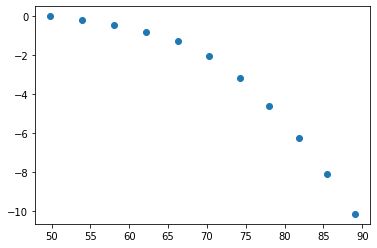

In [40]:
plt.plot(x_warm[0,:], x_warm[1,:], 'o')

In [34]:
x_warm[2:4,:]*180/np.pi

array([[ -1.52,  -4.45,  -7.29, -10.05, -12.74, -15.35, -17.88, -20.34,
        -22.71, -25.01, -27.23],
       [ -3.24,  -3.24,  -3.24,  -3.24,  -3.24,  -3.24,  -3.24,  -3.24,
         -3.24,  -3.24,  -3.24]])

In [35]:
u_warm

array([[ 0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ],
       [-1.2, -1.2, -1.2, -1.2, -1.2, -1.2, -1.2, -1.2, -1.2, -1.2]])

In [26]:
response_x0[2:4]*180/np.pi

array([-1.52, -3.24])

In [67]:
for l in [nonresponse_MPC_list, nonresponse_x0_list, nonresponse_u_list, nonresponse_x_list, nonresponse_xd_list]:
    print(len(l))

1
1
1
1
1


In [36]:
u_warm_profiles = mibr.generate_warm_u(N, amb_MPC)
u_warm = u_warm_profiles['lane_change_left none']
print(u_warm)


[[-0.13  0.    0.    0.26  0.    0.   -0.13  0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.  ]]


In [37]:
u_warm[0,:] = -.13 * np.ones(shape=(1,10))
print(u_warm)

[[-0.13 -0.13 -0.13 -0.13 -0.13 -0.13 -0.13 -0.13 -0.13 -0.13]
 [ 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.  ]]


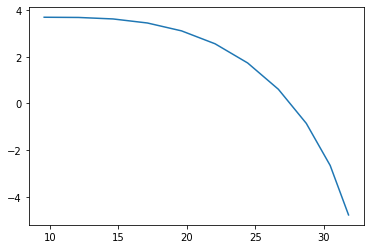

In [38]:
x_warm, x_des_warm = response_MPC.forward_simulate_all(response_x0.reshape(6,1), u_warm)
plt.plot(x_warm[0,:], x_warm[1,:])

In [34]:
for i in range(len(nonresponse_x_list)):
    print(nonresponse_x_list[i].shape)

(6, 11)


In [19]:
len(temp_amb_nonresponse)

2